# Welcome to Colab!

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler,RobustScaler
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,TargetEncoder
from sklearn.impute import SimpleImputer

# polynomial_features
from sklearn.preprocessing import PolynomialFeatures

# Pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Imblearn for SMOTE pipeline
from imblearn.pipeline import Pipeline as Imblearn_Pipeline
from imblearn.over_sampling import SMOTE
from scipy.stats import chi2_contingency

# Models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
import xgboost as xgb

# Evaluation Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score

# Evaluation
from sklearn.metrics import confusion_matrix, classification_report,roc_curve, auc
#Hyperparameter Tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [ ]:
import sklearn
print(sklearn.__version__)

1.6.1


In [ ]:
import joblib
print(joblib.__version__)

1.6.0


In [ ]:
# Reading the file
df = pd.read_csv("/content/zepto_orders_raw.csv")

print("Orders Shape:", df.shape)
df.head()

Orders Shape: (81280, 39)


,order_id,order_placed_at,store_id,store_lat,store_lon,delivery_zone,city,city_tier,customer_lat,customer_lon,...,previous_acceptance_rate,rider_earnings_today,current_incentive,delivery_charge,delivery_time_minutes,rider_accepted,historical_delivery_cost,historical_travel_time,promo_code_applied,data_source
0,ZPO0030634,2026-03-22 22:33:00,DS0027,12.846820,77.573191,BEN-Z13,Bengaluru,1,12.860161,77.575804,...,0.783,291.63,28.0,51.40,20.76,1,50.940,24.935,NaN,zepto_ops_export_v2
1,ZPO0008581,16/02/2026 14:16,DS0044,19.045278,72.894492,MUM-Z05,Mumbai,1,19.039069,72.904669,...,0.582,478.75,40.0,45.76,26.00,1,63.748,30.733,NaN,zepto_ops_export_v2
2,ZPO0056490,2026-02-19 13:46:00,DS0035,17.432337,78.531114,HYD-Z07,Hyderabad,1,17.441617,78.514133,...,0.835,951.57,45.61,51.81,21.82,1,56.481,26.108,NaN,zepto_ops_export_v2
3,ZPO0043495,2026-02-25 20:51:00,DS0024,13.065923,77.533601,BEN-Z10,Bengaluru,1,13.079372,77.549791,...,0.928,1537.62,52.71,65.78,30.36,1,68.848,35.267,NaN,zepto_ops_export_v2
4,ZPO0004606,28/02/2026 23:29,DS0028,12.972781,77.610699,BEN-Z14,Bengaluru,1,12.969402,77.619637,...,0.875,1160.02,20.2,43.29,13.58,1,44.424,22.317,NaN,zepto_ops_export_v2


In [ ]:
reviews = pd.read_csv("/content/zepto_reviews_raw.csv")

print("Reviews Shape:", reviews.shape)
reviews.head()

Reviews Shape: (8240, 10)


,review_id,order_id,user_id,product_id,review_text,rating,sentiment,topic,review_date,language
0,RV0001920,ZPO0027335,U00219,46,seriously items were packed neatly with proper...,4.0,positive,packaging,2026-04-13,english
1,RV0004656,ZPO0066472,U02245,27,seriously support agent was useless and kept r...,1.0,negative,customer_support,2026-03-25,english
2,RV0001840,ZPO0071302,U02749,79,guys advertised offer was not applied to my or...,NaN,negative,offers,2026-03-24,english
3,RV0004878,ZPO0078797,U02186,81,"Coca Cola Coca Cola expiry date already over, ...",2.0,negative,product,2026-01-27,tanglish
4,RV0003821,ZPO0017795,U02873,83,honestly order got cancelled automatically wit...,1.0,negative,order,2026-03-20,english


In [ ]:
print("ORDERS DATA")
print("=" * 50)

print("Shape:", df.shape)
print("\nColumns:")
print(df.columns.tolist())

print("\nData Types:")
print(df.dtypes)

ORDERS DATA
Shape: (81280, 39)

Columns:
['order_id', 'order_placed_at', 'store_id', 'store_lat', 'store_lon', 'delivery_zone', 'city', 'city_tier', 'customer_lat', 'customer_lon', 'distance_km', 'road_type', 'traffic_index', 'rainfall_mm', 'weather_condition', 'hour', 'weekday', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag', 'item_count', 'order_amount', 'order_weight_kg', 'membership_type', 'demand_level', 'vehicle_type', 'rider_experience_months', 'current_rider_load', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive', 'delivery_charge', 'delivery_time_minutes', 'rider_accepted', 'historical_delivery_cost', 'historical_travel_time', 'promo_code_applied', 'data_source']

Data Types:
order_id                     object
order_placed_at              object
store_id                     object
store_lat                   float64
store_lon                   float64
delivery_zone                object
city                         object
city_tie

In [ ]:
df.describe()

,store_lat,store_lon,city_tier,customer_lat,customer_lon,distance_km,rainfall_mm,hour,weekday,item_count,...,rider_experience_months,current_rider_load,previous_acceptance_rate,rider_earnings_today,delivery_charge,delivery_time_minutes,rider_accepted,historical_delivery_cost,historical_travel_time,promo_code_applied
count,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,77297.000000,81280.000000,81280.000000,81280.000000,...,78861.000000,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,81280.000000,0.0
mean,16.490473,77.413387,1.260101,16.490557,77.413404,2.837277,1.166346,15.046457,3.026624,5.146543,...,-4.250074,1.504909,0.714176,1209.498385,55.407908,27.069090,0.607185,60.227824,29.274710,NaN
std,5.641464,2.287608,0.627128,5.641395,2.287637,2.715368,3.181102,5.037404,2.005800,3.118807,...,140.692768,1.118338,0.142146,728.485310,19.973909,11.640932,0.488379,22.839664,11.105544,NaN
min,9.824670,72.774727,1.000000,9.729386,72.691804,-3.200000,0.000000,0.000000,0.000000,1.000000,...,-999.000000,0.000000,0.146000,7.660000,10.000000,6.070000,0.000000,4.324000,2.188000,NaN
25%,12.985599,77.020962,1.000000,12.980732,77.049719,1.619000,0.000000,11.000000,1.000000,3.000000,...,7.800000,1.000000,0.622000,674.187500,42.920000,19.520000,0.000000,50.127750,24.150000,NaN
50%,13.102544,77.573191,1.000000,13.103186,77.580275,2.338000,0.000000,16.000000,3.000000,5.000000,...,13.200000,2.000000,0.730000,1059.925000,52.370000,24.410000,1.000000,57.620000,27.889000,NaN
75%,19.020807,78.544213,1.000000,19.029482,78.544406,3.412000,0.000000,19.000000,5.000000,7.000000,...,20.500000,3.000000,0.823000,1583.502500,63.770000,31.550000,1.000000,65.830000,32.129250,NaN
max,28.746180,80.313144,3.000000,28.841977,80.405665,123.540000,53.740000,23.000000,6.000000,28.000000,...,90.000000,3.000000,0.990000,4200.000000,284.370000,205.530000,1.000000,593.332000,277.971000,NaN


#data inspection and data cleaning

In [ ]:
df.duplicated().sum()

np.int64(218)

In [ ]:
df['order_id'].duplicated().sum()

np.int64(1280)

In [ ]:
df.drop_duplicates(inplace=True)
df.shape

(81062, 39)

In [ ]:
df = df.drop_duplicates(subset="order_id",keep="first").reset_index(drop=True)

In [ ]:
df["order_placed_at"] = pd.to_datetime(
    df["order_placed_at"],
    errors="coerce"
)

In [ ]:
df["order_placed_at"].dtype

dtype('<M8[ns]')

In [ ]:
# Datetime columns
df["order_placed_at"] = pd.to_datetime(df["order_placed_at"], errors="coerce")
#df["traffic_index"] = pd.to_datetime(df["traffic_index"], errors="coerce")
df["rider_rating"] = pd.to_numeric(df["rider_rating"], errors="coerce")


In [ ]:
df.dtypes

,0
order_id,object
order_placed_at,datetime64[ns]
store_id,object
store_lat,float64
store_lon,float64
delivery_zone,object
city,object
city_tier,int64
customer_lat,float64
customer_lon,float64


In [ ]:
df.isnull().sum()

,0
order_id,0
order_placed_at,9576
store_id,0
store_lat,0
store_lon,0
delivery_zone,0
city,0
city_tier,0
customer_lat,0
customer_lon,0


In [ ]:
df['order_placed_at'].describe()

,order_placed_at
count,70424
mean,2026-04-04 10:48:48.653299712
min,2026-01-01 05:13:00
25%,2026-02-15 13:09:00
50%,2026-04-01 22:02:00
75%,2026-05-16 20:03:00
max,2028-12-15 20:10:00


In [ ]:
df["order_placed_at"] = df["order_placed_at"].fillna(df["order_placed_at"].median())

In [ ]:
df['traffic_index'].unique()

array(['0.5455', '0.414', '0.6352', ..., '0.9038', '24.2%', '83.9%'],
      dtype=object)

In [ ]:
df["traffic_index"] = (
    df["traffic_index"]
    .astype("string")
    .str.strip()
    .str.replace("%", "", regex=False)
)

df["traffic_index"] = pd.to_numeric(
    df["traffic_index"],
    errors="coerce"
)

df.loc[df["traffic_index"] > 1, "traffic_index"] = (
    df.loc[df["traffic_index"] > 1, "traffic_index"] / 100
)

In [ ]:
df["traffic_index"].describe()

,traffic_index
count,77661.0
mean,0.558044
std,0.177688
min,0.1814
25%,0.3985
50%,0.5777
75%,0.6992
max,0.98


In [ ]:
df["traffic_index"] = df["traffic_index"].fillna(df["traffic_index"].median())

In [ ]:
df["traffic_index"].isnull().sum()

np.int64(0)

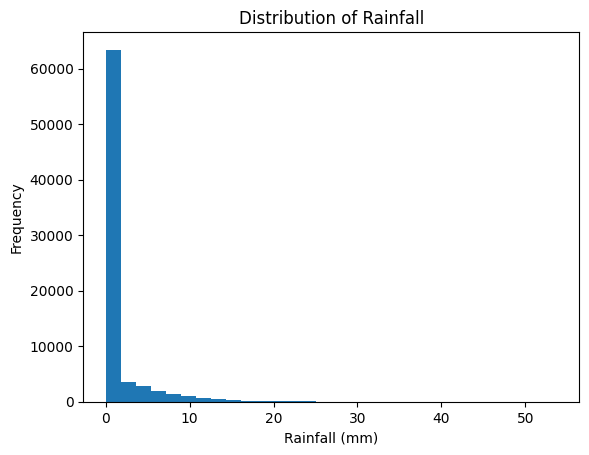

In [ ]:
df['rainfall_mm'].plot(kind="hist", bins=30)

plt.xlabel("Rainfall (mm)")
plt.ylabel("Frequency")
plt.title("Distribution of Rainfall")
plt.show()

In [ ]:
df["rainfall_mm"].unique()

array([ 0.  ,   nan, 13.87, ..., 16.7 , 28.23, 40.52])

In [ ]:
df["rainfall_mm"]=df["rainfall_mm"].fillna(df["rainfall_mm"].median())

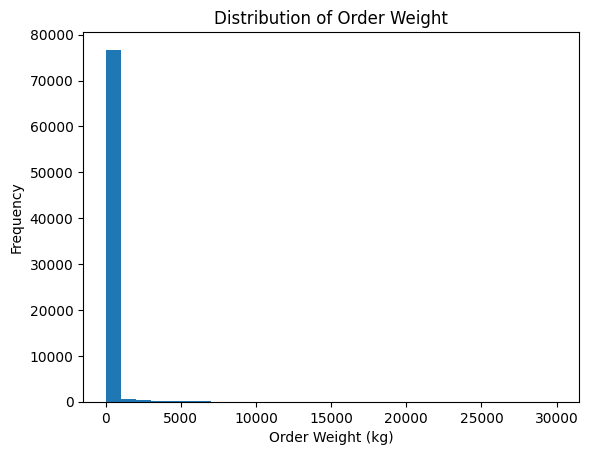

In [ ]:
df['order_weight_kg'].plot(kind="hist", bins=30)

plt.xlabel("Order Weight (kg)")
plt.ylabel("Frequency")
plt.title("Distribution of Order Weight")
plt.show()

In [ ]:
df["order_weight_kg"]=df["order_weight_kg"].fillna(df["order_weight_kg"].median())

In [ ]:
df['rider_experience_months'].describe().T

,rider_experience_months
count,77620.000000
mean,-4.203444
std,140.520809
min,-999.000000
25%,7.800000
50%,13.200000
75%,20.500000
max,90.000000


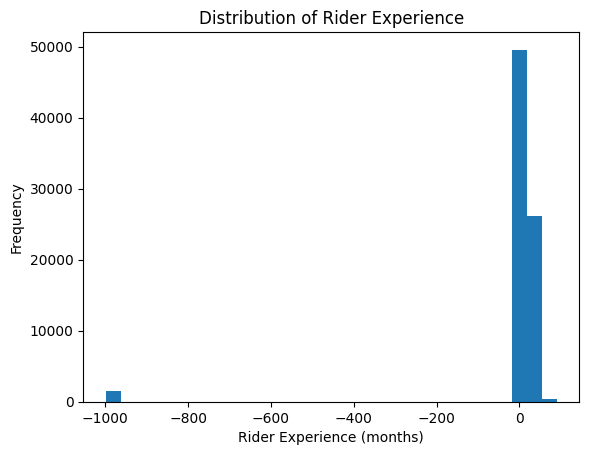

In [ ]:
df['rider_experience_months'].plot(kind="hist", bins=30)

plt.xlabel("Rider Experience (months)")
plt.ylabel("Frequency")
plt.title("Distribution of Rider Experience")
plt.show()

In [ ]:
df["rider_experience_months"] = df["rider_experience_months"].replace(-999, np.nan)

In [ ]:
df['rider_experience_months']=df['rider_experience_months'].fillna(df["rider_experience_months"].median())

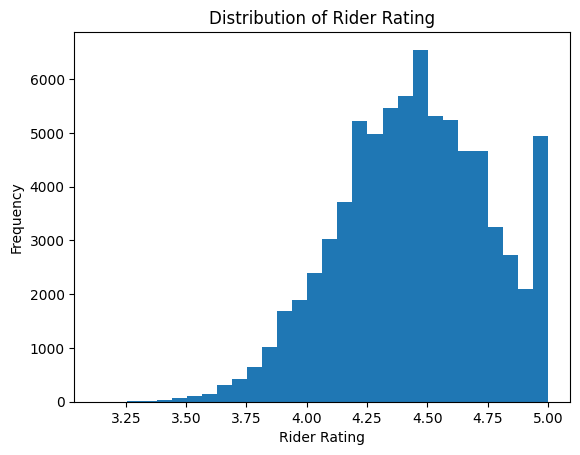

In [ ]:
df['rider_rating'] = pd.to_numeric(df['rider_rating'], errors='coerce')
df['rider_rating'].plot(kind='hist', bins=30)

plt.xlabel("Rider Rating")
plt.ylabel("Frequency")
plt.title("Distribution of Rider Rating")
plt.show()

In [ ]:
df["rider_rating"].value_counts(dropna=False)

,count
rider_rating,
NaN,3726
5.00,3433
4.47,998
4.49,981
4.38,981
...,...
3.37,1
3.33,1
3.15,1


In [ ]:
df["rider_rating"].unique()

array([4.71, 4.03, 4.81, 4.8 , 4.47, 4.39,  nan, 4.19, 4.35, 4.62, 4.78,
       4.95, 4.7 , 4.24, 4.57, 3.98, 4.56, 4.26, 4.16, 4.2 , 4.36, 4.45,
       4.54, 4.4 , 4.64, 4.52, 4.86, 4.1 , 4.93, 3.8 , 4.53, 4.23, 3.94,
       4.65, 4.91, 4.01, 5.  , 3.75, 4.02, 4.07, 4.48, 4.29, 4.59, 4.66,
       4.21, 4.33, 4.44, 4.49, 3.89, 4.41, 4.73, 4.09, 3.78, 4.77, 4.51,
       3.86, 4.74, 3.97, 4.38, 4.42, 4.5 , 4.9 , 4.27, 4.88, 4.97, 4.76,
       4.58, 4.6 , 3.9 , 4.55, 4.72, 4.3 , 4.14, 4.84, 4.96, 4.22, 4.75,
       4.46, 3.51, 4.31, 4.61, 4.34, 4.15, 4.68, 4.69, 4.18, 3.83, 4.11,
       4.28, 3.87, 4.32, 4.98, 4.17, 4.63, 4.67, 4.13, 4.87, 4.43, 3.82,
       3.81, 3.92, 4.83, 4.06, 3.96, 4.99, 4.  , 4.37, 4.25, 4.94, 3.95,
       4.05, 4.89, 4.92, 4.12, 4.85, 3.71, 3.99, 4.04, 3.88, 4.08, 3.74,
       4.82, 3.91, 4.79, 3.76, 3.62, 3.73, 3.84, 3.48, 3.79, 3.7 , 3.63,
       3.93, 3.85, 3.68, 3.77, 3.67, 3.66, 3.45, 3.6 , 3.72, 3.59, 3.69,
       3.52, 3.56, 3.64, 3.65, 3.34, 3.61, 3.5 , 3.

In [ ]:
df['rider_rating']=df["rider_rating"].fillna(df["rider_rating"].median())

In [ ]:
df.drop("promo_code_applied", axis=1, inplace=True)

In [ ]:
df.shape

(80000, 38)

In [ ]:
df['membership_type'].unique()

array(['none', 'pass', 'pass_plus', ' none', '-', 'PASS', 'no', ' pass',
       'pass_plus ', 'Pass', ' pass_plus', 'passplus', 'NONE', nan,
       'PASS_PLUS', 'none ', 'pass ', 'Pass Plus', 'pass+', 'zepto_pass',
       'zeptopass'], dtype=object)

In [ ]:
df["membership_type"] = (df["membership_type"].astype("string").str.strip().str.lower())

In [ ]:
df["membership_type"] = df["membership_type"].replace({
    "no": "none",
    "-": "none",

    "pass": "pass",

    "pass_plus": "pass_plus",
    "passplus": "pass_plus",
    "pass+": "pass_plus",
    "pass plus": "pass_plus",

    "zepto_pass": "pass_plus",
    "zeptopass": "pass_plus"
})

In [ ]:
df["membership_type"].unique()

<StringArray>
['none', 'pass', 'pass_plus', <NA>]
Length: 4, dtype: string

In [ ]:
df["membership_type"] = df["membership_type"].fillna("none")

In [ ]:
df.isnull().mean()*100

,0
order_id,0.0
order_placed_at,0.0
store_id,0.0
store_lat,0.0
store_lon,0.0
delivery_zone,0.0
city,0.0
city_tier,0.0
customer_lat,0.0
customer_lon,0.0


#Numerical columns check

In [ ]:
df.describe(include=['int64','float64']).T

,count,mean,std,min,25%,50%,75%,max
store_lat,80000.0,16.494025,5.644547,9.82467,12.985599,13.102544,19.020807,28.74618
store_lon,80000.0,77.415553,2.286182,72.774727,77.10169,77.573191,78.544213,80.313144
city_tier,80000.0,1.2598,0.626785,1.0,1.0,1.0,1.0,3.0
customer_lat,80000.0,16.494096,5.644479,9.729386,12.980742,13.103252,19.029555,28.841977
customer_lon,80000.0,77.415568,2.286217,72.691804,77.057949,77.580531,78.5446,80.405665
distance_km,80000.0,2.835313,2.709888,-3.2,1.619,2.337,3.41,123.54
traffic_index,80000.0,0.558618,0.175102,0.1814,0.4024,0.5777,0.6958,0.98
rainfall_mm,80000.0,1.109386,3.113874,0.0,0.0,0.0,0.0,53.74
hour,80000.0,15.046938,5.038673,0.0,11.0,16.0,19.0,23.0
weekday,80000.0,3.026238,2.005985,0.0,1.0,3.0,5.0,6.0


In [ ]:
(df["distance_km"] < 0).sum()

np.int64(40)

In [ ]:
df.loc[df["distance_km"] < 0, "distance_km"].unique()

array([-3.2])

In [ ]:
df.columns

Index(['order_id', 'order_placed_at', 'store_id', 'store_lat', 'store_lon',
       'delivery_zone', 'city', 'city_tier', 'customer_lat', 'customer_lon',
       'distance_km', 'road_type', 'traffic_index', 'rainfall_mm',
       'weather_condition', 'hour', 'weekday', 'peak_hour_flag',
       'weekend_flag', 'festival_day_flag', 'item_count', 'order_amount',
       'order_weight_kg', 'membership_type', 'demand_level', 'vehicle_type',
       'rider_experience_months', 'current_rider_load', 'rider_rating',
       'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive',
       'delivery_charge', 'delivery_time_minutes', 'rider_accepted',
       'historical_delivery_cost', 'historical_travel_time', 'data_source'],
      dtype='object')

In [ ]:
df["distance_km"].isnull().sum()

np.int64(0)

In [ ]:
#df.groupby('city')['distance_km'].mean().sort_values(ascending=False)

In [ ]:

df.loc[df["distance_km"] < 0, "distance_km"] = np.nan

In [ ]:
overall_median = df["distance_km"].median()

df["distance_km"] = df.groupby("city")["distance_km"].transform(
    lambda x: x.fillna(x.median())
)

df["distance_km"] = df["distance_km"].fillna(overall_median)

In [ ]:
df.describe(include=['int64','float64']).T

,count,mean,std,min,25%,50%,75%,max
store_lat,80000.0,16.494025,5.644547,9.82467,12.985599,13.102544,19.020807,28.74618
store_lon,80000.0,77.415553,2.286182,72.774727,77.10169,77.573191,78.544213,80.313144
city_tier,80000.0,1.2598,0.626785,1.0,1.0,1.0,1.0,3.0
customer_lat,80000.0,16.494096,5.644479,9.729386,12.980742,13.103252,19.029555,28.841977
customer_lon,80000.0,77.415568,2.286217,72.691804,77.057949,77.580531,78.5446,80.405665
distance_km,80000.0,2.83808,2.706548,0.0,1.62,2.338,3.41,123.54
traffic_index,80000.0,0.558618,0.175102,0.1814,0.4024,0.5777,0.6958,0.98
rainfall_mm,80000.0,1.109386,3.113874,0.0,0.0,0.0,0.0,53.74
hour,80000.0,15.046938,5.038673,0.0,11.0,16.0,19.0,23.0
weekday,80000.0,3.026238,2.005985,0.0,1.0,3.0,5.0,6.0


In [ ]:
print(df["distance_km"].describe(
    percentiles=[0.90, 0.95, 0.97, 0.98, 0.99]
))

count    80000.000000
mean         2.838080
std          2.706548
min          0.000000
50%          2.338000
90%          4.783000
95%          5.899050
97%          6.826030
98%          7.659000
99%          9.440050
max        123.540000
Name: distance_km, dtype: float64


In [ ]:
limits = [10, 20, 30, 40, 50, 75, 100]

for limit in limits:
    count = (df["distance_km"] > limit).sum()
    percentage = count / len(df) * 100
    print(f">{limit} km : {count} rows ({percentage:.3f}%)")

>10 km : 700 rows (0.875%)
>20 km : 232 rows (0.290%)
>30 km : 134 rows (0.168%)
>40 km : 78 rows (0.097%)
>50 km : 44 rows (0.055%)
>75 km : 13 rows (0.016%)
>100 km : 3 rows (0.004%)


In [ ]:
print(df["distance_km"].describe(
    percentiles=[0.90, 0.95, 0.97, 0.98, 0.99]
))

print("Missing:", df["distance_km"].isna().sum())
print("Negative:", (df["distance_km"] < 0).sum())
print("Zero:", (df["distance_km"] == 0).sum())
print(">20 km:", (df["distance_km"] > 20).sum())

count    80000.000000
mean         2.838080
std          2.706548
min          0.000000
50%          2.338000
90%          4.783000
95%          5.899050
97%          6.826030
98%          7.659000
99%          9.440050
max        123.540000
Name: distance_km, dtype: float64
Missing: 0
Negative: 0
Zero: 40
>20 km: 232


In [ ]:


def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km

    lat1, lon1, lat2, lon2 = map(
        np.radians, [lat1, lon1, lat2, lon2]
    )

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = (
        np.sin(dlat / 2)**2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    )

    return 2 * R * np.arcsin(np.sqrt(a))


df["coordinate_distance_km"] = haversine(
    df["store_lat"],
    df["store_lon"],
    df["customer_lat"],
    df["customer_lon"]
)

In [ ]:
zero_distance = df[df["distance_km"] == 0]

zero_distance[
    [
        "distance_km",
        "coordinate_distance_km",
        "store_lat",
        "store_lon",
        "customer_lat",
        "customer_lon",
        "city"
    ]
]

,distance_km,coordinate_distance_km,store_lat,store_lon,customer_lat,customer_lon,city
354,0.0,2.888982,12.320210,76.658884,12.318305,76.685406,Mysuru
382,0.0,5.926610,19.116791,72.774727,19.098460,72.721761,Mumbai
1131,0.0,2.853394,13.066524,80.254772,13.060782,80.280447,Chennai
1953,0.0,7.015943,28.620075,77.286468,28.583757,77.227701,Delhi NCR
3025,0.0,1.739437,12.846820,77.573191,12.854436,77.587206,Bengaluru
3464,0.0,4.292539,17.383957,78.480301,17.385829,78.520705,Hyderabad
4674,0.0,4.583004,28.640905,77.121366,28.681971,77.125369,Delhi NCR
6226,0.0,4.874266,12.985599,77.595719,12.989989,77.550959,Bengaluru
7035,0.0,4.433143,19.152033,72.838243,19.186184,72.816464,Mumbai
7590,0.0,1.493555,28.562492,77.247599,28.549169,77.245656,Delhi NCR


In [ ]:
df["distance_ratio"] = (
    df["distance_km"] / df["coordinate_distance_km"]
)

over_10 = df[df["distance_km"] > 10]

print(over_10["distance_ratio"].describe())

count    700.000000
mean       5.692811
std        4.499033
min        0.999952
25%        1.000006
50%        9.997123
75%       10.000026
max       10.004360
Name: distance_ratio, dtype: float64


In [ ]:

mask = (
    (df["distance_km"] > 20) &
    (df["distance_ratio"].between(9.5, 10.5))
)

print("Records to correct:", mask.sum())

df.loc[mask, "distance_km"] = (
    df.loc[mask, "distance_km"] / 10
)

Records to correct: 232


In [ ]:
over_10 = df[df["distance_km"] > 10].copy()

print("Total >10 km:", len(over_10))

print(
    "Ratio approximately 1:",
    over_10["distance_ratio"].between(0.95, 1.05).sum()
)

print(
    "Ratio approximately 10:",
    over_10["distance_ratio"].between(9.5, 10.5).sum()
)

print(
    "Other ratios:",
    (
        ~over_10["distance_ratio"].between(0.95, 1.05)
        & ~over_10["distance_ratio"].between(9.5, 10.5)
    ).sum()
)

Total >10 km: 471
Ratio approximately 1: 335
Ratio approximately 10: 136
Other ratios: 0


In [ ]:
mask_10x = (
    (df["distance_km"] > 10) &
    (df["distance_ratio"].between(9.5, 10.5))
)

print("10x records:", mask_10x.sum())

df.loc[mask_10x, "distance_km"] = (
    df.loc[mask_10x, "distance_km"] / 10
)

10x records: 136


In [ ]:
normal = df[
    (df["distance_km"] > 0) &
    (df["distance_km"] <= 10)
].copy()

normal["ratio"] = (
    normal["distance_km"] /
    normal["coordinate_distance_km"]
)

print(normal["ratio"].describe())

count    79625.000000
mean         1.003014
std          0.160709
min          0.100002
25%          0.999905
50%          1.000002
75%          1.000097
max         10.004578
Name: ratio, dtype: float64


In [ ]:
mask_10x = (
    (df["distance_km"] > 10) &
    (df["distance_ratio"].between(9.5, 10.5))
)

print("10x records:", mask_10x.sum())

df.loc[mask_10x, "distance_km"] = (
    df.loc[mask_10x, "distance_km"] / 10
)

10x records: 0


In [ ]:
zero_mask = df["distance_km"] == 0

print("Zero distance records:", zero_mask.sum())

df.loc[zero_mask, "distance_km"] = (
    df.loc[zero_mask, "coordinate_distance_km"]
)

Zero distance records: 40


In [ ]:
df["order_amount"] = (
    df["order_amount"]
    .astype(str)
    .str.replace(r"[^0-9.]", "", regex=True)
)

df["current_incentive"] = (
    df["current_incentive"]
    .astype(str)
    .str.replace(r"[^0-9.]", "", regex=True)
)

# Convert to numeric
df["order_amount"] = pd.to_numeric(df["order_amount"], errors="coerce")
df["current_incentive"] = pd.to_numeric(df["current_incentive"], errors="coerce")

In [ ]:
print("Invalid order_amount:",
      df["order_amount"].isna().sum())

print("Invalid current_incentive:",
      df["current_incentive"].isna().sum())

Invalid order_amount: 0
Invalid current_incentive: 0


In [ ]:
print(df[["order_amount", "current_incentive"]].head(20))

    order_amount  current_incentive
0          52.43              28.00
1         145.17              40.00
2          49.17              45.61
3          57.96              52.71
4         239.13              20.20
5         153.26              51.72
6         242.08              19.01
7          50.79              38.46
8         287.08              36.61
9         115.02              35.73
10         68.95              34.46
11        252.15              48.04
12        122.07              22.14
13         73.34              35.33
14        172.84              62.38
15         56.22              41.81
16        623.55              23.37
17        111.97              39.18
18        245.48              38.92
19        179.45              47.43


In [ ]:
limits = [10, 20, 30, 50, 100, 500, 1000]

for limit in limits:
    count = (df["order_weight_kg"] > limit).sum()
    percentage = count / len(df) * 100

    print(f"> {limit:4} kg : {count:6} rows ({percentage:.3f}%)")

>   10 kg :   3742 rows (4.677%)
>   20 kg :   2435 rows (3.044%)
>   30 kg :   2366 rows (2.958%)
>   50 kg :   2366 rows (2.958%)
>  100 kg :   2366 rows (2.958%)
>  500 kg :   2053 rows (2.566%)
> 1000 kg :   1649 rows (2.061%)


In [ ]:
df["order_weight_kg"].describe(
    percentiles=[0.90, 0.95, 0.96, 0.97, 0.98, 0.99]
)

,order_weight_kg
count,80000.000000
mean,74.837364
std,599.335985
min,0.150000
50%,1.796000
90%,6.182000
95%,9.560100
96%,11.451640
97%,23.396900
98%,1061.040000


In [ ]:
df[df["order_weight_kg"] > 50][[
    "order_weight_kg",
    "item_count",
    "order_amount",
    "distance_km",
    "delivery_time_minutes"
]].sort_values(
    "order_weight_kg",
    ascending=False
).head(30)

,order_weight_kg,item_count,order_amount,distance_km,delivery_time_minutes
57538,30000.0,24,1100.26,11.051,73.86
49857,29718.0,17,1105.45,1.305,20.39
32620,24201.0,12,671.24,6.048,33.81
71573,21106.0,19,928.84,1.867,29.50
45046,19146.0,10,301.45,2.027,24.70
69726,18839.0,11,269.32,2.388,44.03
34318,17485.0,19,748.66,2.568,30.89
65082,16647.0,9,74.21,1.801,20.99
41236,16325.0,11,224.40,2.934,46.10
7346,16254.0,18,245.92,2.953,35.74


In [ ]:
df[df["order_weight_kg"] > 20][["order_weight_kg"]].sort_values(
    "order_weight_kg", ascending=False
).head(20)

,order_weight_kg
57538,30000.0
49857,29718.0
32620,24201.0
71573,21106.0
45046,19146.0
69726,18839.0
34318,17485.0
65082,16647.0
41236,16325.0
7346,16254.0


In [ ]:
# Identify invalid values
invalid_weight = df["order_weight_kg"] > 30

# Summary
print("Total rows:", len(df))
print("Invalid weight rows:", invalid_weight.sum())
print("Invalid percentage:", invalid_weight.mean() * 100)

# Valid data distribution
print("\nValid order weight distribution:")
print(
    df.loc[~invalid_weight, "order_weight_kg"].describe(
        percentiles=[0.90, 0.95, 0.97, 0.98, 0.99]
    )
)

Total rows: 80000
Invalid weight rows: 2366
Invalid percentage: 2.9575

Valid order weight distribution:
count    77634.000000
mean         2.467039
std          2.434026
min          0.150000
50%          1.774000
90%          5.387000
95%          7.169700
97%          8.568030
98%          9.676020
99%         11.621010
max         30.000000
Name: order_weight_kg, dtype: float64


In [ ]:
# Convert values stored in grams to kilograms
mask = df["order_weight_kg"] > 30

df.loc[mask, "order_weight_kg"] = (
    df.loc[mask, "order_weight_kg"] / 1000
)

In [ ]:
print("Values > 30 kg:", (df["order_weight_kg"] > 30).sum())
print("Values <= 0:", (df["order_weight_kg"] <= 0).sum())
print("Missing:", df["order_weight_kg"].isna().sum())

Values > 30 kg: 0
Values <= 0: 0
Missing: 0


In [ ]:
print(df["order_weight_kg"].describe(
    percentiles=[0.90, 0.95, 0.97, 0.98, 0.99]
))

count    80000.000000
mean         2.466520
std          2.436517
min          0.150000
50%          1.772000
90%          5.385000
95%          7.161000
97%          8.554030
98%          9.668060
99%         11.629010
max         30.000000
Name: order_weight_kg, dtype: float64


In [ ]:
df.describe(include=['int64','float64']).T


,count,mean,std,min,25%,50%,75%,max
store_lat,80000.0,16.494025,5.644547,9.82467,12.985599,13.102544,19.020807,28.74618
store_lon,80000.0,77.415553,2.286182,72.774727,77.10169,77.573191,78.544213,80.313144
city_tier,80000.0,1.2598,0.626785,1.0,1.0,1.0,1.0,3.0
customer_lat,80000.0,16.494096,5.644479,9.729386,12.980742,13.103252,19.029555,28.841977
customer_lon,80000.0,77.415568,2.286217,72.691804,77.057949,77.580531,78.5446,80.405665
distance_km,80000.0,2.717377,1.601438,0.3,1.618,2.331,3.391,13.987
traffic_index,80000.0,0.558618,0.175102,0.1814,0.4024,0.5777,0.6958,0.98
rainfall_mm,80000.0,1.109386,3.113874,0.0,0.0,0.0,0.0,53.74
hour,80000.0,15.046938,5.038673,0.0,11.0,16.0,19.0,23.0
weekday,80000.0,3.026238,2.005985,0.0,1.0,3.0,5.0,6.0


#outliers

In [ ]:
numerical_cols = [
    "rainfall_mm",
    "item_count",
    "order_amount",
    "order_weight_kg",
    "rider_experience_months",
    "rider_earnings_today",
    "current_incentive",
    "delivery_charge",
    "delivery_time_minutes",
    "historical_delivery_cost",
    "historical_travel_time"
]

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = ((df[col] < lower) | (df[col] > upper)).sum()

    print(
        f"{col:30} "
        f"Q1={Q1:.2f}  "
        f"Q3={Q3:.2f}  "
        f"Upper={upper:.2f}  "
        f"Outliers={outliers}"
    )

rainfall_mm                    Q1=0.00  Q3=0.00  Upper=0.00  Outliers=15656
item_count                     Q1=3.00  Q3=7.00  Upper=13.00  Outliers=1483
order_amount                   Q1=64.41  Q3=219.53  Upper=452.21  Outliers=3939
order_weight_kg                Q1=0.87  Q3=3.21  Upper=6.72  Outliers=4712
rider_experience_months        Q1=8.40  Q3=20.20  Upper=37.90  Outliers=2636
rider_earnings_today           Q1=674.25  Q3=1582.99  Upper=2946.10  Outliers=2329
current_incentive              Q1=35.84  Q3=58.84  Upper=93.34  Outliers=2427
delivery_charge                Q1=42.91  Q3=63.76  Upper=95.03  Outliers=3233
delivery_time_minutes          Q1=19.51  Q3=31.54  Upper=49.58  Outliers=3723
historical_delivery_cost       Q1=50.14  Q3=65.83  Upper=89.36  Outliers=11115
historical_travel_time         Q1=24.15  Q3=32.13  Upper=44.09  Outliers=9207


In [ ]:
print(
    df[df["order_amount"] > 500][
        ["item_count", "order_weight_kg", "order_amount"]
    ]
    .sort_values("order_amount", ascending=False)
    .head(20)
)

       item_count  order_weight_kg  order_amount
912            16            9.577       3019.29
20677          16            3.335       2241.09
65893          15           17.257       2095.10
77694          18            1.796       1970.88
1789           14            7.690       1905.51
76014          23            9.800       1890.04
21281          19            2.816       1734.67
31910          20            3.904       1702.40
833            16            2.948       1701.68
38490          16            5.956       1682.98
45414          21            5.379       1660.89
20731          16            9.593       1640.54
22410          16            3.708       1636.93
41154          25            9.989       1604.24
21105          13            8.621       1586.86
13153          19           12.210       1576.12
77520          17           10.412       1569.06
37541          19            9.857       1500.74
627            13           18.545       1490.47
32626          28   

In [ ]:
print(
    df[df["rider_earnings_today"] > 3000][
        [
            "rider_earnings_today",
            "rider_experience_months",
            "current_incentive",
            "current_rider_load"
        ]
    ]
    .sort_values("rider_earnings_today", ascending=False)
    .head(20)
)

       rider_earnings_today  rider_experience_months  current_incentive  \
79918                4200.0                     13.1              24.82   
966                  4200.0                     17.9              58.78   
79604                4200.0                      5.8              71.64   
28100                4200.0                     16.3              58.46   
56388                4200.0                      7.6              42.56   
55387                4200.0                     13.5              38.55   
58782                4200.0                     36.6              34.68   
11709                4200.0                     12.9              26.62   
11626                4200.0                     23.6              55.62   
11328                4200.0                     29.7              39.64   
58297                4200.0                     10.9              30.29   
55038                4200.0                      2.8              37.28   
54984                4200

In [ ]:
print(
    df[df["current_incentive"] > 100][
        [
            "current_incentive",
            "delivery_charge",
            "distance_km",
            "traffic_index"
        ]
    ]
    .sort_values("current_incentive", ascending=False)
    .head(20)
)

       current_incentive  delivery_charge  distance_km  traffic_index
13770             217.76           246.61       13.063         0.7956
40865             217.41           185.15       13.116         0.8109
16035             211.97           203.03       12.843         0.8056
3133              204.34           180.31       13.071         0.5777
73643             197.40           224.83       13.493         0.6818
2434              197.09           145.35       13.987         0.3509
75570             195.30           208.79       10.781          0.827
43909             194.60           139.96       13.480         0.5513
21307             189.82           175.78       13.985         0.3025
32181             189.15           169.11       13.984         0.3685
71903             189.00           168.63       13.437         0.5777
57185             188.48           164.37       11.971         0.8231
37055             188.06           172.03       12.095         0.6637
9144              18

In [ ]:
print(
    df[df["delivery_charge"] > 150][
        [
            "distance_km",
            "traffic_index",
            "delivery_charge"
        ]
    ]
    .sort_values("delivery_charge", ascending=False)
    .head(20)
)

       distance_km  traffic_index  delivery_charge
57538       11.051         0.7391           284.37
18033       13.984         0.6217           251.40
1335        11.251         0.6565           247.50
13770       13.063         0.7956           246.61
25421       13.984         0.7919           242.54
49545       11.036         0.8232           238.87
37617       10.548          0.816           237.59
7452        11.901         0.8102           237.07
29771       11.534         0.7937           236.64
76019       13.986          0.838           235.38
57471       13.986         0.7844           233.63
79795       10.215         0.6713           232.21
36121        9.347          0.627           229.99
62793       11.620         0.6966           228.11
65486       13.986         0.6531           226.56
5865         9.942         0.7322           225.08
73643       13.493         0.6818           224.83
35287       10.144         0.9024           221.91
47501       10.115         0.75

In [ ]:
print(
    df[df["delivery_time_minutes"] > 60][
        [
            "distance_km",
            "traffic_index",
            "rainfall_mm",
            "hour",
            "delivery_time_minutes"
        ]
    ]
    .sort_values("delivery_time_minutes", ascending=False)
    .head(30)
)

       distance_km  traffic_index  rainfall_mm  hour  delivery_time_minutes
50376       12.406         0.7669         0.00    13                 205.53
8264        13.984         0.7855         3.30     8                 202.28
50315       13.984         0.8014         0.00    13                 186.98
64793        9.962         0.8197        10.12    19                 163.79
16225        9.237           0.98        16.10    13                 157.32
65768       10.175         0.8913        14.11    21                 149.13
885         13.981         0.6907         0.00    21                 149.04
20880       12.787         0.6637         0.00     8                 147.08
75512        8.999           0.98        14.61    20                 145.56
41163       10.517          0.436         4.30    15                 143.52
42174        9.773           0.71         0.00    19                 142.15
57471       13.986         0.7844         0.00     8                 138.95
46107       

In [ ]:
print(
    df[df["historical_travel_time"] > 60][
        [
            "distance_km",
            "traffic_index",
            "historical_travel_time"
        ]
    ]
    .sort_values("historical_travel_time", ascending=False)
    .head(30)
)

       distance_km  traffic_index  historical_travel_time
9181         6.156         0.5777                 277.971
55086        1.623         0.2007                 244.718
44600        4.178         0.3492                 224.770
23659        1.408         0.3602                 220.884
71494        1.936         0.3047                 200.009
35059        1.458         0.2021                 196.409
70154        1.702         0.2938                 192.425
38862        3.440         0.4149                 182.329
77013        3.007         0.4295                 176.440
59291        3.328         0.3474                 173.135
723          2.362          0.224                 169.540
36643        2.512         0.3825                 163.429
32004        2.062         0.4784                 163.183
72534        1.799          0.356                 161.020
15989        1.257         0.3335                 160.628
75999        1.888          0.326                 154.403
53050        0

## categorical columns check

In [ ]:
flag_columns = [
    "peak_hour_flag",
    "weekend_flag",
    "festival_day_flag"
]

for col in flag_columns:
    print("\n", col)
    print(df[col].value_counts(dropna=False))
    print("Unique:", df[col].unique())


 peak_hour_flag
peak_hour_flag
1        40162
0        37424
TRUE       657
Y          617
FALSE      598
N          542
Name: count, dtype: int64
Unique: ['0' '1' 'TRUE' 'N' 'FALSE' 'Y']

 weekend_flag
weekend_flag
0      55148
1      22518
No      1692
Yes      642
Name: count, dtype: int64
Unique: ['1' '0' 'No' 'Yes']

 festival_day_flag
festival_day_flag
0        74665
1         2994
N         1186
FALSE     1046
TRUE        55
Y           54
Name: count, dtype: int64
Unique: ['0' 'FALSE' '1' 'N' 'Y' 'TRUE']


In [ ]:
for col in flag_columns:
    df[col] = (df[col].astype("string").str.strip().str.lower()
         .map({
            "0": 0,
            "1": 1,
            "y": 1,
            "n": 0,
            "yes": 1,
            "no": 0,
            "true": 1,
            "false": 0
        })
    )

In [ ]:
for col in flag_columns:
    print("\n", col)
    print(df[col].value_counts(dropna=False))
    print("Unique:", df[col].unique())


 peak_hour_flag
peak_hour_flag
1    41436
0    38564
Name: count, dtype: int64
Unique: [0 1]

 weekend_flag
weekend_flag
0    56840
1    23160
Name: count, dtype: int64
Unique: [1 0]

 festival_day_flag
festival_day_flag
0    76897
1     3103
Name: count, dtype: int64
Unique: [0 1]


In [ ]:
categorical_cols = [
    "city",
    "road_type",
    "weather_condition",
    "membership_type",
    "demand_level",
    "vehicle_type"
]

for col in categorical_cols:
    print(f"\n--- {col} ---")
    print(df[col].value_counts(dropna=False))


--- city ---
city
Chennai             14637
Bengaluru           14603
Mumbai              11835
Hyderabad           10454
Delhi NCR           10442
Coimbatore           4314
Madurai              2934
Trichy               2217
Mysuru               2198
Bombay                385
mumbai                363
chennai               323
Madras                317
MAA                   290
hyd                   220
HYD                   216
Secunderabad          214
BANGALORE             205
madurai               199
Benglore              189
New Delhi             186
blr                   182
Bangalore             176
NCR                   165
delhi-ncr             161
Delhi                 159
bengaluru             159
mumbai                142
Bombay                129
chennai               113
MAA                   110
cbe                   109
Kovai                 104
Madras                101
kovai                  98
madurai                76
Tiruchirappalli        75
HYD                

In [ ]:
for col in categorical_cols:
    df[col] = df[col].astype("string").str.strip().str.lower()




In [ ]:
for col in categorical_cols:
    print(f"\n--- {col} ---")
    print(df[col].value_counts(dropna=False))


--- city ---
city
chennai            15073
bengaluru          14829
mumbai             12340
hyderabad          10454
delhi ncr          10442
coimbatore          4314
madurai             3209
trichy              2320
mysuru              2198
hyd                  582
bombay               514
bangalore            495
madras               418
maa                  400
secunderabad         286
kovai                275
blr                  254
new delhi            250
benglore             249
delhi-ncr            228
ncr                  222
delhi                202
mysore               192
cbe                  151
tiruchirappalli      103
Name: count, dtype: Int64

--- road_type ---
road_type
arterial       31420
residential    26170
narrow_lane    12157
highway         7695
artrial          655
resedential      539
residental       528
narrow lane      277
narrowlane       258
high way         166
highwy           135
Name: count, dtype: Int64

--- weather_condition ---
weather_condition

In [ ]:
city_mapping = {
    "hyd": "hyderabad",
    "secunderabad": "hyderabad",
    "bombay": "mumbai",
    "bangalore": "bengaluru",
    "benglore": "bengaluru",
    "blr": "bengaluru",
    "madras": "chennai",
    "maa": "chennai",
    "kovai": "coimbatore",
    "cbe": "coimbatore",
    "new delhi": "delhi ncr",
    "delhi-ncr": "delhi ncr",
    "ncr": "delhi ncr",
    "delhi": "delhi ncr",
    "mysore": "mysuru",
    "tiruchirappalli": "trichy"
}

df["city"] = df["city"].replace(city_mapping)

In [ ]:
road_mapping = {
    "artrial": "arterial",
    "resedential": "residential",
    "residental": "residential",
    "narrow lane": "narrow_lane",
    "narrowlane": "narrow_lane",
    "high way": "highway",
    "highwy": "highway"
}

df["road_type"] = df["road_type"].replace(road_mapping)

In [ ]:
weather_mapping = {
    "clr": "clear",
    "sunny": "clear",
    "moderate rain": "moderate_rain",
    "mod_rain": "moderate_rain",
    "light rain": "light_rain",
    "lightrain": "light_rain",
    "heavy rain": "heavy_rain",
    "heavyrain": "heavy_rain",
    "drizzle": "light_rain",
    "downpour": "heavy_rain"
}

df["weather_condition"] = df["weather_condition"].replace(weather_mapping)

In [ ]:
demand_mapping = {
    "l": "low",
    "mediun": "medium",
    "med": "medium",
    "h": "high",
    "hgh": "high"
}

df["demand_level"] = df["demand_level"].replace(demand_mapping)

In [ ]:
vehicle_mapping = {
    "bke": "bike",
    "bikee": "bike",
    "bik": "bike",
    "scootr": "scooter",
    "scoter": "scooter",
    "ev bike": "ev_bike",
    "ev_bik": "ev_bike",
    "ev-bike": "ev_bike",
    "evbike": "ev_bike",
    "cycle": "bicycle",
    "bycycle": "bicycle",
    "bicyle": "bicycle"
}

df["vehicle_type"] = df["vehicle_type"].replace(vehicle_mapping)

In [ ]:
for col in categorical_cols:
    print(f"\n--- {col} ---")
    print(df[col].value_counts())


--- city ---
city
chennai       15891
bengaluru     15827
mumbai        12854
delhi ncr     11344
hyderabad     11322
coimbatore     4740
madurai        3209
trichy         2423
mysuru         2390
Name: count, dtype: Int64

--- road_type ---
road_type
arterial       32075
residential    27237
narrow_lane    12692
highway         7996
Name: count, dtype: Int64

--- weather_condition ---
weather_condition
clear            62301
light_rain        9977
moderate_rain     6835
heavy_rain         887
Name: count, dtype: Int64

--- membership_type ---
membership_type
none         49428
pass         21808
pass_plus     8764
Name: count, dtype: Int64

--- demand_level ---
demand_level
low       33695
medium    27868
high      18437
Name: count, dtype: Int64

--- vehicle_type ---
vehicle_type
bike       41480
scooter    22472
ev_bike    11195
bicycle     4853
Name: count, dtype: Int64


In [ ]:
df.columns

Index(['order_id', 'order_placed_at', 'store_id', 'store_lat', 'store_lon',
       'delivery_zone', 'city', 'city_tier', 'customer_lat', 'customer_lon',
       'distance_km', 'road_type', 'traffic_index', 'rainfall_mm',
       'weather_condition', 'hour', 'weekday', 'peak_hour_flag',
       'weekend_flag', 'festival_day_flag', 'item_count', 'order_amount',
       'order_weight_kg', 'membership_type', 'demand_level', 'vehicle_type',
       'rider_experience_months', 'current_rider_load', 'rider_rating',
       'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive',
       'delivery_charge', 'delivery_time_minutes', 'rider_accepted',
       'historical_delivery_cost', 'historical_travel_time', 'data_source',
       'coordinate_distance_km', 'distance_ratio'],
      dtype='object')

In [ ]:
df.describe(include=['object','string']).T

,count,unique,top,freq
order_id,80000,80000,ZPO0035065,1
store_id,80000,87,DS0028,1190
delivery_zone,80000,87,BEN-Z14,1190
city,80000,9,chennai,15891
road_type,80000,4,arterial,32075
weather_condition,80000,4,clear,62301
membership_type,80000,3,none,49428
demand_level,80000,3,low,33695
vehicle_type,80000,4,bike,41480
data_source,80000,1,zepto_ops_export_v2,80000


In [ ]:
df.shape

(80000, 40)

In [ ]:
df.dtypes

,0
order_id,object
order_placed_at,datetime64[ns]
store_id,object
store_lat,float64
store_lon,float64
delivery_zone,object
city,string[python]
city_tier,int64
customer_lat,float64
customer_lon,float64


In [ ]:
df.drop(
    columns=["coordinate_distance_km", "distance_ratio"],
    inplace=True
)

In [ ]:
df.shape

(80000, 37)

In [ ]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
order_id,ZPO0030634,ZPO0008581,ZPO0056490,ZPO0043495,ZPO0004606,ZPO0064690,ZPO0044308,ZPO0000673,ZPO0079454,ZPO0021040
order_placed_at,2026-03-22 22:33:00,2026-04-01 22:02:00,2026-02-19 13:46:00,2026-02-25 20:51:00,2026-04-01 22:02:00,2028-11-07 23:34:00,2026-06-21 10:49:00,2026-06-05 12:30:00,2026-01-28 20:28:00,2026-05-17 13:27:00
store_id,DS0027,DS0044,DS0035,DS0024,DS0028,DS0072,DS0003,DS0084,DS0083,DS0029
store_lat,12.84682,19.045278,17.432337,13.065923,12.972781,9.933797,13.08345,12.292492,12.273057,17.383957
store_lon,77.573191,72.894492,78.531114,77.533601,77.610699,78.060875,80.279958,76.634712,76.609077,78.480301
delivery_zone,BEN-Z13,MUM-Z05,HYD-Z07,BEN-Z10,BEN-Z14,MAD-Z01,CHE-Z03,MYS-Z02,MYS-Z01,HYD-Z01
city,bengaluru,mumbai,hyderabad,bengaluru,bengaluru,madurai,chennai,mysuru,mysuru,hyderabad
city_tier,1,1,1,1,1,3,1,3,3,1
customer_lat,12.860161,19.039069,17.441617,13.079372,12.969402,9.904449,13.092851,12.289327,12.260135,17.374445
customer_lon,77.575804,72.904669,78.514133,77.549791,77.619637,78.088917,80.274255,76.65042,76.610419,78.475136


In [ ]:
df['data_source'].unique()

array(['zepto_ops_export_v2'], dtype=object)

In [ ]:
df.drop(columns=["data_source"],inplace=True)

In [ ]:
df['order_month']=df['order_placed_at'].dt.month_name()

In [ ]:
df['order_year']  = df['order_placed_at'].dt.year

In [ ]:
df.drop(columns=['historical_delivery_cost','historical_travel_time','order_id','store_id','order_placed_at'],inplace=True)

In [ ]:
print(df.shape)
print(df.head(10))

(80000, 34)
   store_lat  store_lon delivery_zone       city  city_tier  customer_lat  \
0  12.846820  77.573191       BEN-Z13  bengaluru          1     12.860161   
1  19.045278  72.894492       MUM-Z05     mumbai          1     19.039069   
2  17.432337  78.531114       HYD-Z07  hyderabad          1     17.441617   
3  13.065923  77.533601       BEN-Z10  bengaluru          1     13.079372   
4  12.972781  77.610699       BEN-Z14  bengaluru          1     12.969402   
5   9.933797  78.060875       MAD-Z01    madurai          3      9.904449   
6  13.083450  80.279958       CHE-Z03    chennai          1     13.092851   
7  12.292492  76.634712       MYS-Z02     mysuru          3     12.289327   
8  12.273057  76.609077       MYS-Z01     mysuru          3     12.260135   
9  17.383957  78.480301       HYD-Z01  hyderabad          1     17.374445   

   customer_lon  distance_km    road_type  traffic_index  ...  \
0     77.575804        1.510  residential         0.5455  ...   
1     72.9

In [ ]:
Q1 = df["delivery_charge"].quantile(0.25)
Q3 = df["delivery_charge"].quantile(0.75)

IQR = Q3 - Q1

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

print("Lower limit:", lower_limit)
print("Upper limit:", upper_limit)

print("Maximum:", df["delivery_charge"].max())

Lower limit: 11.634999999999994
Upper limit: 95.035
Maximum: 284.37


In [ ]:
df.loc[
    df["delivery_charge"].nlargest(20).index,
    [
        "delivery_charge",
        "distance_km",
        "current_incentive",
        "traffic_index",
        "rainfall_mm",
        "order_amount",
        "order_weight_kg"
    ]
].sort_values("delivery_charge", ascending=False)

,delivery_charge,distance_km,current_incentive,traffic_index,rainfall_mm,order_amount,order_weight_kg
57538,284.37,11.051,103.58,0.7391,0.00,1100.26,30.000
18033,251.40,13.984,134.29,0.6217,0.00,140.79,2.229
1335,247.50,11.251,126.54,0.6565,0.00,142.00,1.306
13770,246.61,13.063,217.76,0.7956,13.84,51.44,1.805
25421,242.54,13.984,166.85,0.7919,0.00,291.26,0.989
49545,238.87,11.036,172.29,0.8232,6.55,86.23,1.105
37617,237.59,10.548,127.35,0.8160,13.87,842.66,12.248
7452,237.07,11.901,121.84,0.8102,10.75,62.42,0.728
29771,236.64,11.534,113.94,0.7937,6.48,143.46,2.171
76019,235.38,13.986,161.84,0.8380,2.26,354.93,3.705


In [ ]:
df["traffic_index"].describe()

,traffic_index
count,80000.000000
mean,0.558618
std,0.175102
min,0.181400
25%,0.402400
50%,0.577700
75%,0.695800
max,0.980000


## save the cleaned Dataset

In [ ]:
output_path = "/content/cleaned_zepto_dataset.csv"

df.to_csv(output_path, index=False)

print("Cleaned dataset saved successfully!")
print(output_path)

Cleaned dataset saved successfully!
/content/cleaned_zepto_dataset.csv


In [ ]:
import os

print("File exists:", os.path.exists(output_path))
print("Rows:", df.shape[0])
print("Columns:", df.shape[1])

File exists: True
Rows: 80000
Columns: 34


In [2]:
df=pd.read_csv("/content/cleaned_zepto_dataset.csv")
df.head(10)

,store_lat,store_lon,delivery_zone,city,city_tier,customer_lat,customer_lon,distance_km,road_type,traffic_index,...,current_rider_load,rider_rating,previous_acceptance_rate,rider_earnings_today,current_incentive,delivery_charge,delivery_time_minutes,rider_accepted,order_month,order_year
0,12.846820,77.573191,BEN-Z13,bengaluru,1,12.860161,77.575804,1.510,residential,0.5455,...,2,4.71,0.783,291.63,28.00,51.40,20.76,1,March,2026
1,19.045278,72.894492,MUM-Z05,mumbai,1,19.039069,72.904669,1.273,arterial,0.4140,...,3,4.03,0.582,478.75,40.00,45.76,26.00,1,April,2026
2,17.432337,78.531114,HYD-Z07,hyderabad,1,17.441617,78.514133,2.076,arterial,0.6352,...,3,4.81,0.835,951.57,45.61,51.81,21.82,1,February,2026
3,13.065923,77.533601,BEN-Z10,bengaluru,1,13.079372,77.549791,2.305,narrow_lane,0.6359,...,1,4.80,0.928,1537.62,52.71,65.78,30.36,1,February,2026
4,12.972781,77.610699,BEN-Z14,bengaluru,1,12.969402,77.619637,1.039,arterial,0.3505,...,0,4.47,0.875,1160.02,20.20,43.29,13.58,1,April,2026
5,9.933797,78.060875,MAD-Z01,madurai,3,9.904449,78.088917,4.481,highway,0.3213,...,0,4.03,0.686,1638.83,51.72,47.59,15.29,0,November,2028
6,13.083450,80.279958,CHE-Z03,chennai,1,13.092851,80.274255,1.214,narrow_lane,0.3475,...,1,4.39,0.887,689.43,19.01,36.57,15.59,1,June,2026
7,12.292492,76.634712,MYS-Z02,mysuru,3,12.289327,76.650420,1.743,arterial,0.4916,...,0,4.45,0.840,694.50,38.46,43.44,16.17,1,June,2026
8,12.273057,76.609077,MYS-Z01,mysuru,3,12.260135,76.610419,1.444,residential,0.5891,...,3,4.19,0.923,352.71,36.61,34.39,21.58,1,January,2026
9,17.383957,78.480301,HYD-Z01,hyderabad,1,17.374445,78.475136,1.191,arterial,0.6842,...,0,4.35,0.734,1012.04,35.73,58.36,23.02,1,May,2026


####EDA

In [ ]:
df.columns

Index(['store_lat', 'store_lon', 'delivery_zone', 'city', 'city_tier',
       'customer_lat', 'customer_lon', 'distance_km', 'road_type',
       'traffic_index', 'rainfall_mm', 'weather_condition', 'hour', 'weekday',
       'peak_hour_flag', 'weekend_flag', 'festival_day_flag', 'item_count',
       'order_amount', 'order_weight_kg', 'membership_type', 'demand_level',
       'vehicle_type', 'rider_experience_months', 'current_rider_load',
       'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today',
       'current_incentive', 'delivery_charge', 'delivery_time_minutes',
       'rider_accepted', 'order_month', 'order_year'],
      dtype='object')

In [4]:
numerical_cols = ["store_lat", "store_lon", "city_tier", "customer_lat", "customer_lon", "distance_km", "traffic_index", "rainfall_mm", "hour", "weekday", "item_count", "order_amount",
                   "order_weight_kg","rider_experience_months","current_rider_load","rider_rating","previous_acceptance_rate","rider_earnings_today","current_incentive", "order_year"]

In [5]:
categorical_cols = [ "delivery_zone", "city", "road_type", "weather_condition", "membership_type", "demand_level","order_month", "vehicle_type", "peak_hour_flag", "weekend_flag", "festival_day_flag"
]

###Univarant Analysis


Univariate Analysis: store_lat
count    80000.000000
mean        16.494025
std          5.644547
min          9.824670
25%         12.985599
50%         13.102544
75%         19.020807
max         28.746180
Name: store_lat, dtype: float64


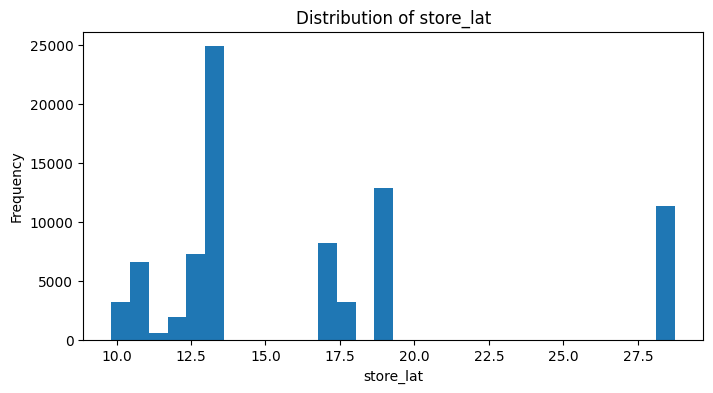

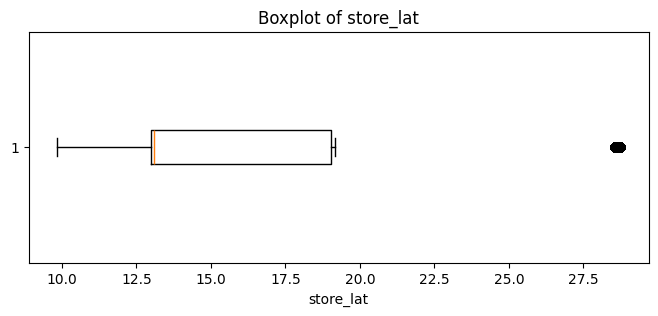


Univariate Analysis: store_lon
count    80000.000000
mean        77.415553
std          2.286182
min         72.774727
25%         77.101690
50%         77.573191
75%         78.544213
max         80.313144
Name: store_lon, dtype: float64


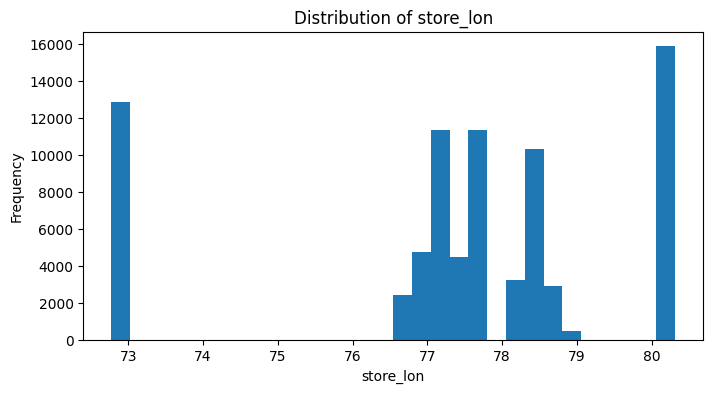

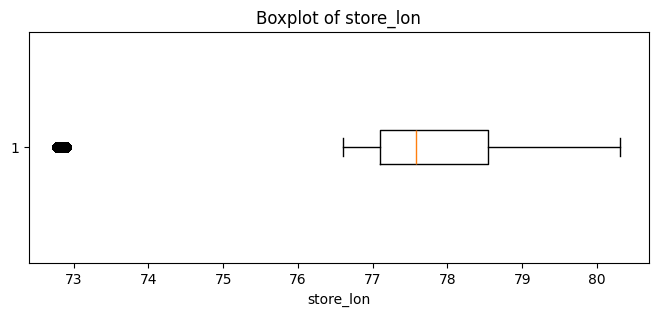


Univariate Analysis: city_tier
count    80000.000000
mean         1.259800
std          0.626785
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          3.000000
Name: city_tier, dtype: float64


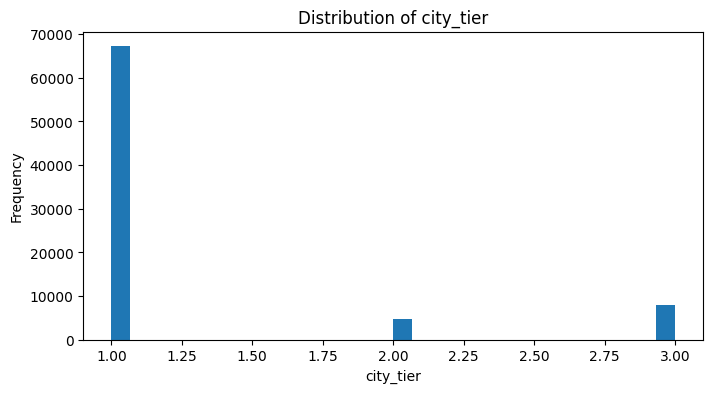

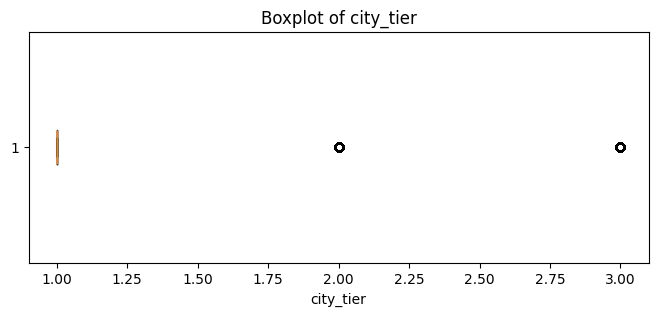


Univariate Analysis: customer_lat
count    80000.000000
mean        16.494096
std          5.644479
min          9.729386
25%         12.980742
50%         13.103252
75%         19.029555
max         28.841977
Name: customer_lat, dtype: float64


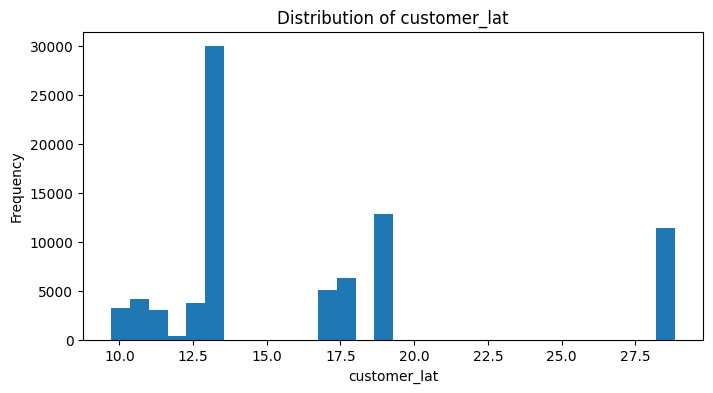

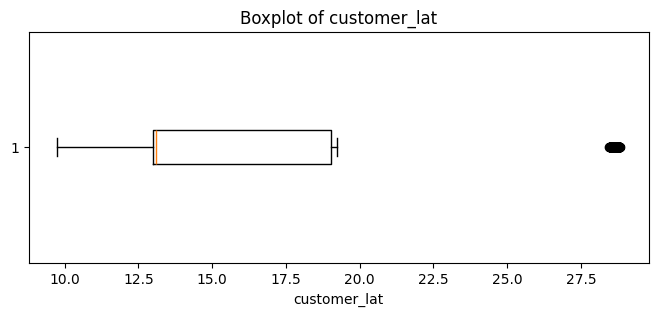


Univariate Analysis: customer_lon
count    80000.000000
mean        77.415568
std          2.286217
min         72.691804
25%         77.057949
50%         77.580531
75%         78.544600
max         80.405665
Name: customer_lon, dtype: float64


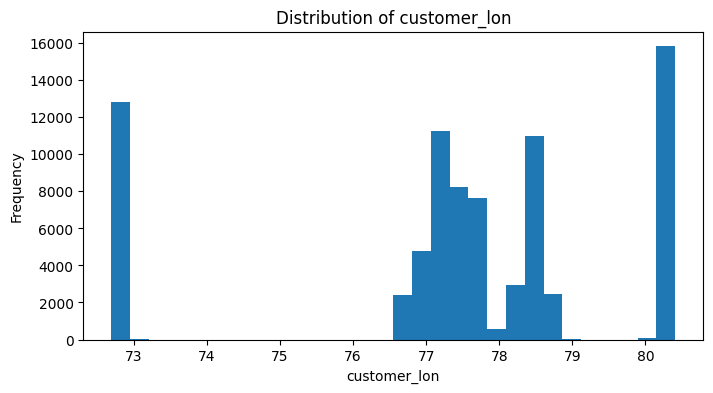

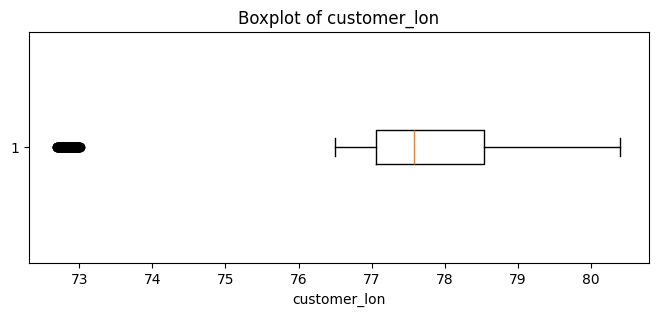


Univariate Analysis: distance_km
count    80000.000000
mean         2.717377
std          1.601438
min          0.300000
25%          1.618000
50%          2.331000
75%          3.391000
max         13.987000
Name: distance_km, dtype: float64


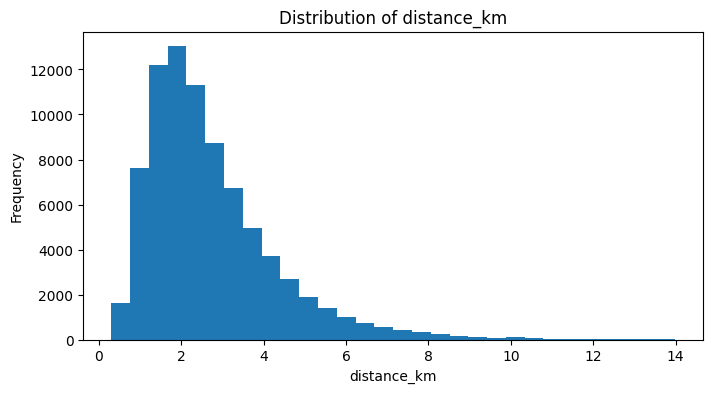

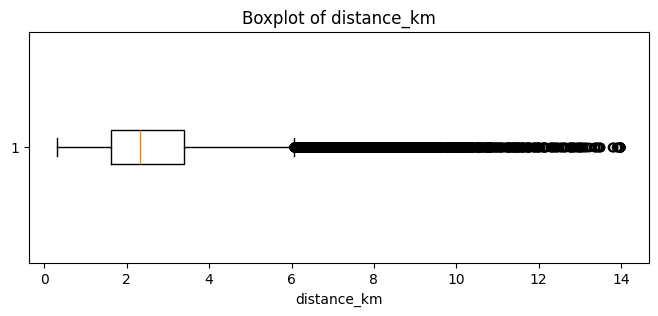


Univariate Analysis: traffic_index
count    80000.000000
mean         0.558618
std          0.175102
min          0.181400
25%          0.402400
50%          0.577700
75%          0.695800
max          0.980000
Name: traffic_index, dtype: float64


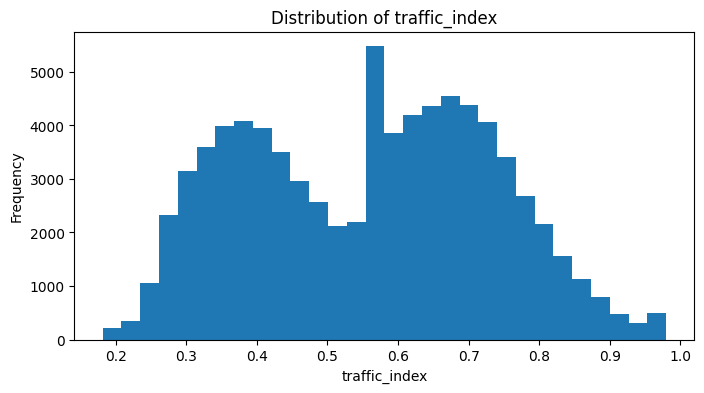

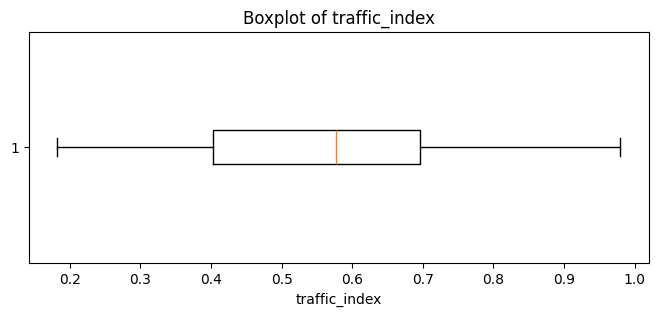


Univariate Analysis: rainfall_mm
count    80000.000000
mean         1.109386
std          3.113874
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         53.740000
Name: rainfall_mm, dtype: float64


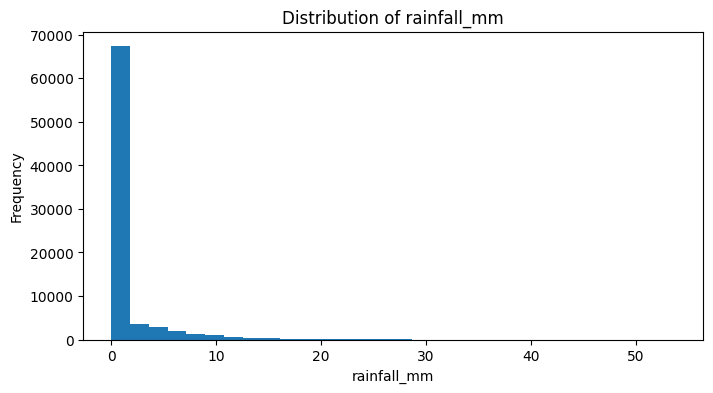

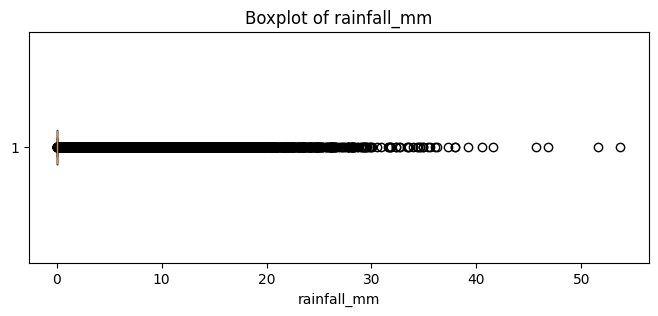


Univariate Analysis: hour
count    80000.000000
mean        15.046938
std          5.038673
min          0.000000
25%         11.000000
50%         16.000000
75%         19.000000
max         23.000000
Name: hour, dtype: float64


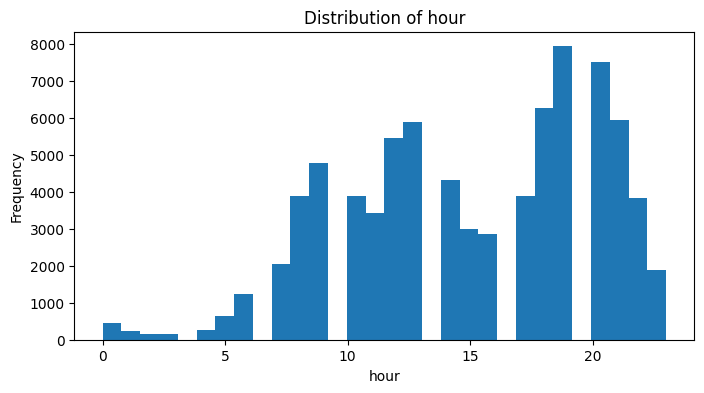

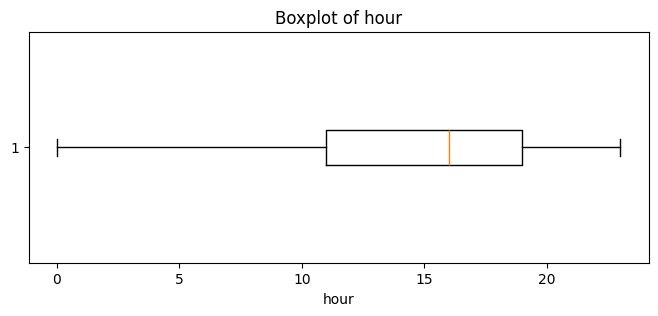


Univariate Analysis: weekday
count    80000.000000
mean         3.026238
std          2.005985
min          0.000000
25%          1.000000
50%          3.000000
75%          5.000000
max          6.000000
Name: weekday, dtype: float64


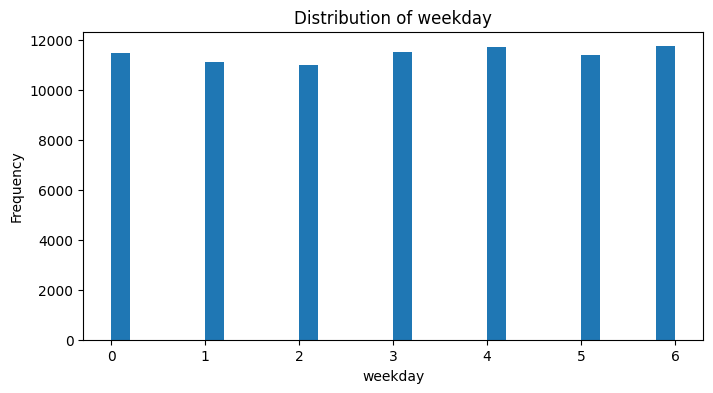

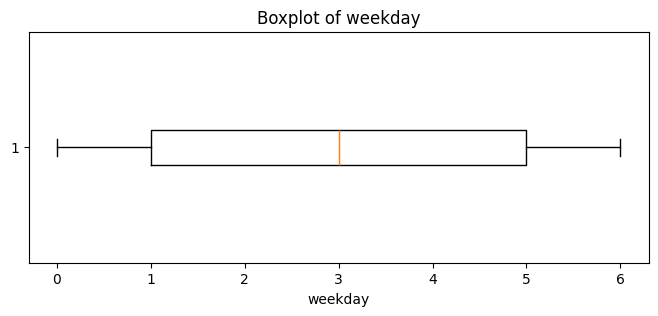


Univariate Analysis: item_count
count    80000.000000
mean         5.144725
std          3.118986
min          1.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         28.000000
Name: item_count, dtype: float64


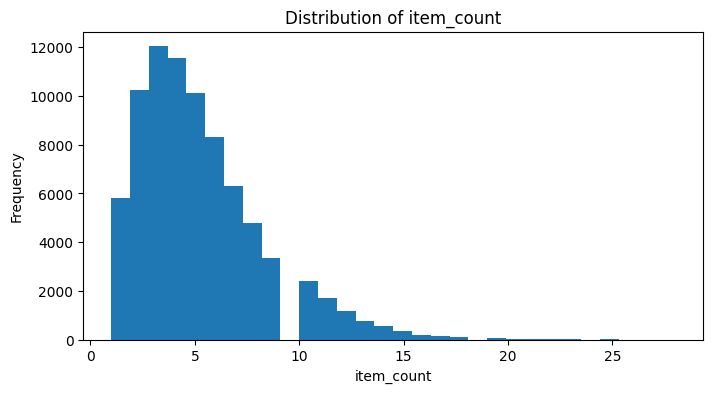

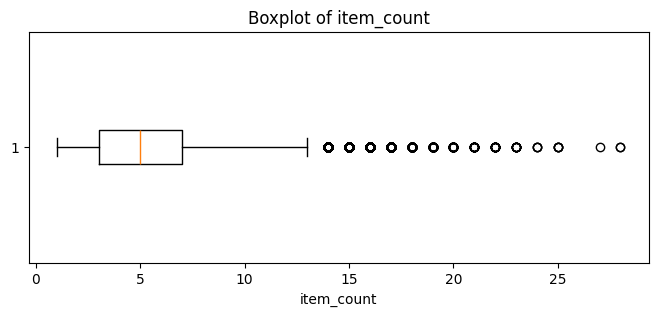


Univariate Analysis: order_amount
count    80000.000000
mean       166.948197
std        148.634186
min         35.000000
25%         64.407500
50%        123.150000
75%        219.530000
max       3019.290000
Name: order_amount, dtype: float64


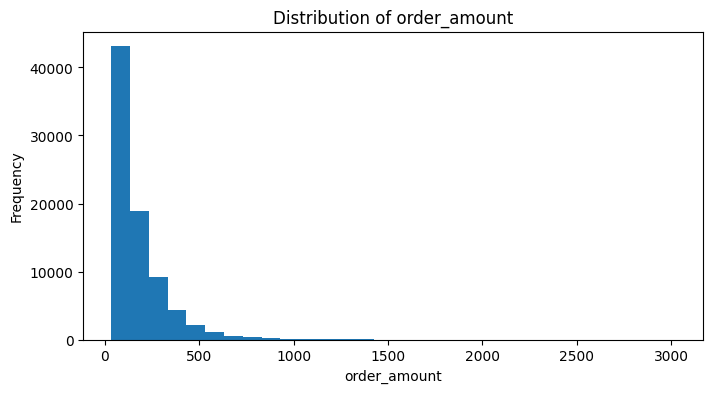

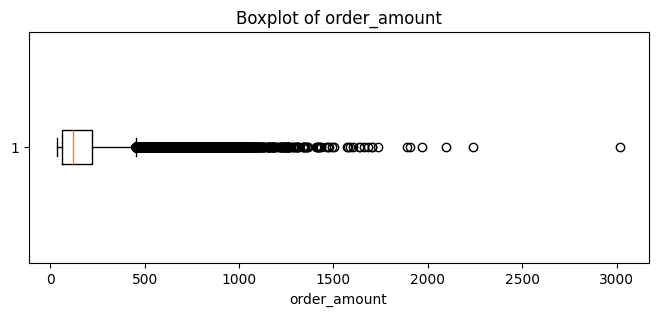


Univariate Analysis: order_weight_kg
count    80000.000000
mean         2.466520
std          2.436517
min          0.150000
25%          0.869000
50%          1.772000
75%          3.208000
max         30.000000
Name: order_weight_kg, dtype: float64


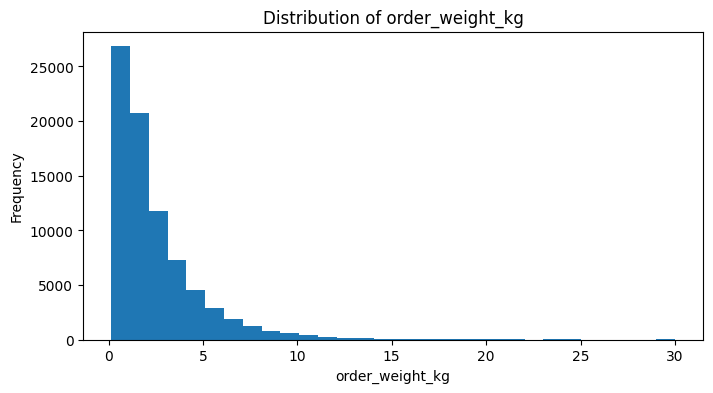

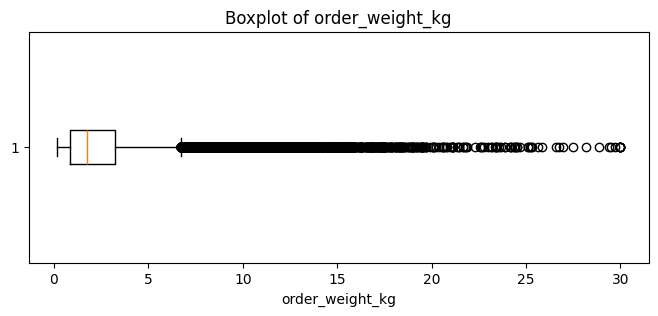


Univariate Analysis: rider_experience_months
count    80000.000000
mean        15.446827
std          9.801261
min          0.500000
25%          8.400000
50%         13.500000
75%         20.200000
max         90.000000
Name: rider_experience_months, dtype: float64


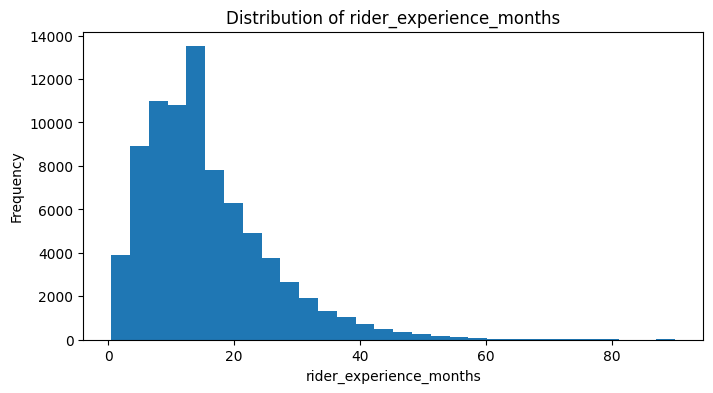

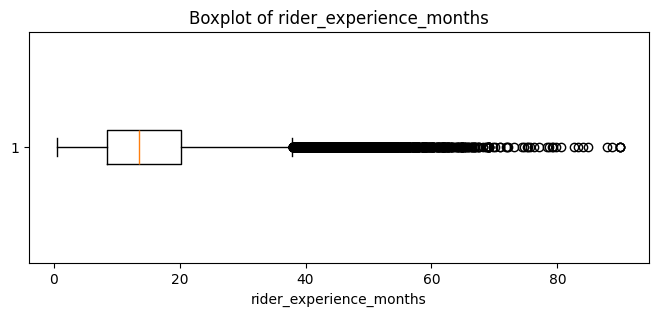


Univariate Analysis: current_rider_load
count    80000.000000
mean         1.504687
std          1.118244
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: current_rider_load, dtype: float64


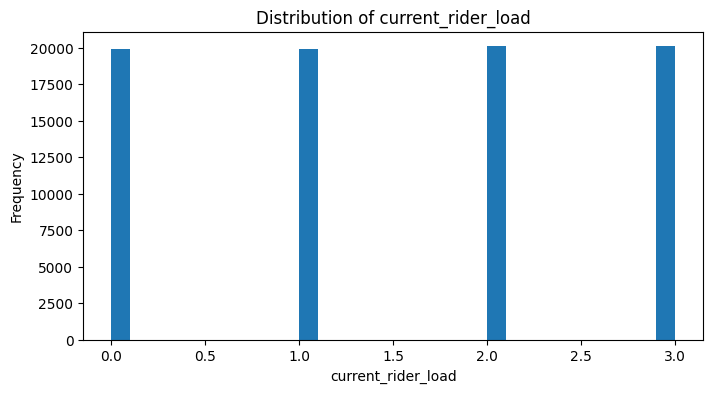

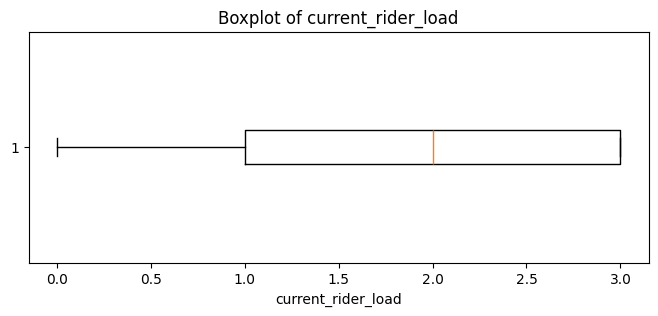


Univariate Analysis: rider_rating
count    80000.000000
mean         4.445021
std          0.300897
min          3.130000
25%          4.250000
50%          4.450000
75%          4.650000
max          5.000000
Name: rider_rating, dtype: float64


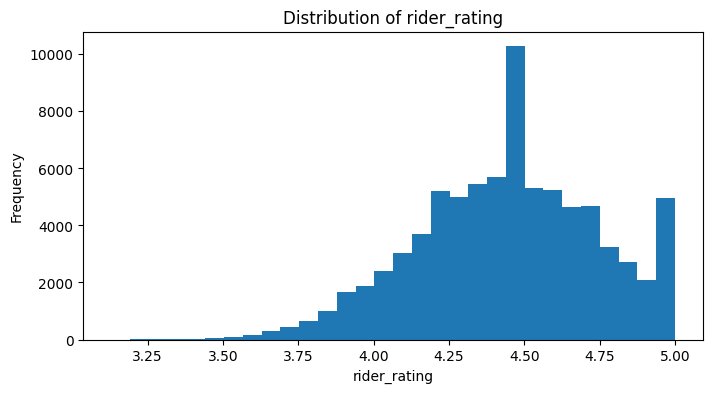

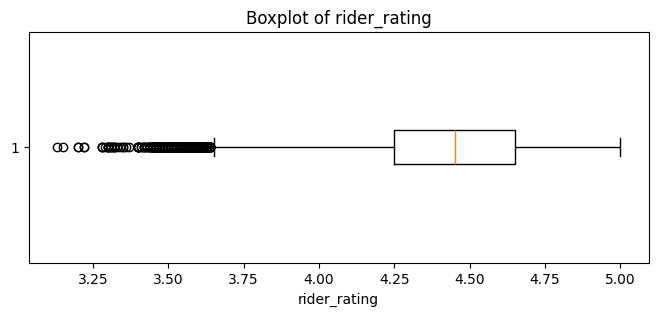


Univariate Analysis: previous_acceptance_rate
count    80000.000000
mean         0.714108
std          0.142113
min          0.146000
25%          0.622000
50%          0.730000
75%          0.823000
max          0.990000
Name: previous_acceptance_rate, dtype: float64


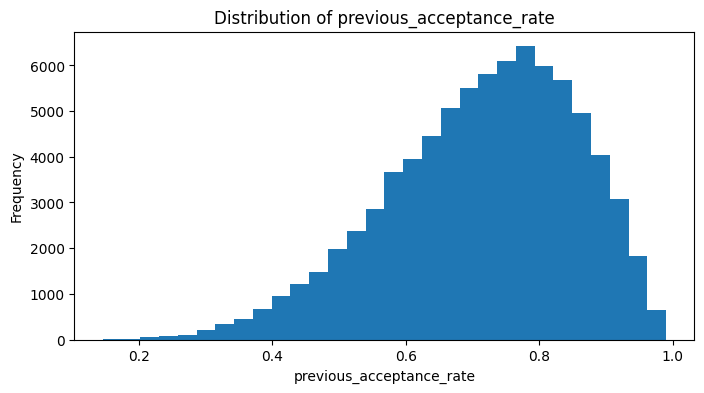

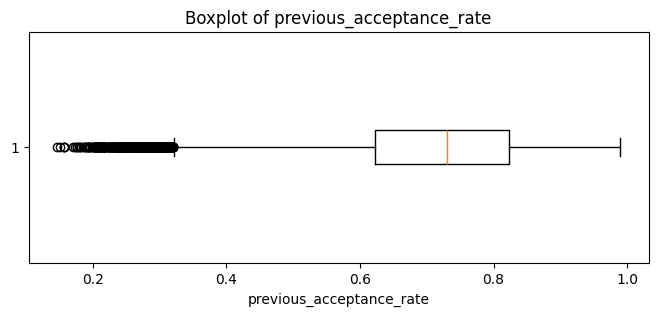


Univariate Analysis: rider_earnings_today
count    80000.000000
mean      1209.229078
std        728.080412
min          7.660000
25%        674.255000
50%       1059.705000
75%       1582.992500
max       4200.000000
Name: rider_earnings_today, dtype: float64


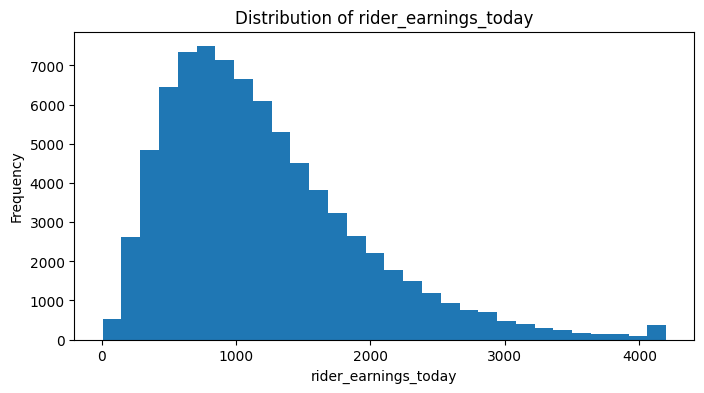

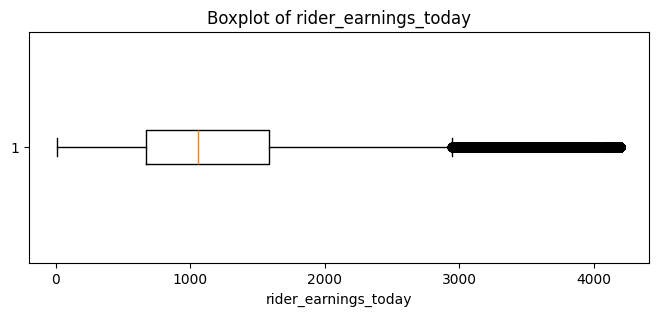


Univariate Analysis: current_incentive
count    80000.000000
mean        49.077209
std         19.707234
min         13.750000
25%         35.840000
50%         46.080000
75%         58.840000
max        217.760000
Name: current_incentive, dtype: float64


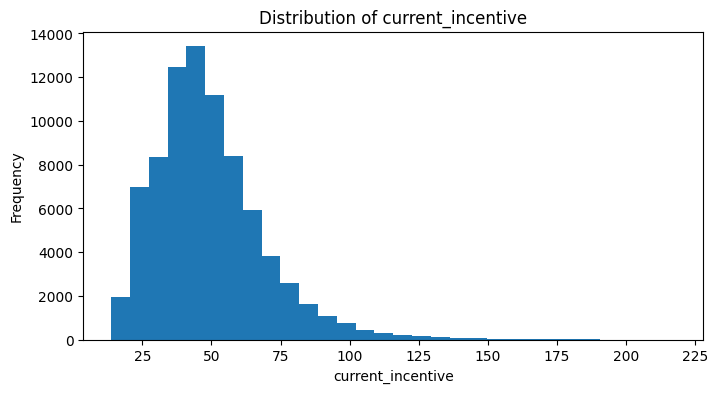

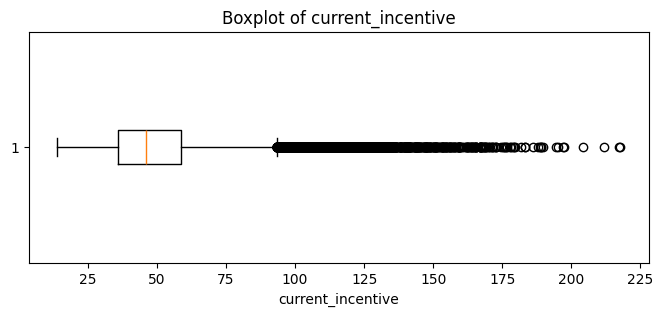


Univariate Analysis: order_year
count    80000.000000
mean      2026.005900
std          0.108468
min       2026.000000
25%       2026.000000
50%       2026.000000
75%       2026.000000
max       2028.000000
Name: order_year, dtype: float64


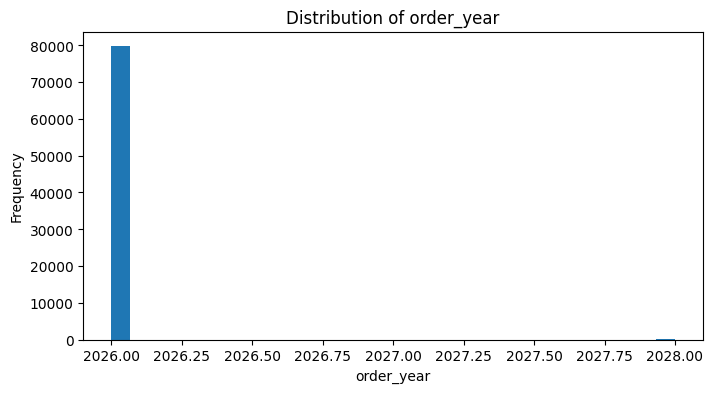

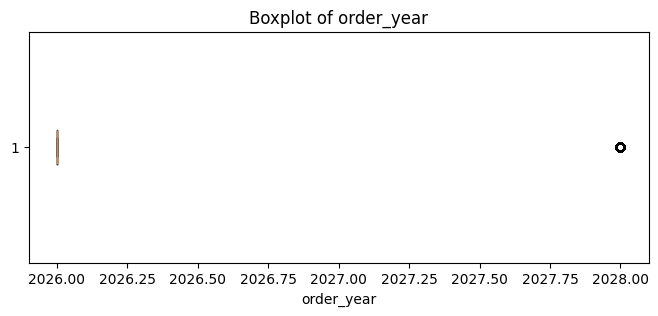

In [ ]:
import matplotlib.pyplot as plt

for col in numerical_cols:
    print(f"\n{'='*50}")
    print(f"Univariate Analysis: {col}")
    print(f"{'='*50}")
    print(df[col].describe())

    plt.figure(figsize=(8, 4))
    plt.hist(df[col].dropna(), bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

    plt.figure(figsize=(8, 3))
    plt.boxplot(df[col].dropna(), vert=False)
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.show()


Univariate Analysis: delivery_zone
delivery_zone
BEN-Z14    1190
CHE-Z08    1188
BEN-Z01    1174
CHE-Z07    1171
CHE-Z11    1167
           ... 
TRI-Z04     477
MYS-Z04     471
TRI-Z05     462
MYS-Z01     452
MYS-Z02     449
Name: count, Length: 87, dtype: int64


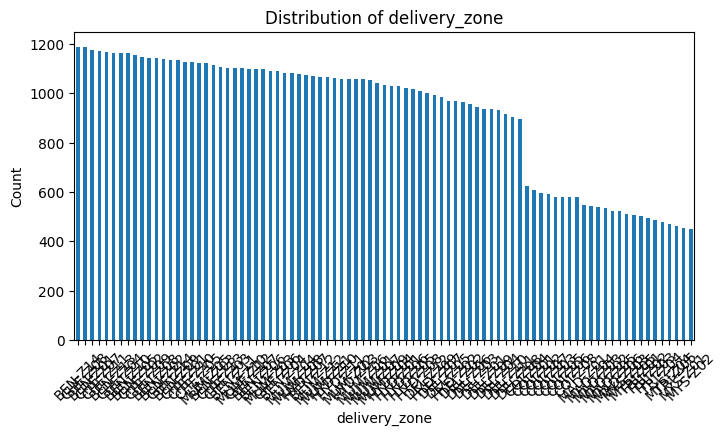


Univariate Analysis: city
city
chennai       15891
bengaluru     15827
mumbai        12854
delhi ncr     11344
hyderabad     11322
coimbatore     4740
madurai        3209
trichy         2423
mysuru         2390
Name: count, dtype: int64


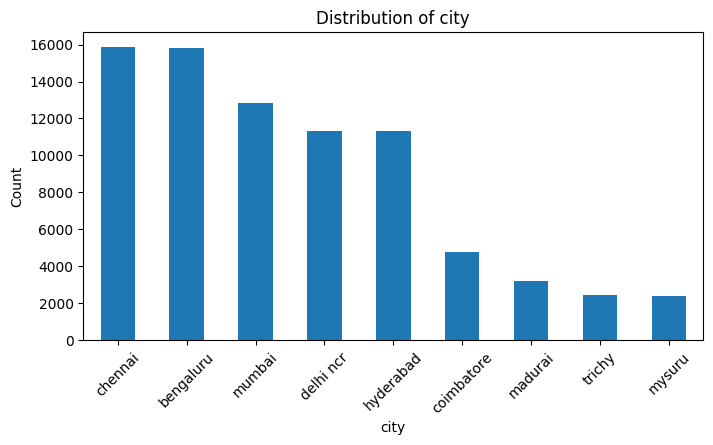


Univariate Analysis: road_type
road_type
arterial       32075
residential    27237
narrow_lane    12692
highway         7996
Name: count, dtype: int64


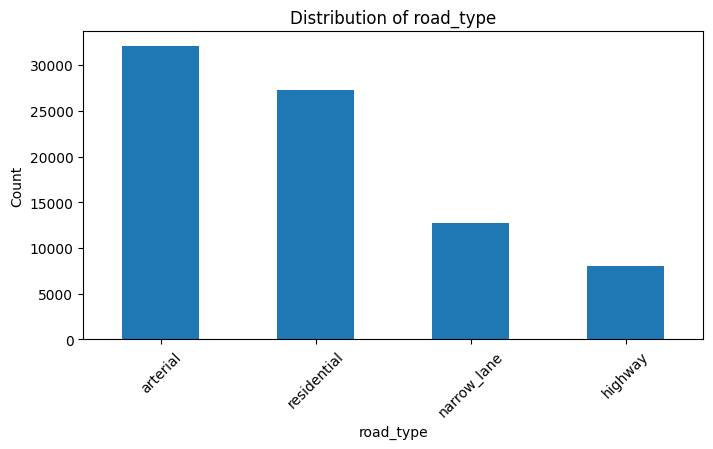


Univariate Analysis: weather_condition
weather_condition
clear            62301
light_rain        9977
moderate_rain     6835
heavy_rain         887
Name: count, dtype: int64


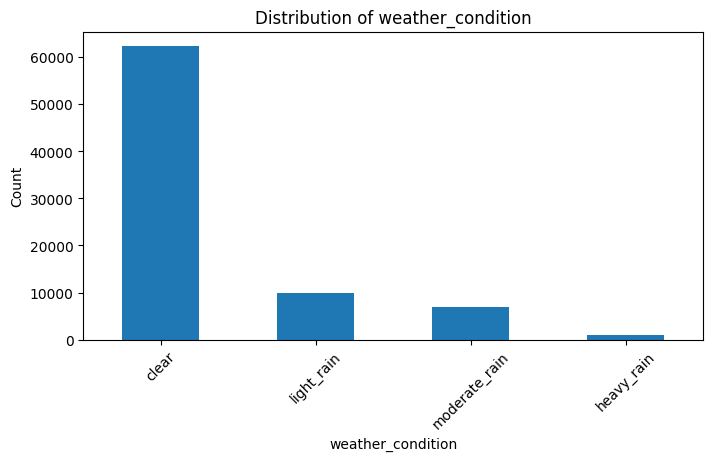


Univariate Analysis: membership_type
membership_type
none         49428
pass         21808
pass_plus     8764
Name: count, dtype: int64


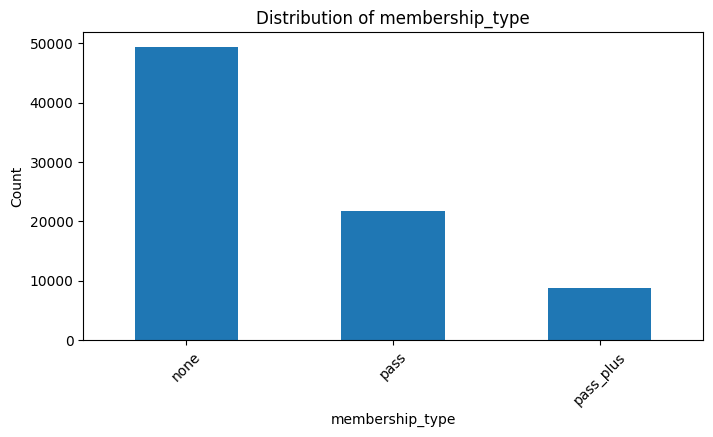


Univariate Analysis: demand_level
demand_level
low       33695
medium    27868
high      18437
Name: count, dtype: int64


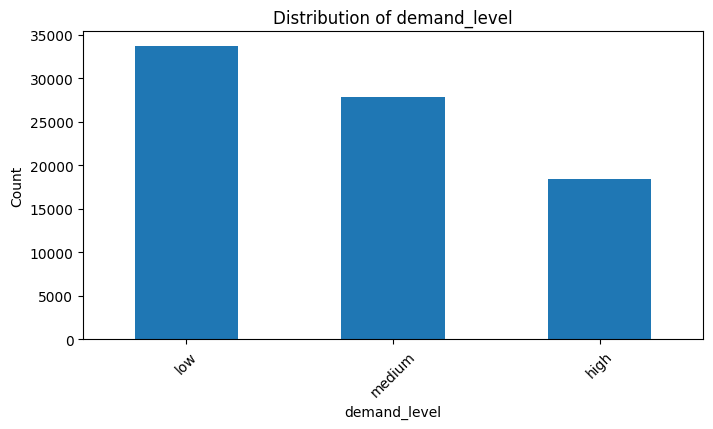


Univariate Analysis: order_month
order_month
April        21276
May          12244
January      12065
March        11958
June         11408
February     10829
November        49
September       44
October         43
August          37
July            31
December        16
Name: count, dtype: int64


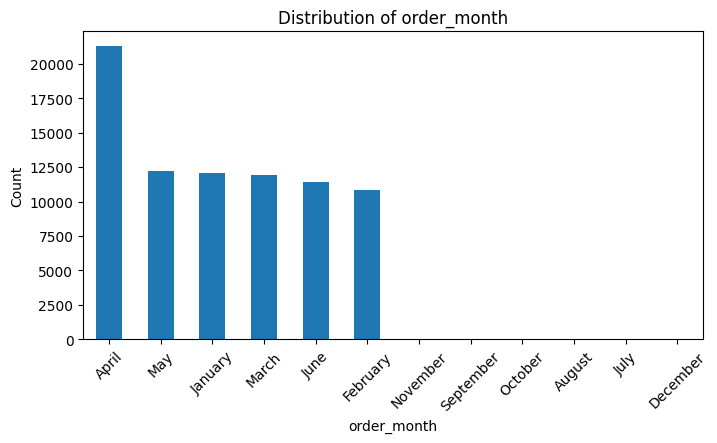


Univariate Analysis: vehicle_type
vehicle_type
bike       41480
scooter    22472
ev_bike    11195
bicycle     4853
Name: count, dtype: int64


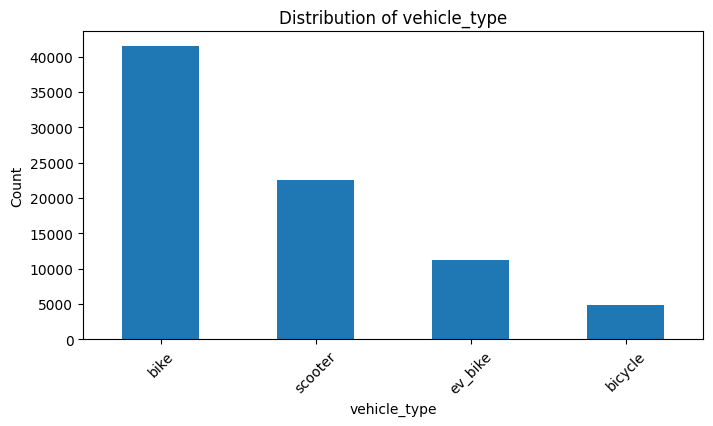


Univariate Analysis: peak_hour_flag
peak_hour_flag
1    41436
0    38564
Name: count, dtype: int64


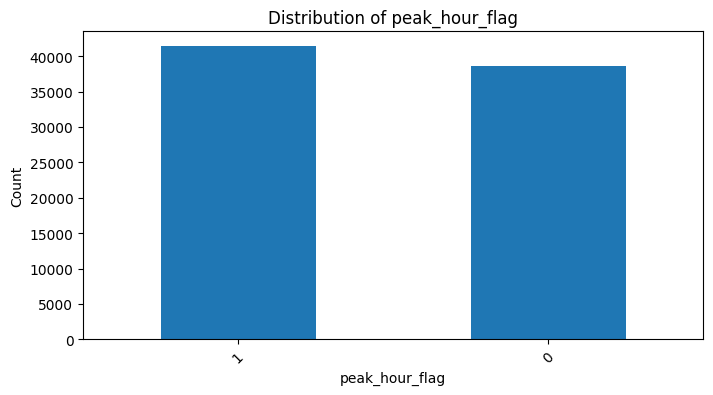


Univariate Analysis: weekend_flag
weekend_flag
0    56840
1    23160
Name: count, dtype: int64


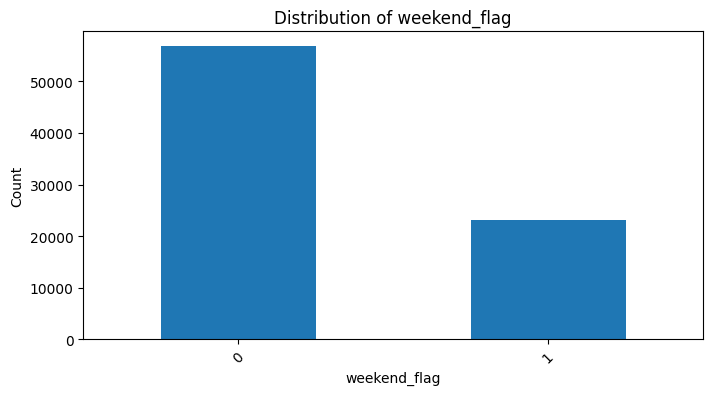


Univariate Analysis: festival_day_flag
festival_day_flag
0    76897
1     3103
Name: count, dtype: int64


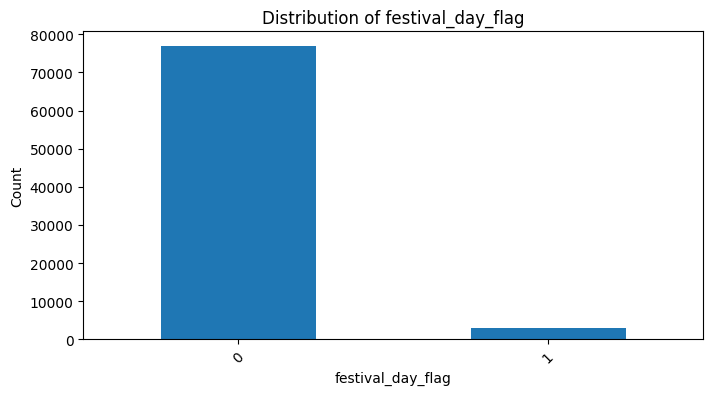

In [ ]:
for col in categorical_cols:
    print(f"\n{'='*50}")
    print(f"Univariate Analysis: {col}")
    print(f"{'='*50}")
    print(df[col].value_counts(dropna=False))

    plt.figure(figsize=(8, 4))
    df[col].value_counts(dropna=False).plot(kind="bar")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

###Bivariant Analysis

In [6]:
num_cont_cols= ["store_lat", "store_lon", "customer_lat", "customer_lon", "distance_km", "traffic_index", "rainfall_mm", "order_amount", "order_weight_kg", "rider_experience_months",
                "rider_rating","previous_acceptance_rate","rider_earnings_today","current_incentive"]


len(num_cont_cols)


14

In [7]:
num_disc_cols= ["city_tier","hour","weekday","item_count","current_rider_load","order_year"]
len(num_disc_cols)

6

In [8]:
cat_cols=[ "delivery_zone", "city", "road_type", "weather_condition", "membership_type", "demand_level","order_month", "vehicle_type", "peak_hour_flag", "weekend_flag", "festival_day_flag"]
len(cat_cols)


11

In [9]:
# Targets To Be Predicted
Delivery_Charge=df['delivery_charge']
DTA= df['delivery_time_minutes']
Acceptance=df['rider_accepted']

#Bivariant Analysis

1. Num Cont Vs deliverycharge

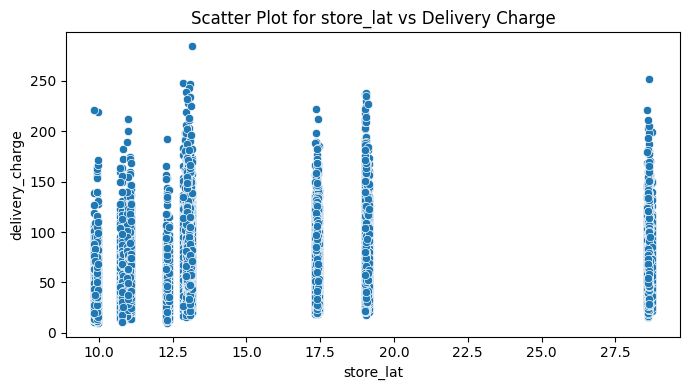

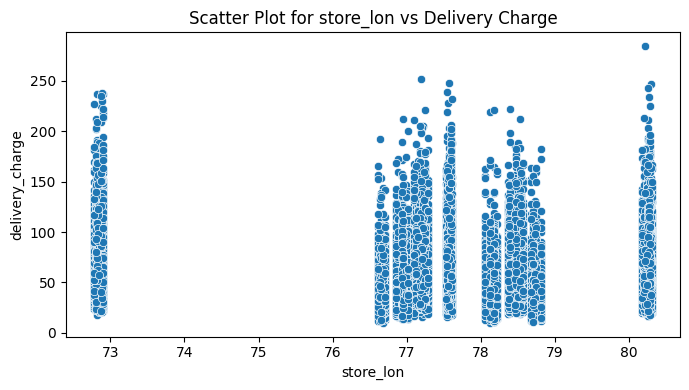

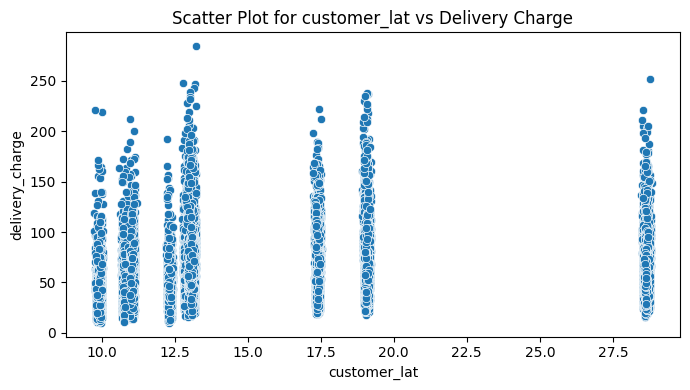

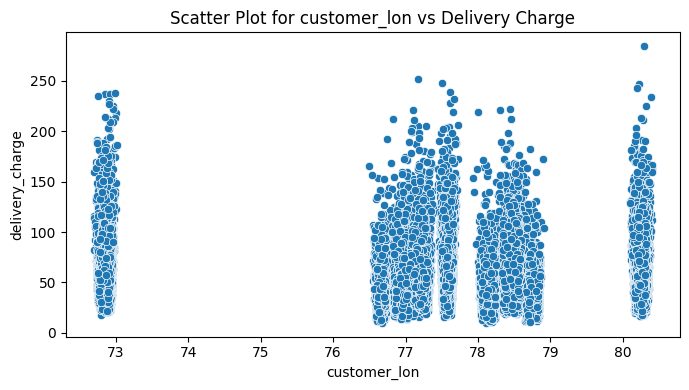

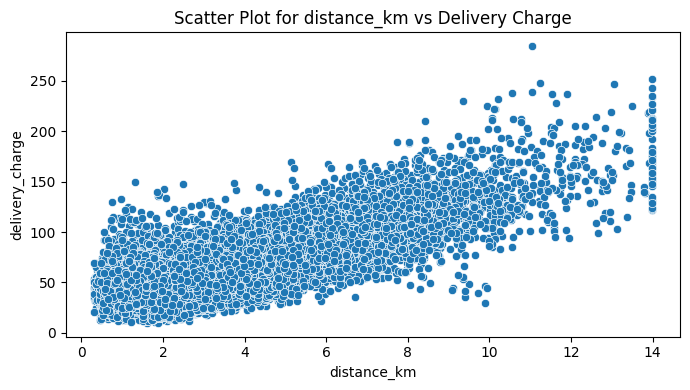

...

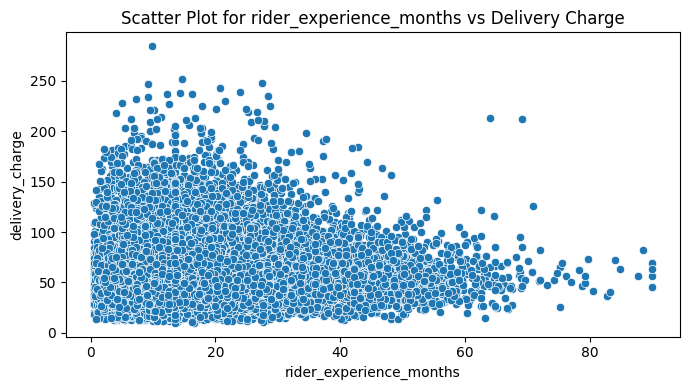

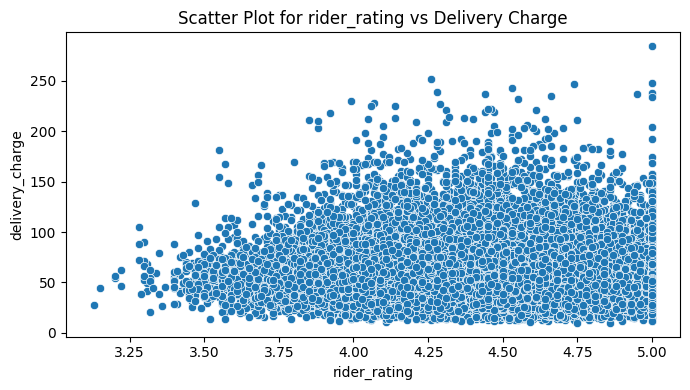

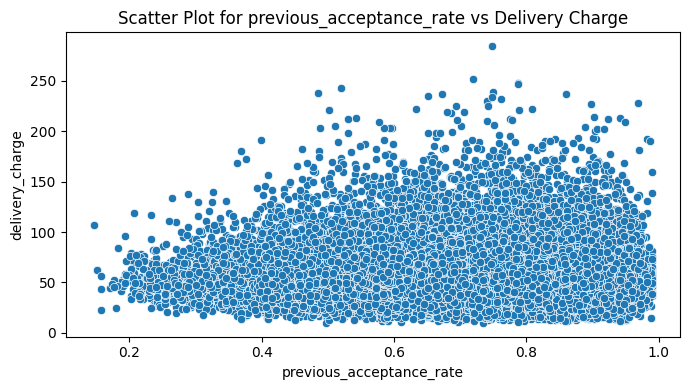

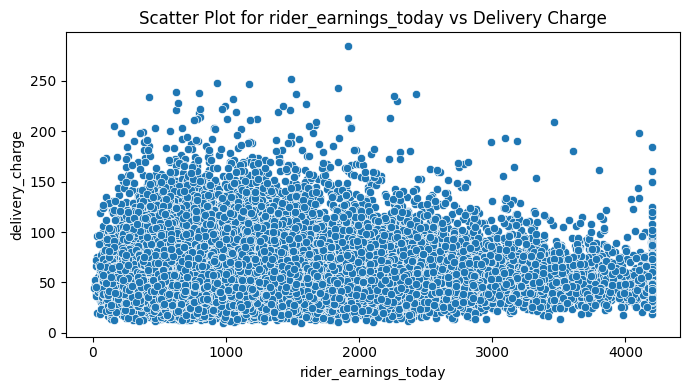

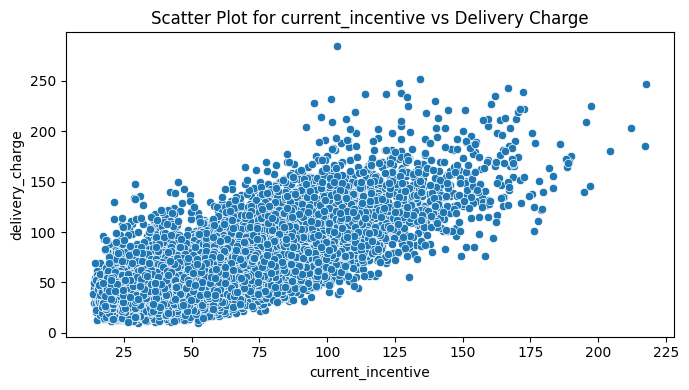

selected_Num_Cont_df:                       Column           Target  Correlation   p_value  alpha  \
0                  store_lat  delivery_charge       0.1119  0.000000   0.05   
1                  store_lon  delivery_charge      -0.0853  0.000000   0.05   
2               customer_lat  delivery_charge       0.1119  0.000000   0.05   
3               customer_lon  delivery_charge      -0.0854  0.000000   0.05   
4                distance_km  delivery_charge       0.6971  0.000000   0.05   
5              traffic_index  delivery_charge       0.2657  0.000000   0.05   
6                rainfall_mm  delivery_charge       0.1326  0.000000   0.05   
7               order_amount  delivery_charge      -0.2357  0.000000   0.05   
8            order_weight_kg  delivery_charge       0.0879  0.000000   0.05   
9    rider_experience_months  delivery_charge      -0.0013  0.715832   0.05   
10              rider_rating  delivery_charge       0.0021  0.548565   0.05   
11  previous_acceptance_rate  

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Numerical Continuous vs Delivery Charge

for clm in num_cont_cols:
    plt.figure(figsize=(7, 4))
    sns.scatterplot(data=df, x=clm, y='delivery_charge')
    plt.title(f'Scatter Plot for {clm} vs Delivery Charge')
    plt.tight_layout()
    plt.show()


# correlation test for continuous variables

def correlation_test(df, col, Target='delivery_charge', alpha=0.05):

    temp = df[[col, Target]].dropna()

    r, p = pearsonr(temp[col], temp[Target])

    if p < alpha:
        return {
            'Column': col,
            'Target': Target,
            'Correlation': round(r, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'Yes',
            'Decision': 'Reject H0'
        }
    else:
        return {
            'Column': col,
            'Target': Target,
            'Correlation': round(r, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Fail to Reject H0'
        }


selected_Num_Cont_Col = []

for col in num_cont_cols:
    selected_Num_Cont_Col.append(
        correlation_test(df, col, 'delivery_charge')
    )

selected_Num_Cont_df = pd.DataFrame(selected_Num_Cont_Col)

Num_Cont_Selected_columns_delivery_charge = (
    selected_Num_Cont_df[
        selected_Num_Cont_df['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)

print("selected_Num_Cont_df:", selected_Num_Cont_df)
print("Num_Cont_Selected_columns_delivery_charge:", Num_Cont_Selected_columns_delivery_charge)

2. Numerical Discrete vs delivery_charge

In [ ]:
from scipy.stats import spearmanr

# Numerical Discrete vs Delivery Charge

for clm in num_disc_cols:
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df, x=clm, y='delivery_charge')
    plt.title(f'Box Plot for {clm} vs Delivery Charge')
    plt.tight_layout()
    plt.savefig(f'boxplot_{clm}_vs_delivery_charge.png')
    plt.close()


# Spearman test for discrete numerical variables

def spearman_test(df, col, Target='delivery_charge', alpha=0.05):

    temp = df[[col, Target]].dropna()

    r, p = spearmanr(temp[col], temp[Target])

    if p < alpha:
        return {
            'Column': col,
            'Target': Target,
            'Spearman_Correlation': round(r, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'Yes',
            'Decision': 'Reject H0'
        }
    else:
        return {
            'Column': col,
            'Target': Target,
            'Spearman_Correlation': round(r, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Fail to Reject H0'
        }


selected_Num_dis_Col = []

for col in num_disc_cols:
    selected_Num_dis_Col.append(
        spearman_test(df, col, 'delivery_charge')
    )

selected_Num_dis_df = pd.DataFrame(selected_Num_dis_Col)

Num_disc_Selected_columns_delivery_charge = (
    selected_Num_dis_df[
        selected_Num_dis_df['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)
print("selected_Num_dis_df:", selected_Num_dis_df)
print("Num_disc_Selected_columns_delivery_charge:", Num_disc_Selected_columns_delivery_charge)


selected_Num_dis_df:                Column           Target  Spearman_Correlation   p_value  alpha  \
0           city_tier  delivery_charge               -0.2736  0.000000   0.05   
1                hour  delivery_charge                0.0268  0.000000   0.05   
2             weekday  delivery_charge                0.0219  0.000000   0.05   
3          item_count  delivery_charge               -0.1799  0.000000   0.05   
4  current_rider_load  delivery_charge               -0.0047  0.180475   0.05   
5          order_year  delivery_charge               -0.0041  0.246205   0.05   

  Select_Status           Decision  
0           Yes          Reject H0  
1           Yes          Reject H0  
2           Yes          Reject H0  
3           Yes          Reject H0  
4            No  Fail to Reject H0  
5            No  Fail to Reject H0  
Num_disc_Selected_columns_delivery_charge: ['city_tier', 'hour', 'weekday', 'item_count']


3.Categorical vs delivery_charge

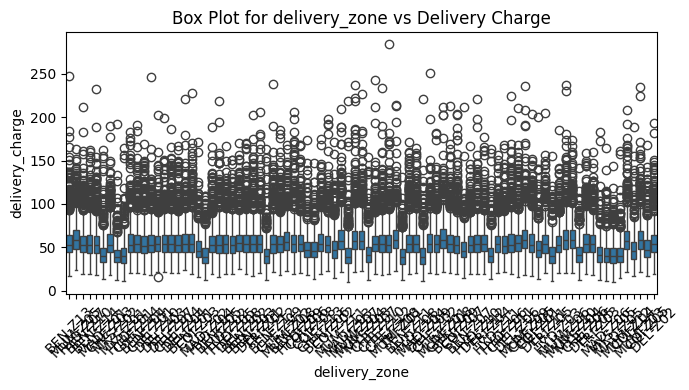

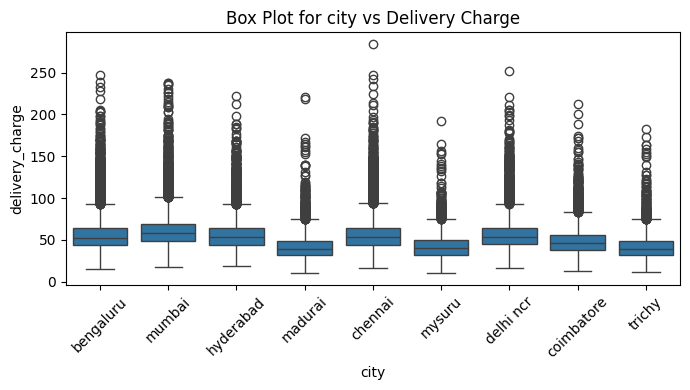

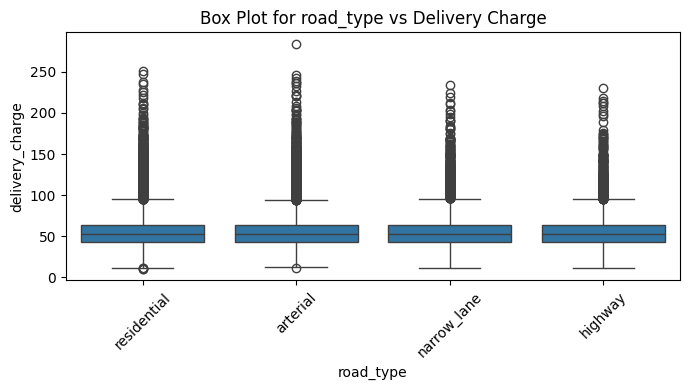

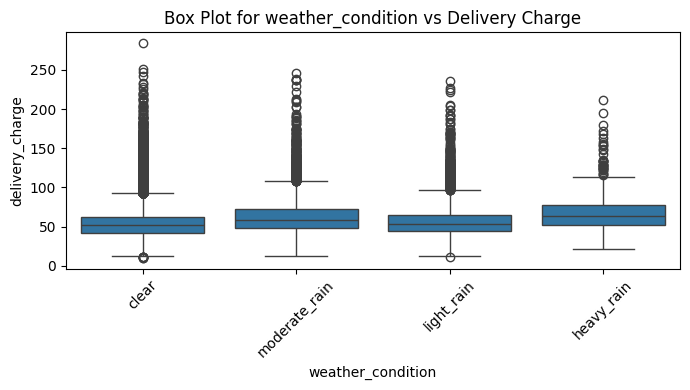

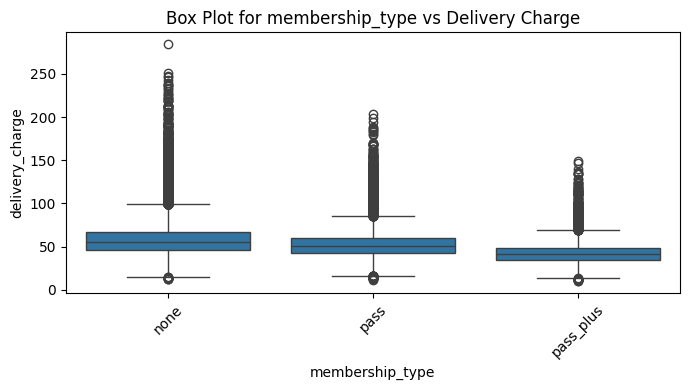

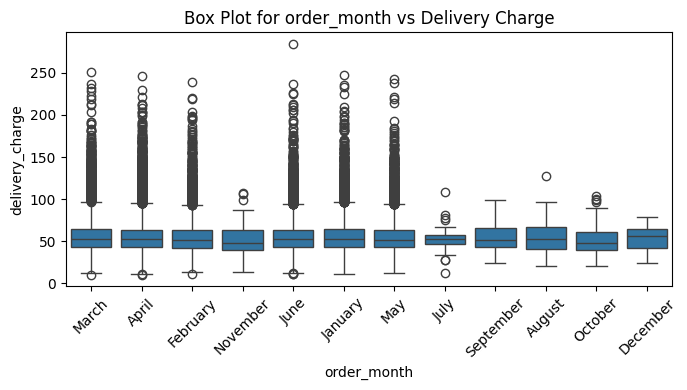

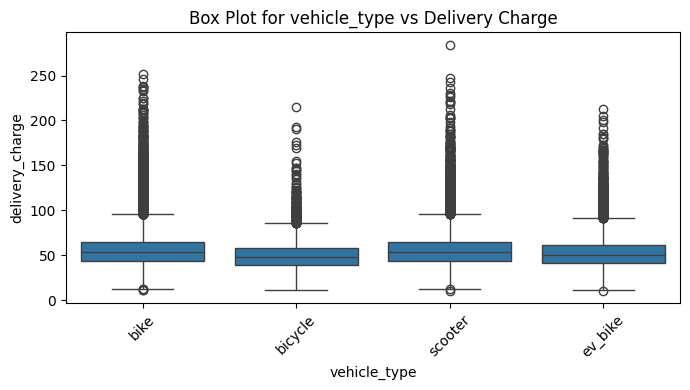

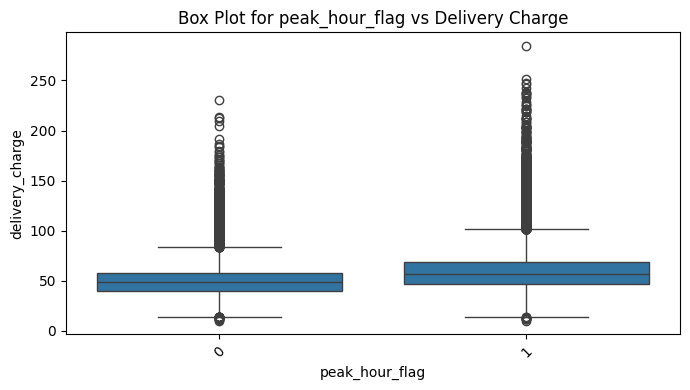

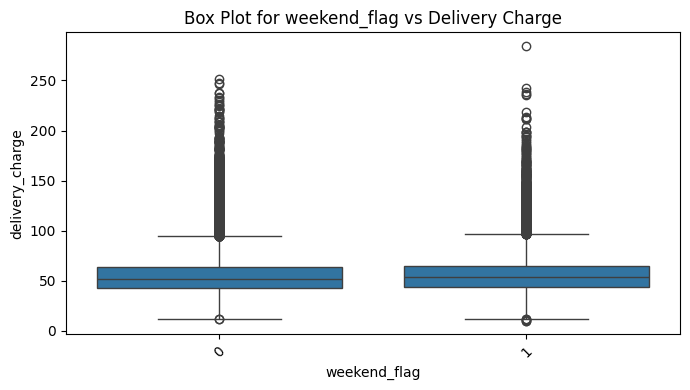

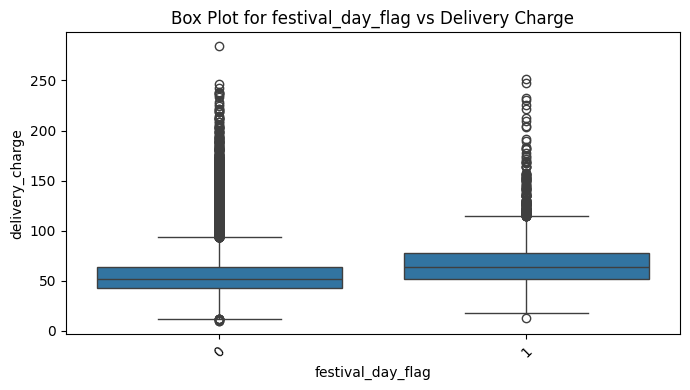

Selected_Catt_df_delivery_charge:               Column           Target    F_value   p_value  alpha  \
0      delivery_zone  delivery_charge    60.0194  0.000000   0.05   
1               city  delivery_charge   637.4374  0.000000   0.05   
2          road_type  delivery_charge     1.6914  0.166461   0.05   
3  weather_condition  delivery_charge   532.7920  0.000000   0.05   
4    membership_type  delivery_charge  3007.6973  0.000000   0.05   
5        order_month  delivery_charge     7.6597  0.000000   0.05   
6       vehicle_type  delivery_charge   205.5747  0.000000   0.05   
7     peak_hour_flag  delivery_charge  4572.9037  0.000000   0.05   
8       weekend_flag  delivery_charge    65.2001  0.000000   0.05   
9  festival_day_flag  delivery_charge  1217.5740  0.000000   0.05   

  Select_Status           Decision  
0           Yes          Reject H0  
1           Yes          Reject H0  
2            No  Fail to Reject H0  
3           Yes          Reject H0  
4           Yes      

In [ ]:
from scipy.stats import f_oneway

# Categorical vs Delivery Charge

cat_cols_charge = [
    "delivery_zone",
    "city",
    "road_type",
    "weather_condition",
    "membership_type",
    "order_month",
    "vehicle_type",
    "peak_hour_flag",
    "weekend_flag",
    "festival_day_flag"
]

for clm in cat_cols_charge:
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df, x=clm, y='delivery_charge')
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {clm} vs Delivery Charge')
    plt.tight_layout()
    plt.show()


# ANOVA test

def anova_test(df, col, Target='delivery_charge', alpha=0.05):

    temp = df[[col, Target]].dropna()

    groups = [
        group[Target].values
        for _, group in temp.groupby(col)
    ]

    if len(groups) < 2:
        return {
            'Column': col,
            'Target': Target,
            'F_value': None,
            'p_value': None,
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Insufficient Groups'
        }

    f_value, p = f_oneway(*groups)

    if p < alpha:
        return {
            'Column': col,
            'Target': Target,
            'F_value': round(f_value, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'Yes',
            'Decision': 'Reject H0'
        }
    else:
        return {
            'Column': col,
            'Target': Target,
            'F_value': round(f_value, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Fail to Reject H0'
        }


Selected_Catt_clm_delivery_charge = []

for col in cat_cols_charge:
    Selected_Catt_clm_delivery_charge.append(
        anova_test(df, col, 'delivery_charge')
    )

Selected_Catt_df_delivery_charge = pd.DataFrame(
    Selected_Catt_clm_delivery_charge
)

Category_Selected_columns_delivery_charge = (
    Selected_Catt_df_delivery_charge[
        Selected_Catt_df_delivery_charge['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)

Selected_Catt_df_delivery_charge
print("Selected_Catt_df_delivery_charge:", Selected_Catt_df_delivery_charge)
print("Category_Selected_columns_delivery_charge:", Category_Selected_columns_delivery_charge)

4. Numerical Continuous vs delivery_time_minutes

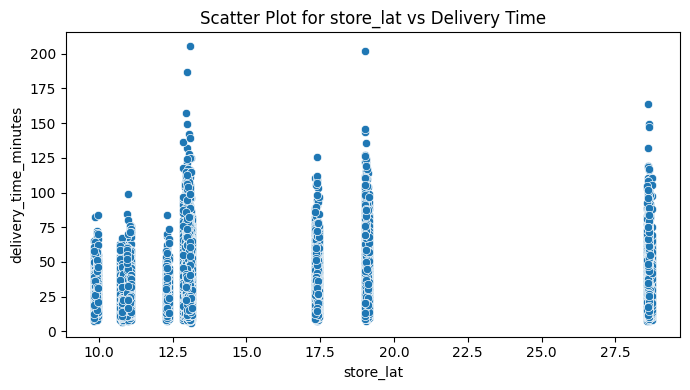

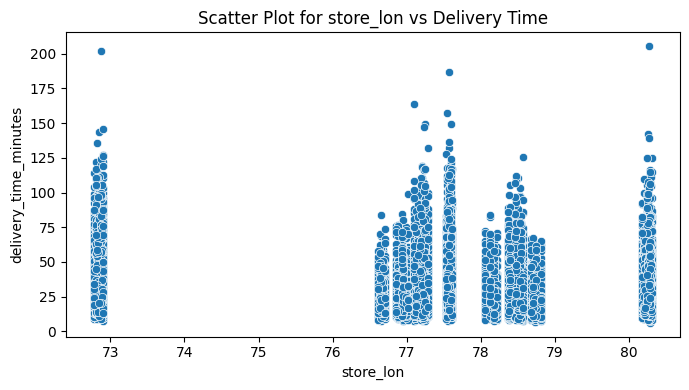

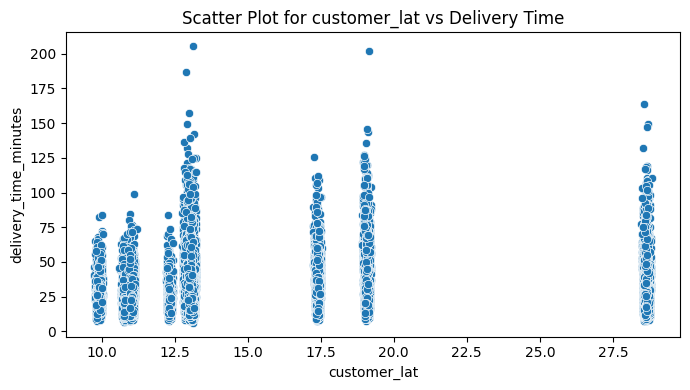

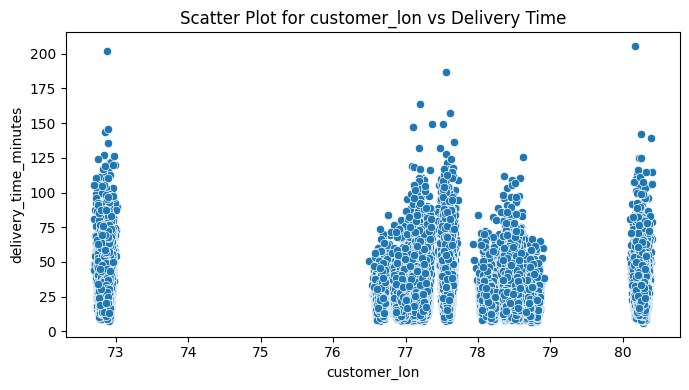

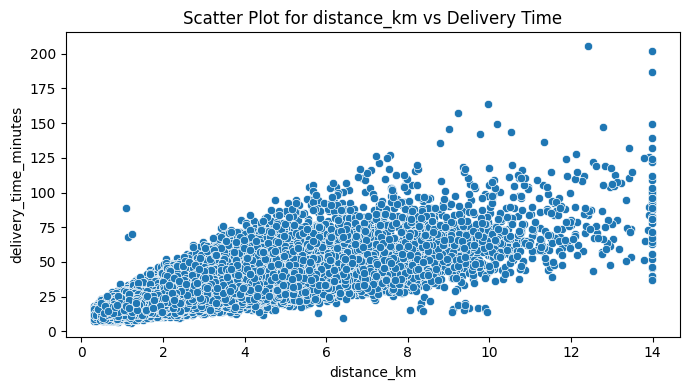

...

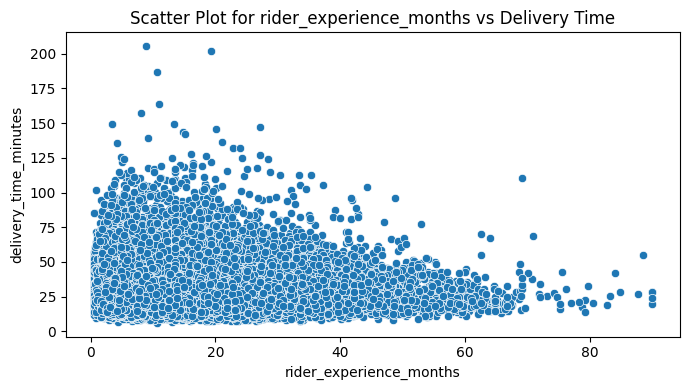

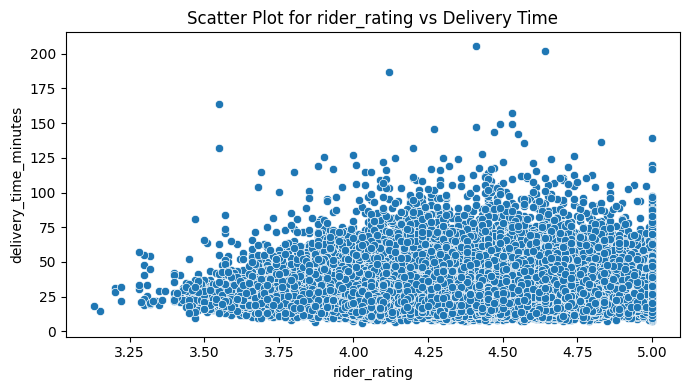

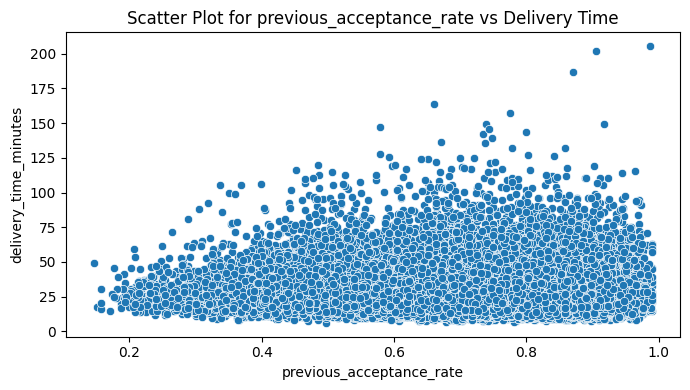

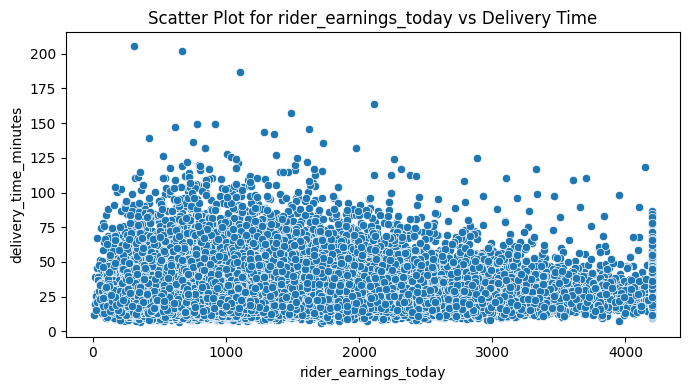

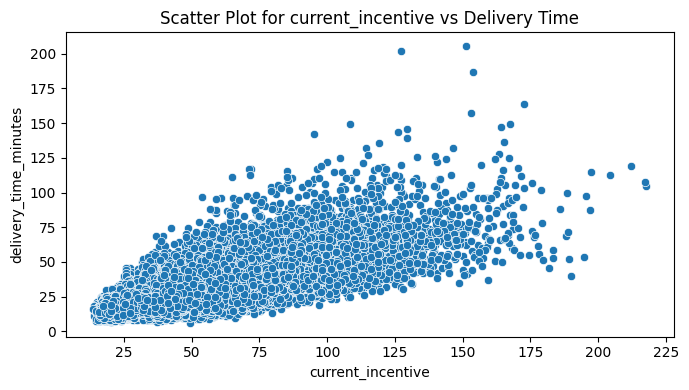

selected_Num_Cont_df_delivery_time:                       Column                 Target  Correlation   p_value  \
0                  store_lat  delivery_time_minutes       0.0785  0.000000   
1                  store_lon  delivery_time_minutes      -0.1115  0.000000   
2               customer_lat  delivery_time_minutes       0.0785  0.000000   
3               customer_lon  delivery_time_minutes      -0.1115  0.000000   
4                distance_km  delivery_time_minutes       0.7769  0.000000   
5              traffic_index  delivery_time_minutes       0.2530  0.000000   
6                rainfall_mm  delivery_time_minutes       0.1293  0.000000   
7               order_amount  delivery_time_minutes       0.0681  0.000000   
8            order_weight_kg  delivery_time_minutes       0.0686  0.000000   
9    rider_experience_months  delivery_time_minutes      -0.0397  0.000000   
10              rider_rating  delivery_time_minutes      -0.0029  0.412362   
11  previous_acceptance_rate

In [ ]:
# Numerical Continuous vs Delivery Time

for clm in num_cont_cols:
    plt.figure(figsize=(7, 4))
    sns.scatterplot(data=df, x=clm, y='delivery_time_minutes')
    plt.title(f'Scatter Plot for {clm} vs Delivery Time')
    plt.tight_layout()
    plt.show()


selected_Num_Cont_Col_delivery_time = []

for col in num_cont_cols:
    selected_Num_Cont_Col_delivery_time.append(
        correlation_test(df, col, 'delivery_time_minutes')
    )

selected_Num_Cont_df_delivery_time = pd.DataFrame(
    selected_Num_Cont_Col_delivery_time
)

Num_Cont_Selected_columns_delivery_time = (
    selected_Num_Cont_df_delivery_time[
        selected_Num_Cont_df_delivery_time['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)

selected_Num_Cont_df_delivery_time

print("selected_Num_Cont_df_delivery_time:", selected_Num_Cont_df_delivery_time)
print("Num_Cont_Selected_columns_delivery_time:", Num_Cont_Selected_columns_delivery_time)

5. Numerical Discrete vs delivery_time_minutes

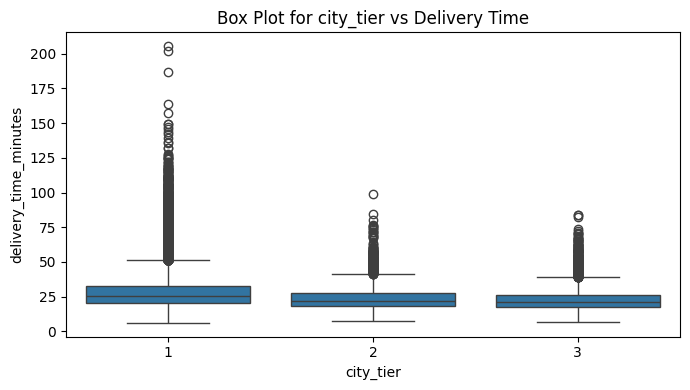

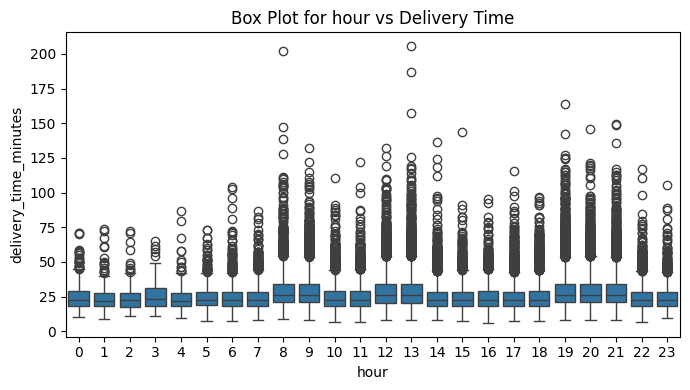

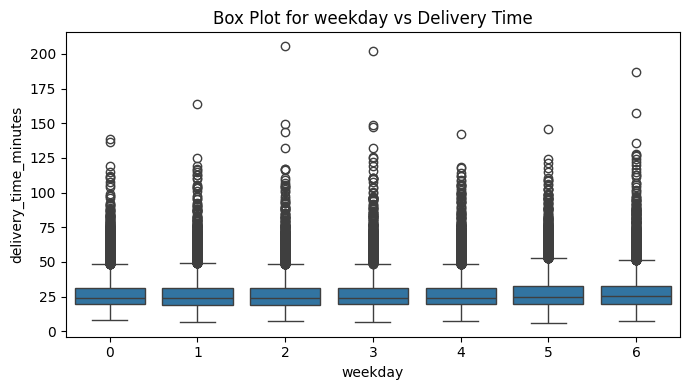

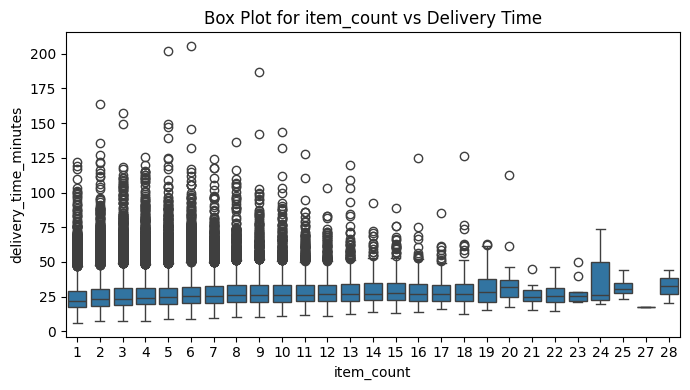

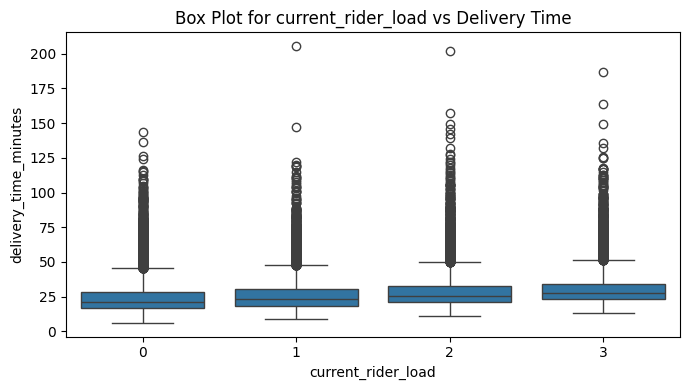

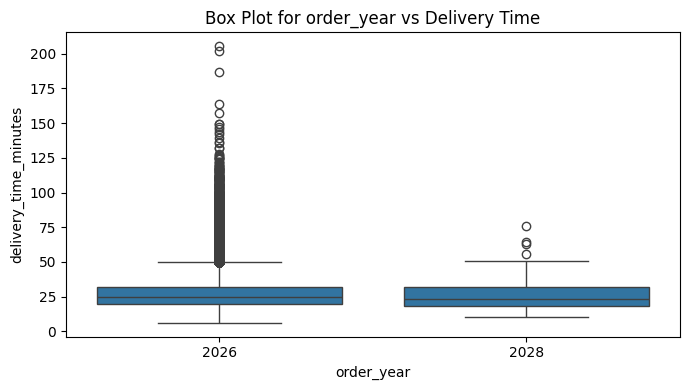

selected_Num_dis_df_delivery_time:                Column                 Target  Spearman_Correlation   p_value  \
0           city_tier  delivery_time_minutes               -0.1781  0.000000   
1                hour  delivery_time_minutes                0.0225  0.000000   
2             weekday  delivery_time_minutes                0.0398  0.000000   
3          item_count  delivery_time_minutes                0.1414  0.000000   
4  current_rider_load  delivery_time_minutes                0.2837  0.000000   
5          order_year  delivery_time_minutes               -0.0060  0.088865   

   alpha Select_Status           Decision  
0   0.05           Yes          Reject H0  
1   0.05           Yes          Reject H0  
2   0.05           Yes          Reject H0  
3   0.05           Yes          Reject H0  
4   0.05           Yes          Reject H0  
5   0.05            No  Fail to Reject H0  
Num_disc_Selected_columns_delivery_time: ['city_tier', 'hour', 'weekday', 'item_count', 'current

In [ ]:
# Numerical Discrete vs Delivery Time

for clm in num_disc_cols:
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df, x=clm, y='delivery_time_minutes')
    plt.title(f'Box Plot for {clm} vs Delivery Time')
    plt.tight_layout()
    plt.show()


selected_Num_dis_Col_delivery_time = []

for col in num_disc_cols:
    selected_Num_dis_Col_delivery_time.append(
        spearman_test(df, col, 'delivery_time_minutes')
    )

selected_Num_dis_df_delivery_time = pd.DataFrame(
    selected_Num_dis_Col_delivery_time
)

Num_disc_Selected_columns_delivery_time = (
    selected_Num_dis_df_delivery_time[
        selected_Num_dis_df_delivery_time['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)

selected_Num_dis_df_delivery_time
print("selected_Num_dis_df_delivery_time:", selected_Num_dis_df_delivery_time)
print("Num_disc_Selected_columns_delivery_time:", Num_disc_Selected_columns_delivery_time)

6. Categorical vs delivery_time_minutes

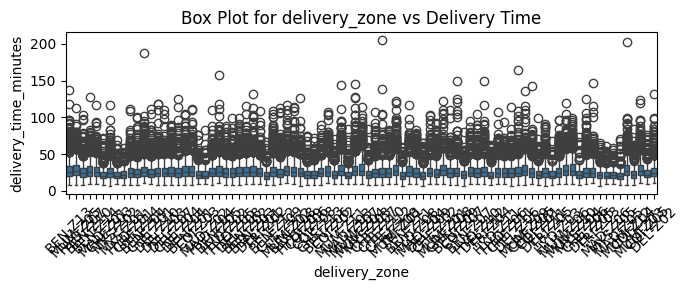

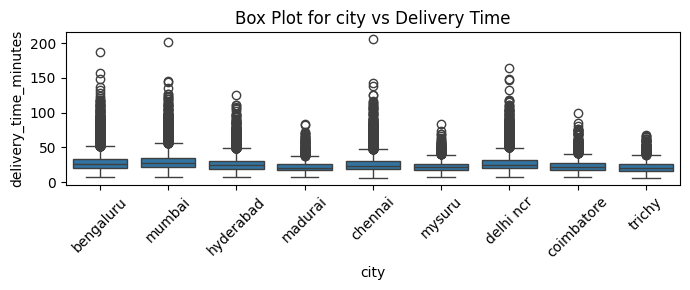

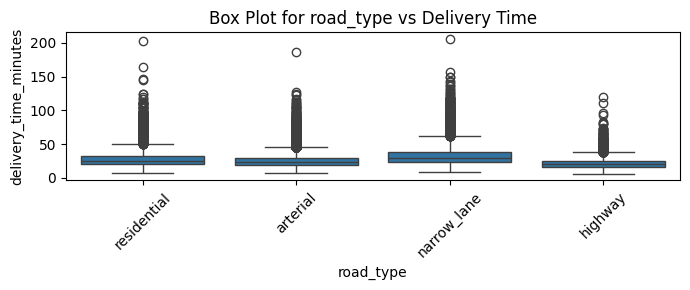

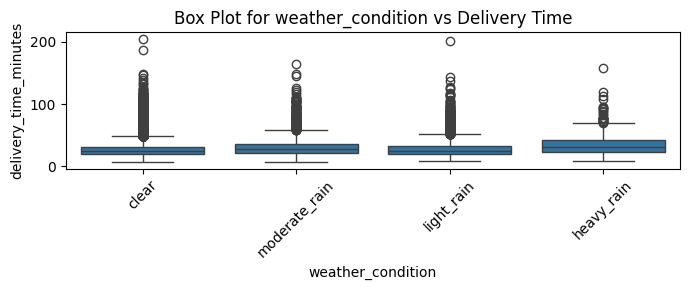

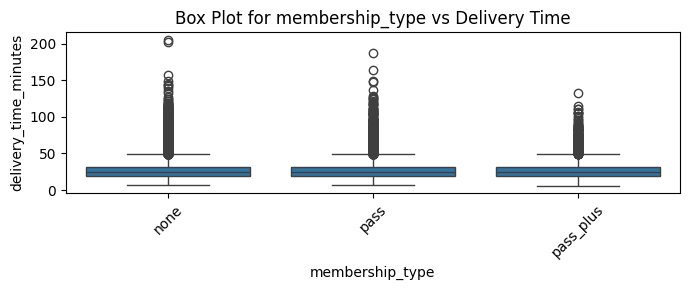

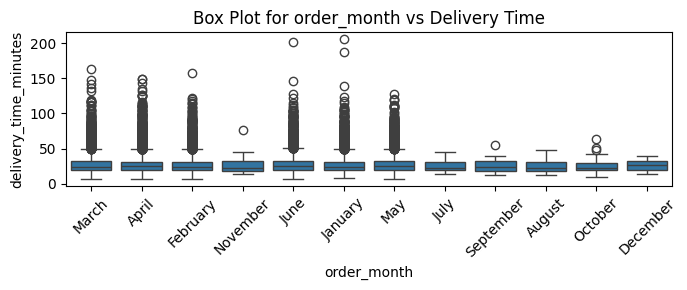

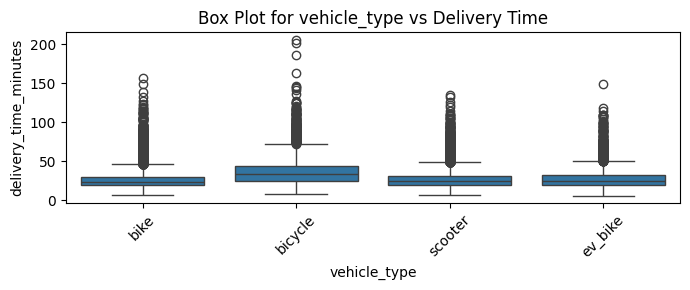

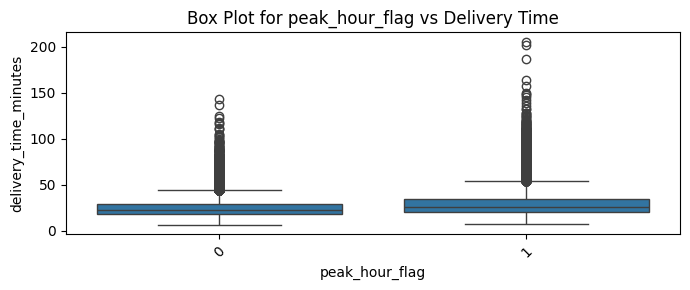

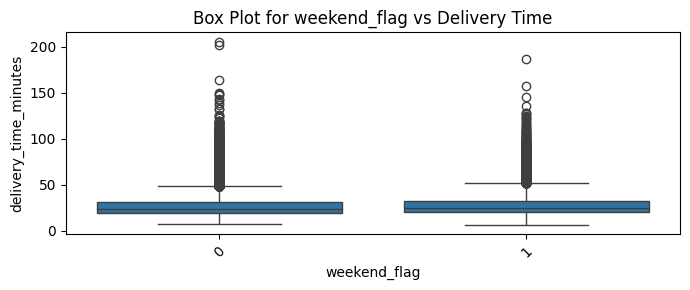

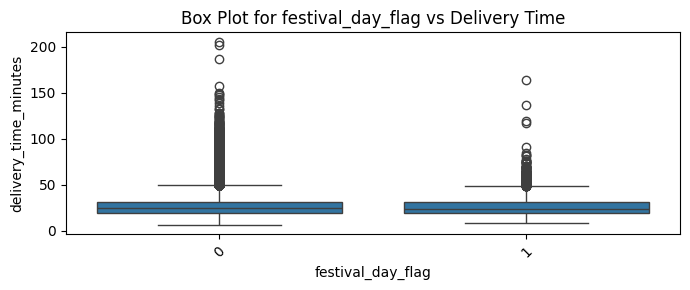

Selected_Catt_df_delivery_time:               Column                 Target    F_value   p_value  alpha  \
0      delivery_zone  delivery_time_minutes    37.0557  0.000000   0.05   
1               city  delivery_time_minutes   389.6519  0.000000   0.05   
2          road_type  delivery_time_minutes  2005.7418  0.000000   0.05   
3  weather_condition  delivery_time_minutes   470.1646  0.000000   0.05   
4    membership_type  delivery_time_minutes     0.4866  0.614735   0.05   
5        order_month  delivery_time_minutes     1.5084  0.120535   0.05   
6       vehicle_type  delivery_time_minutes  1430.3992  0.000000   0.05   
7     peak_hour_flag  delivery_time_minutes  3170.2343  0.000000   0.05   
8       weekend_flag  delivery_time_minutes   178.2637  0.000000   0.05   
9  festival_day_flag  delivery_time_minutes     3.3600  0.066804   0.05   

  Select_Status           Decision  
0           Yes          Reject H0  
1           Yes          Reject H0  
2           Yes          Reject

In [ ]:
# Categorical vs Delivery Time

for clm in cat_cols_charge:
    plt.figure(figsize=(7, 3))
    sns.boxplot(data=df, x=clm, y='delivery_time_minutes')
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {clm} vs Delivery Time')
    plt.tight_layout()
    plt.show()


Selected_Catt_clm_delivery_time = []

for col in cat_cols_charge:
    Selected_Catt_clm_delivery_time.append(
        anova_test(df, col, 'delivery_time_minutes')
    )

Selected_Catt_df_delivery_time = pd.DataFrame(
    Selected_Catt_clm_delivery_time
)

Category_Selected_columns_delivery_time = (
    Selected_Catt_df_delivery_time[
        Selected_Catt_df_delivery_time['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)

Selected_Catt_df_delivery_time
print("Selected_Catt_df_delivery_time:", Selected_Catt_df_delivery_time)
print("Category_Selected_columns_delivery_time:", Category_Selected_columns_delivery_time)

target- rider_accepted


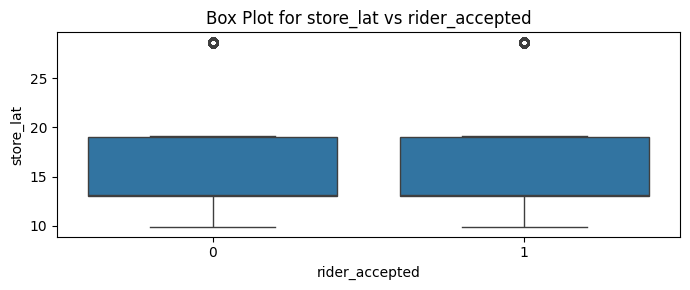

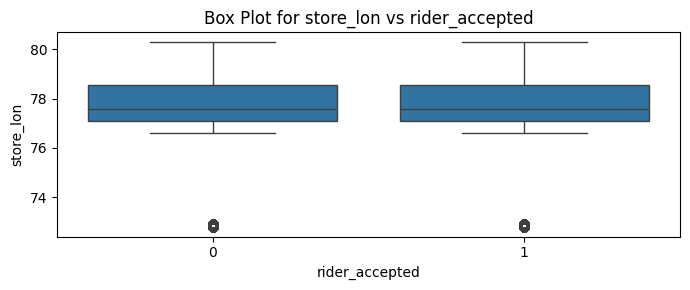

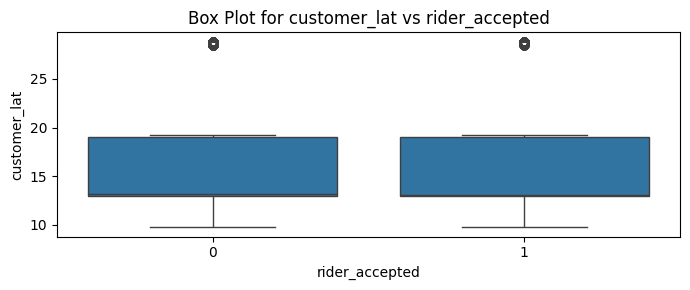

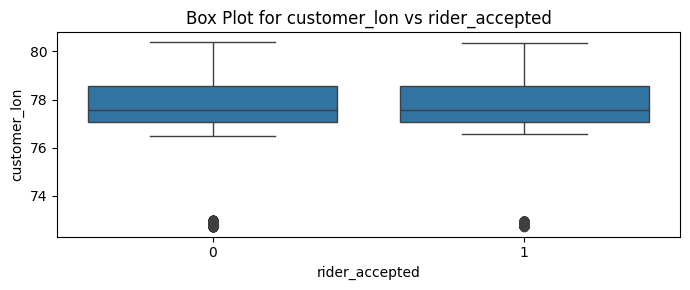

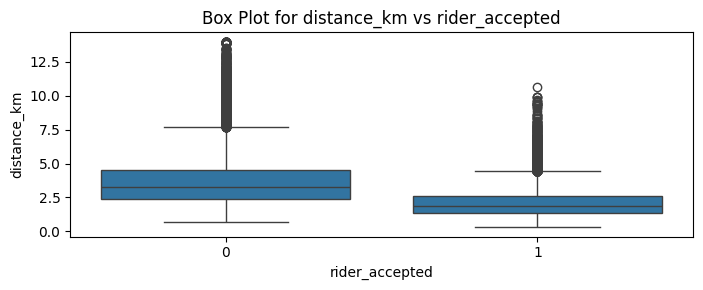

...

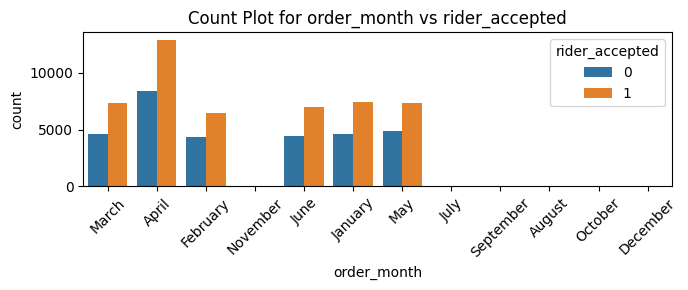

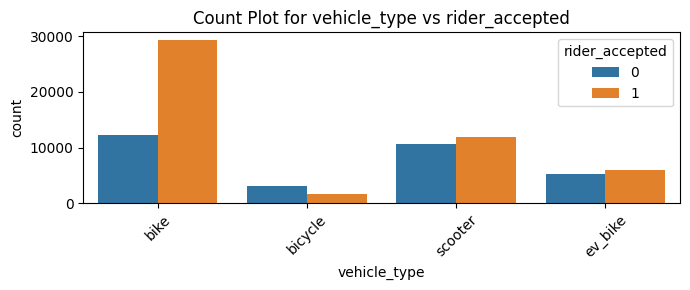

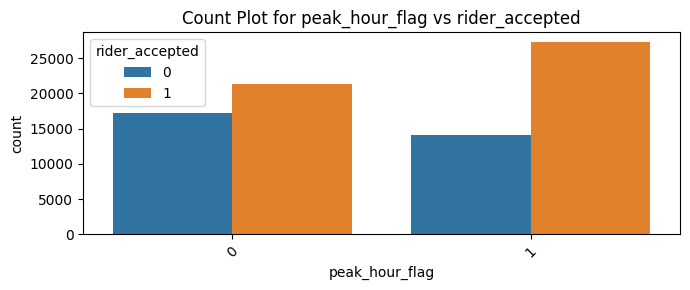

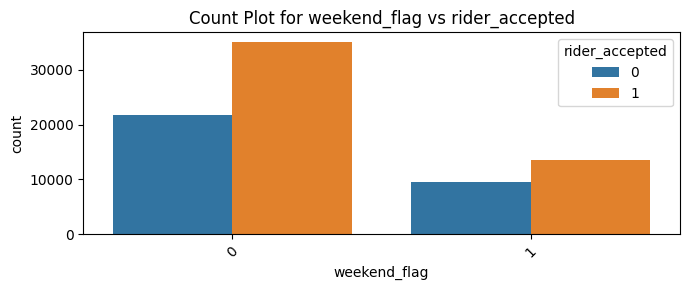

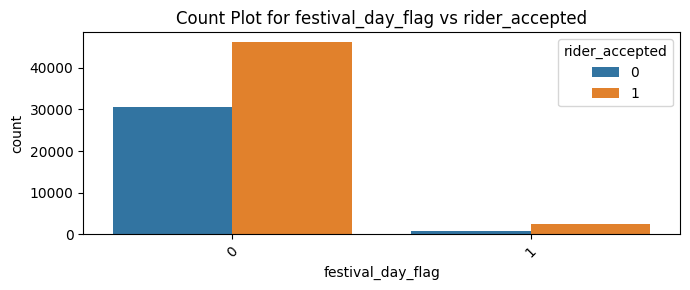


SELECTED FEATURES FOR is_accepted

Continuous Numerical:
['store_lat', 'customer_lat', 'distance_km', 'traffic_index', 'rainfall_mm', 'order_weight_kg', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive']

Discrete Numerical:
['city_tier', 'hour', 'weekday']

Categorical:
['delivery_zone', 'city', 'weather_condition', 'demand_level', 'vehicle_type', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag']

--- Continuous Results ---
                      Column          Target  Spearman_Correlation   p_value  \
0                  store_lat  rider_accepted               -0.0070  0.046173   
1                  store_lon  rider_accepted               -0.0019  0.590462   
2               customer_lat  rider_accepted               -0.0077  0.030027   
3               customer_lon  rider_accepted               -0.0020  0.579088   
4                distance_km  rider_accepted               -0.5130  0.000000   
5              traffic_index  rider_accepted   

In [ ]:
# ============================================================
# BIVARIATE ANALYSIS - TARGET: is_accepted
# ============================================================

target = 'rider_accepted'


# ============================================================
# 1. CONTINUOUS NUMERICAL COLUMNS vs is_accepted
# ============================================================

Selected_Num_Cont_is_accepted = []

for col in num_cont_cols:

    plt.figure(figsize=(7, 3))

    sns.boxplot(data=df, x=target, y=col)

    plt.title(f'Box Plot for {col} vs {target}')
    plt.tight_layout()
    plt.show()

    Selected_Num_Cont_is_accepted.append(
        spearman_test(df, col, target)
    )


Selected_Num_Cont_df_is_accepted = pd.DataFrame(
    Selected_Num_Cont_is_accepted
)

Num_Cont_Selected_columns_is_accepted = (
    Selected_Num_Cont_df_is_accepted[
        Selected_Num_Cont_df_is_accepted['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)


# ============================================================
# 2. DISCRETE NUMERICAL COLUMNS vs is_accepted
# ============================================================

Selected_Num_Dis_is_accepted = []

for col in num_disc_cols:

    plt.figure(figsize=(7, 3))

    sns.boxplot(data=df, x=target, y=col)

    plt.title(f'Box Plot for {col} vs {target}')
    plt.tight_layout()
    plt.show()

    Selected_Num_Dis_is_accepted.append(
        spearman_test(df, col, target)
    )


Selected_Num_Dis_df_is_accepted = pd.DataFrame(
    Selected_Num_Dis_is_accepted
)

Num_Dis_Selected_columns_is_accepted = (
    Selected_Num_Dis_df_is_accepted[
        Selected_Num_Dis_df_is_accepted['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)


# ============================================================
# 3. CATEGORICAL COLUMNS vs is_accepted
# ============================================================

Selected_Cat_is_accepted = []

for col in cat_cols:

    plt.figure(figsize=(7, 3))

    sns.countplot(data=df, x=col, hue=target)

    plt.xticks(rotation=45)

    plt.title(f'Count Plot for {col} vs {target}')
    plt.tight_layout()
    plt.show()

    Selected_Cat_is_accepted.append(
        anova_test(df, col, target)
    )


Selected_Cat_df_is_accepted = pd.DataFrame(
    Selected_Cat_is_accepted
)

Category_Selected_columns_is_accepted = (
    Selected_Cat_df_is_accepted[
        Selected_Cat_df_is_accepted['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)


# ============================================================
# PRINT SELECTED RESULTS
# ============================================================

print("\n==================================================")
print("SELECTED FEATURES FOR is_accepted")
print("==================================================")

print("\nContinuous Numerical:")
print(Num_Cont_Selected_columns_is_accepted)

print("\nDiscrete Numerical:")
print(Num_Dis_Selected_columns_is_accepted)

print("\nCategorical:")
print(Category_Selected_columns_is_accepted)


print("\n--- Continuous Results ---")
print(Selected_Num_Cont_df_is_accepted)

print("\n--- Discrete Results ---")
print(Selected_Num_Dis_df_is_accepted)

print("\n--- Categorical Results ---")
print(Selected_Cat_df_is_accepted)

In [10]:
cat_cols=[ "delivery_zone", "city", "road_type", "weather_condition", "membership_type", "demand_level","order_month", "vehicle_type", "peak_hour_flag", "weekend_flag", "festival_day_flag"]

In [11]:
# ============================================================
# CHI-SQUARE TEST - CATEGORICAL vs CATEGORICAL
# ============================================================

def chi_square_test(df, col, Target, alpha=0.05):

    temp = df[[col, Target]].dropna()

    # Create contingency table
    table = pd.crosstab(
        temp[col],
        temp[Target]
    )

    # Need at least 2 rows and 2 columns
    if table.shape[0] < 2 or table.shape[1] < 2:
        return {
            'Column': col,
            'Target': Target,
            'Chi2_value': None,
            'p_value': None,
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Insufficient Categories'
        }

    # Chi-Square test
    chi2, p, dof, expected = chi2_contingency(table)

    if p < alpha:
        return {
            'Column': col,
            'Target': Target,
            'Chi2_value': round(chi2, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'Yes',
            'Decision': 'Reject H0'
        }

    else:
        return {
            'Column': col,
            'Target': Target,
            'Chi2_value': round(chi2, 4),
            'p_value': round(p, 6),
            'alpha': alpha,
            'Select_Status': 'No',
            'Decision': 'Fail to Reject H0'
        }

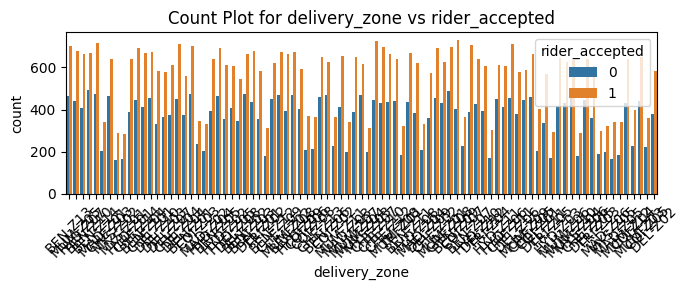

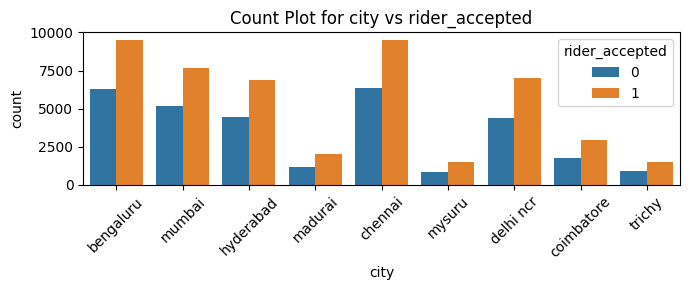

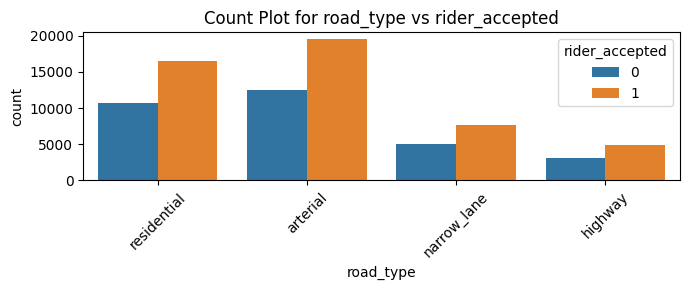

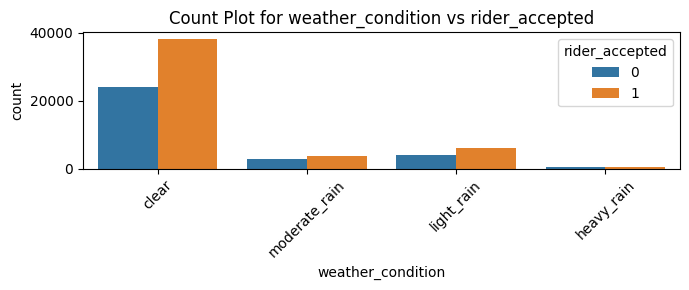

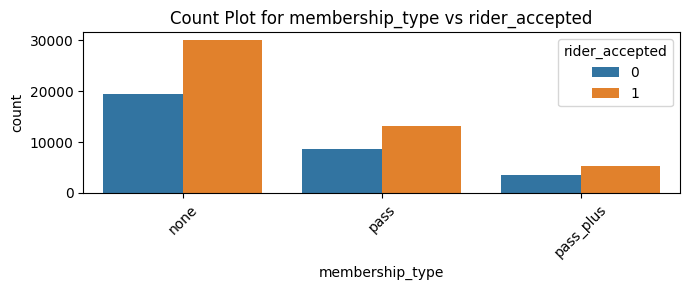

...

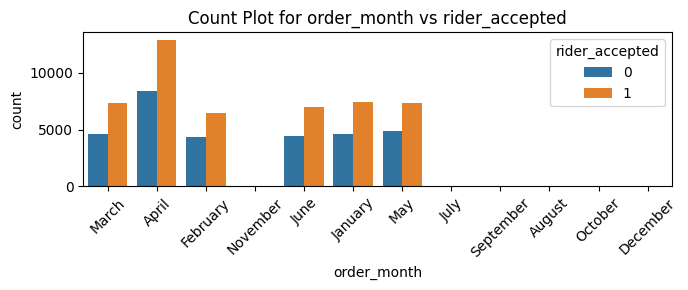

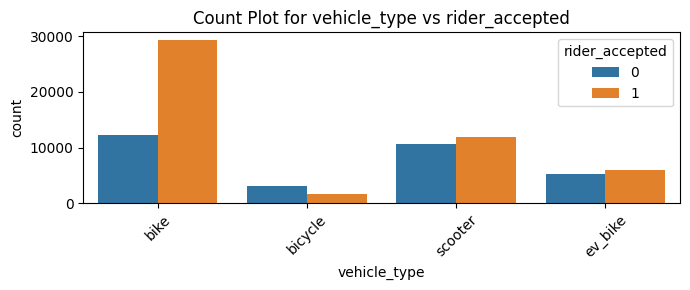

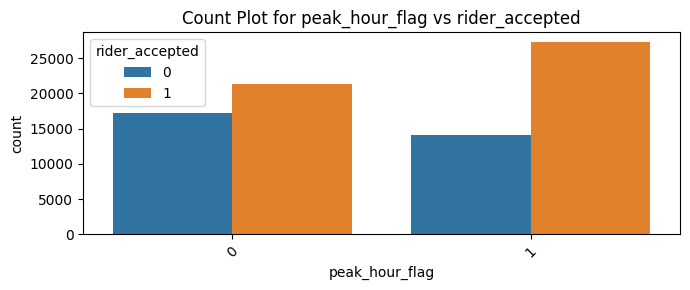

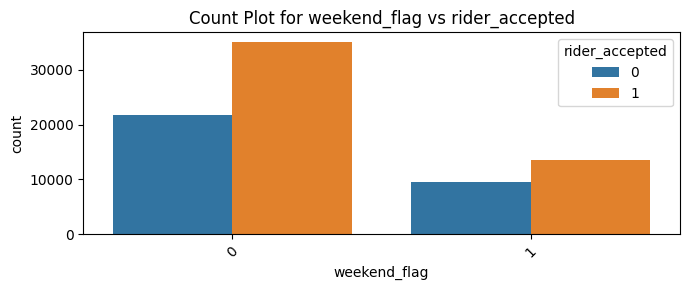

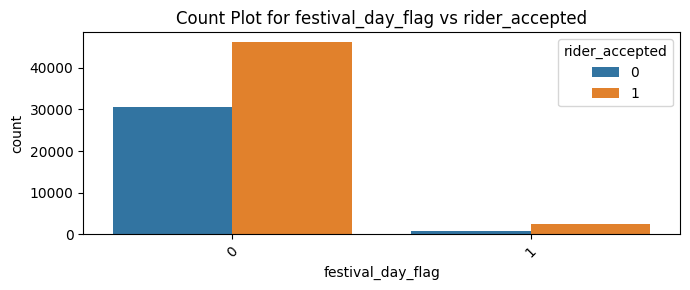

selected_Num_Cont_df:                Column          Target  Chi2_value   p_value  alpha  \
0       delivery_zone  rider_accepted    132.8671  0.000892   0.05   
1                city  rider_accepted     41.9634  0.000001   0.05   
2           road_type  rider_accepted      0.3502  0.950323   0.05   
3   weather_condition  rider_accepted     74.5977  0.000000   0.05   
4     membership_type  rider_accepted      0.6403  0.726036   0.05   
5        demand_level  rider_accepted    311.7074  0.000000   0.05   
6         order_month  rider_accepted     16.8088  0.113659   0.05   
7        vehicle_type  rider_accepted   3963.5211  0.000000   0.05   
8      peak_hour_flag  rider_accepted    957.6318  0.000000   0.05   
9        weekend_flag  rider_accepted     65.7478  0.000000   0.05   
10  festival_day_flag  rider_accepted    345.1725  0.000000   0.05   

   Select_Status           Decision  
0            Yes          Reject H0  
1            Yes          Reject H0  
2             No  Fail 

In [15]:
# ============================================================
# 3. CATEGORICAL COLUMNS vs is_accepted
# ============================================================
target = 'rider_accepted'
Selected_Cat_is_accepted = []

for col in cat_cols:

    plt.figure(figsize=(7, 3))

    sns.countplot(data=df, x=col, hue=target)

    plt.xticks(rotation=45)

    plt.title(f'Count Plot for {col} vs {target}')
    plt.tight_layout()
    plt.show()

    Selected_Cat_is_accepted.append(
        chi_square_test(df, col, target)
    )


Selected_Cat_df_is_accepted = pd.DataFrame(
    Selected_Cat_is_accepted
)

Category_Selected_columns_is_accepted = (
    Selected_Cat_df_is_accepted[
        Selected_Cat_df_is_accepted['Select_Status'] == 'Yes'
    ]['Column'].to_list()
)
print("selected_Num_Cont_df:", Selected_Cat_df_is_accepted)
print("Num_Cont_Selected_columns_delivery_charge:", Category_Selected_columns_is_accepted)

#EDA SELECTED COLUMNS

In [ ]:
print(df[['store_lat', 'customer_lat', 'store_lon', 'customer_lon']].describe())

          store_lat  customer_lat     store_lon  customer_lon
count  80000.000000  80000.000000  80000.000000  80000.000000
mean      16.494025     16.494096     77.415553     77.415568
std        5.644547      5.644479      2.286182      2.286217
min        9.824670      9.729386     72.774727     72.691804
25%       12.985599     12.980742     77.101690     77.057949
50%       13.102544     13.103252     77.573191     77.580531
75%       19.020807     19.029555     78.544213     78.544600
max       28.746180     28.841977     80.313144     80.405665


Numerical columns:
['store_lat', 'store_lon', 'city_tier', 'customer_lat', 'customer_lon', 'distance_km', 'traffic_index', 'rainfall_mm', 'hour', 'weekday', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag', 'item_count', 'order_amount', 'order_weight_kg', 'rider_experience_months', 'current_rider_load', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive', 'delivery_charge', 'delivery_time_minutes', 'rider_accepted', 'order_year']

All 3 target columns are available.

CORRELATION ANALYSIS WITH TARGET: delivery_charge

Correlation values:
distance_km                 0.697124
current_incentive           0.692935
delivery_time_minutes       0.636009
traffic_index               0.265704
peak_hour_flag              0.232534
rainfall_mm                 0.132625
festival_day_flag           0.122441
customer_lat                0.111923
store_lat                   0.111909
order_weight_kg             0.087908
weekend_flag                0.028537
hour     

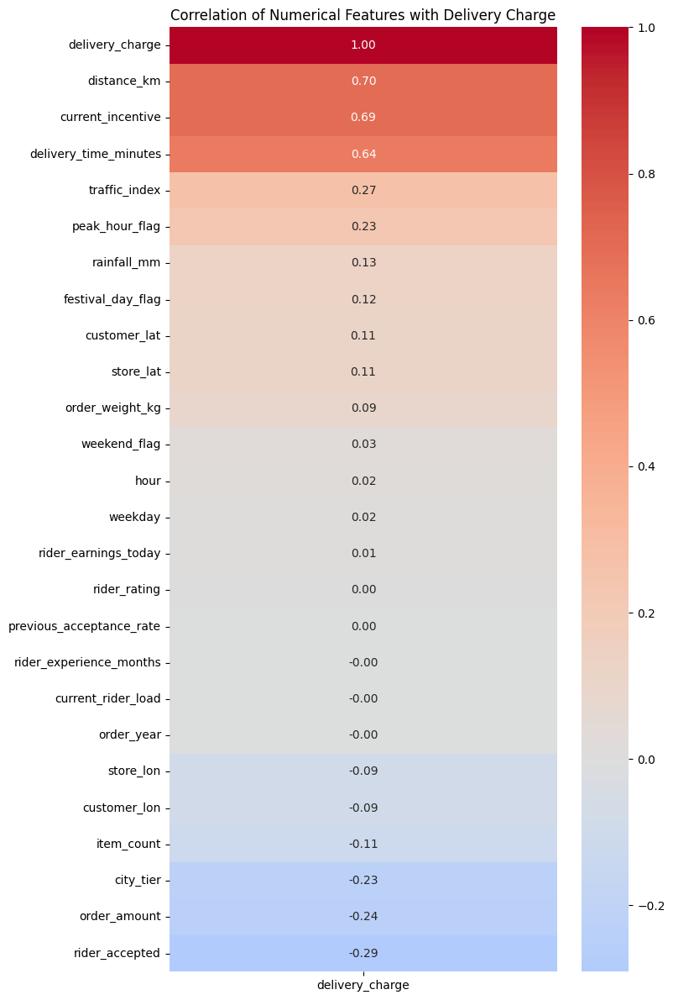

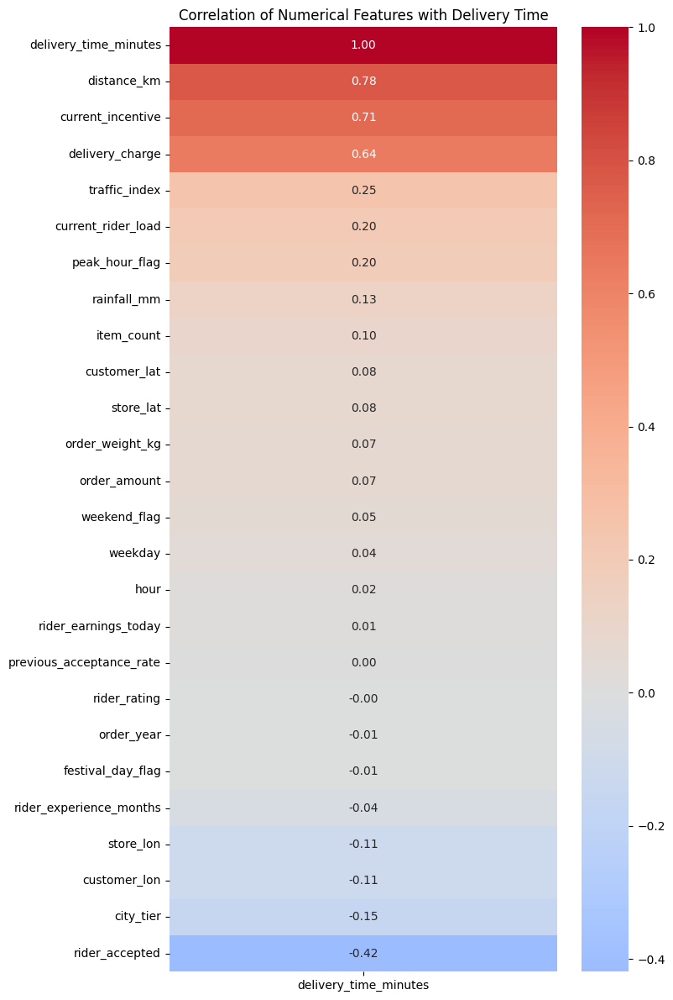

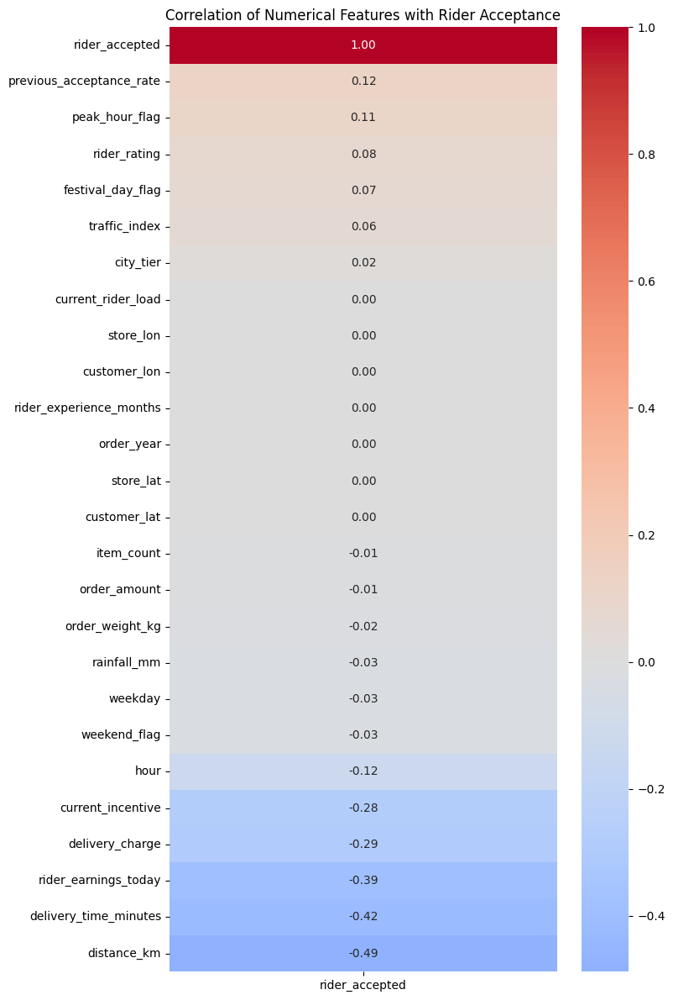


TOP POSITIVE CORRELATIONS WITH delivery_charge
distance_km              0.697124
current_incentive        0.692935
delivery_time_minutes    0.636009
traffic_index            0.265704
peak_hour_flag           0.232534
rainfall_mm              0.132625
festival_day_flag        0.122441
customer_lat             0.111923
store_lat                0.111909
order_weight_kg          0.087908
Name: delivery_charge, dtype: float64

TOP NEGATIVE CORRELATIONS WITH delivery_charge
rider_accepted             -0.290326
order_amount               -0.235742
city_tier                  -0.229394
item_count                 -0.109271
customer_lon               -0.085360
store_lon                  -0.085304
order_year                 -0.003886
current_rider_load         -0.002909
rider_experience_months    -0.001287
previous_acceptance_rate    0.001901
Name: delivery_charge, dtype: float64

TOP POSITIVE CORRELATIONS WITH delivery_time_minutes
distance_km           0.776858
current_incentive     0.714833
de

In [ ]:
# ============================================================
# CORRELATION ANALYSIS FOR ALL 3 TARGET VARIABLES
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------
# 1. Define the 3 target columns
# ------------------------------------------------------------

target_cols = [
    'delivery_charge',
    'delivery_time_minutes', # Changed from 'delivery_time' to 'delivery_time_minutes'
    'rider_accepted'
]

# ------------------------------------------------------------
# 2. Select numerical columns
# ------------------------------------------------------------

numeric_cols = df.select_dtypes(include=np.number).columns.tolist()

print("Numerical columns:")
print(numeric_cols)

# ------------------------------------------------------------
# 3. Check that all target columns are present
# ------------------------------------------------------------

missing_targets = [col for col in target_cols if col not in df.columns]

if missing_targets:
    print("\nMissing target columns:", missing_targets)
else:
    print("\nAll 3 target columns are available.")

# ------------------------------------------------------------
# 4. Correlation of ALL numerical features with each target
# ------------------------------------------------------------

for target in target_cols:

    print("\n" + "=" * 70)
    print(f"CORRELATION ANALYSIS WITH TARGET: {target}")
    print("=" * 70)

    # Correlation with target
    target_corr = (
        df[numeric_cols]
        .corr()[target]
        .drop(target)
        .sort_values(ascending=False)
    )

    print("\nCorrelation values:")
    print(target_corr)

# ------------------------------------------------------------
# 5. Absolute correlation ranking
#    Helps identify strongest relationships
# ------------------------------------------------------------

for target in target_cols:

    print("\n" + "=" * 70)
    print(f"ABSOLUTE CORRELATION RANKING: {target}")
    print("=" * 70)

    target_corr_abs = (
        df[numeric_cols]
        .corr()[target]
        .drop(target)
        .abs()
        .sort_values(ascending=False)
    )

    print(target_corr_abs)

# ------------------------------------------------------------
# 6. Correlation Heatmap - Delivery Charge
# ------------------------------------------------------------

corr_delivery_charge = df[numeric_cols].corr()[['delivery_charge']].sort_values(
    by='delivery_charge',
    ascending=False
)

plt.figure(figsize=(8, 12))
sns.heatmap(
    corr_delivery_charge,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0
)

plt.title('Correlation of Numerical Features with Delivery Charge')
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Correlation Heatmap - Delivery Time
# ------------------------------------------------------------

corr_delivery_time = df[numeric_cols].corr()[['delivery_time_minutes']].sort_values(
    by='delivery_time_minutes',
    ascending=False
)

plt.figure(figsize=(8, 12))
sns.heatmap(
    corr_delivery_time,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0
)

plt.title('Correlation of Numerical Features with Delivery Time')
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8. Correlation Heatmap - Rider Accepted
# ------------------------------------------------------------

corr_rider_accepted = df[numeric_cols].corr()[['rider_accepted']].sort_values(
    by='rider_accepted',
    ascending=False
)

plt.figure(figsize=(8, 12))
sns.heatmap(
    corr_rider_accepted,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0
)

plt.title('Correlation of Numerical Features with Rider Acceptance')
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9. Top positive and negative correlations for each target
# ------------------------------------------------------------

for target in target_cols:

    corr = df[numeric_cols].corr()[target].drop(target)

    positive = corr.sort_values(ascending=False).head(10)
    negative = corr.sort_values(ascending=True).head(10)

    print("\n" + "=" * 70)
    print(f"TOP POSITIVE CORRELATIONS WITH {target}")
    print("=" * 70)
    print(positive)

    print("\n" + "=" * 70)
    print(f"TOP NEGATIVE CORRELATIONS WITH {target}")
    print("=" * 70)
    print(negative)

# ------------------------------------------------------------
# 10. Create one summary table for all 3 targets
# ------------------------------------------------------------

correlation_summary = df[numeric_cols].corr()[target_cols].drop(
    index=target_cols,
    errors='ignore'
)

print("\n" + "=" * 70)
print("CORRELATION SUMMARY - ALL 3 TARGETS")
print("=" * 70)

print(correlation_summary)

# ------------------------------------------------------------
# 11. Save correlation summary if required
# ------------------------------------------------------------

correlation_summary.to_csv(
    'correlation_summary_all_targets.csv'
)

print("\nCorrelation analysis completed successfully.")

#multi variant analysis

Features used for multivariate analysis:
['distance_km', 'traffic_index', 'rainfall_mm', 'order_amount', 'order_weight_kg', 'current_rider_load', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive', 'hour', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag']

MULTIVARIATE ANALYSIS - DELIVERY CHARGE


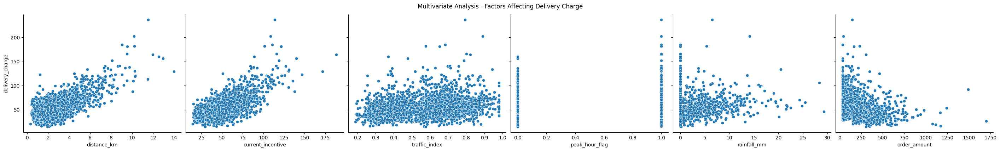

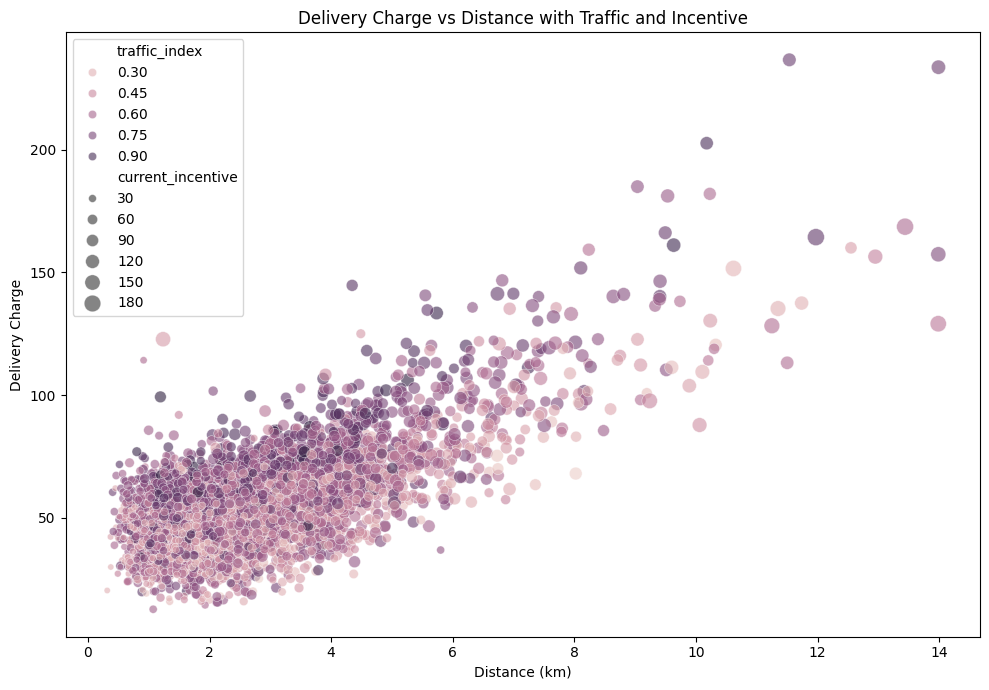


MULTIVARIATE ANALYSIS - DELIVERY TIME


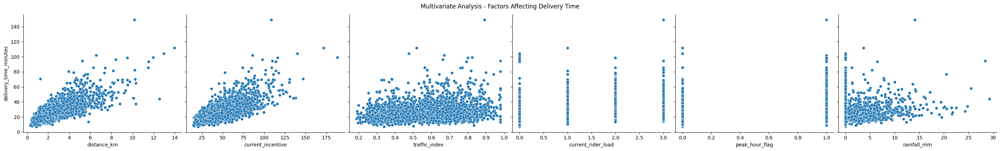

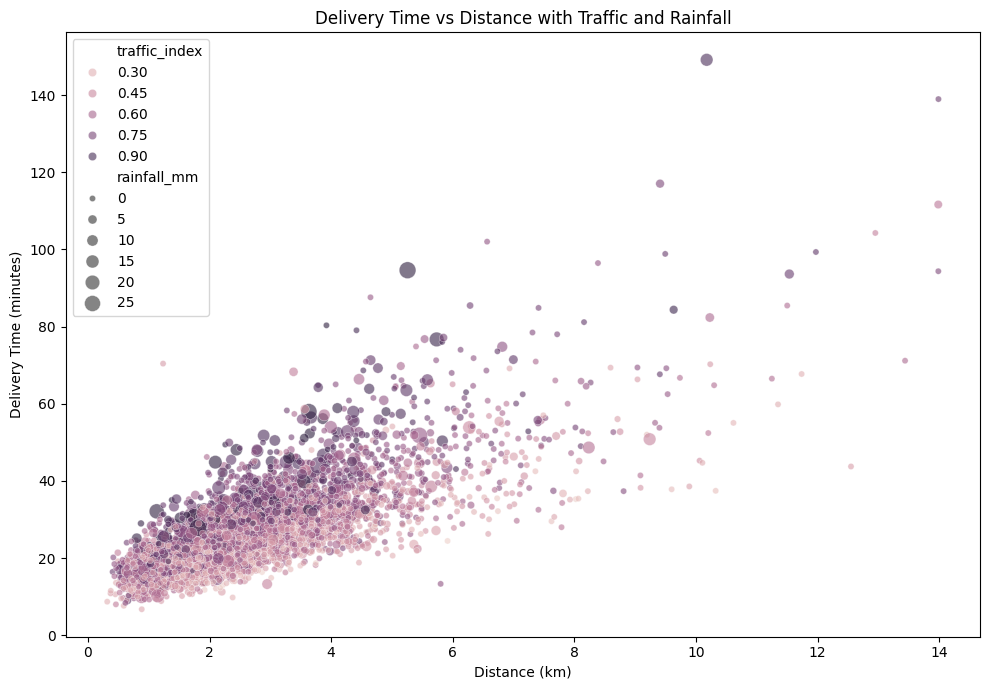

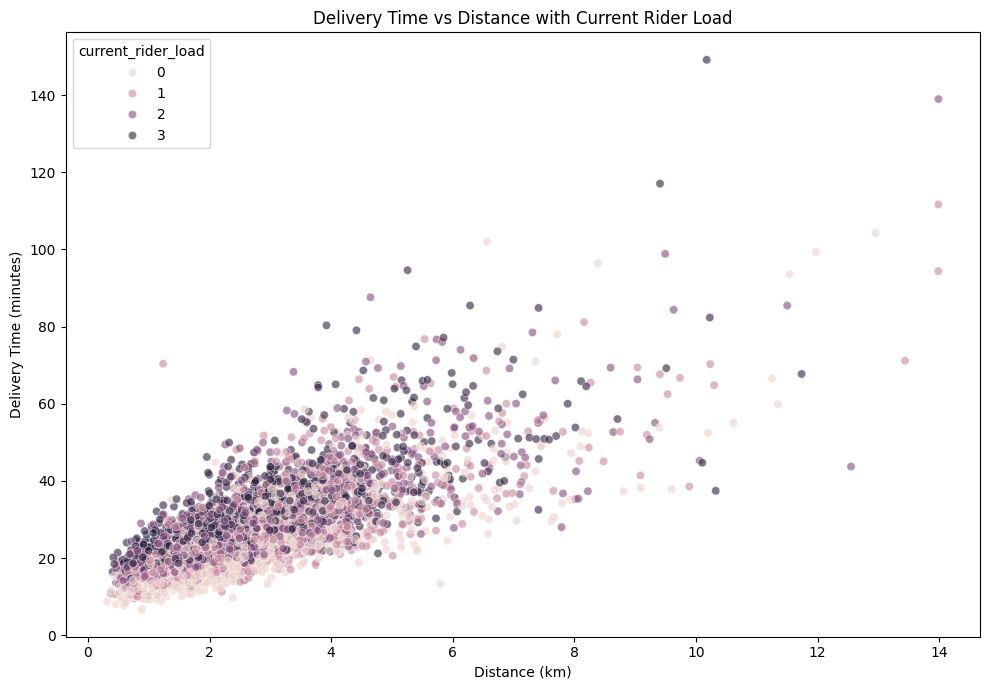


MULTIVARIATE ANALYSIS - RIDER ACCEPTANCE


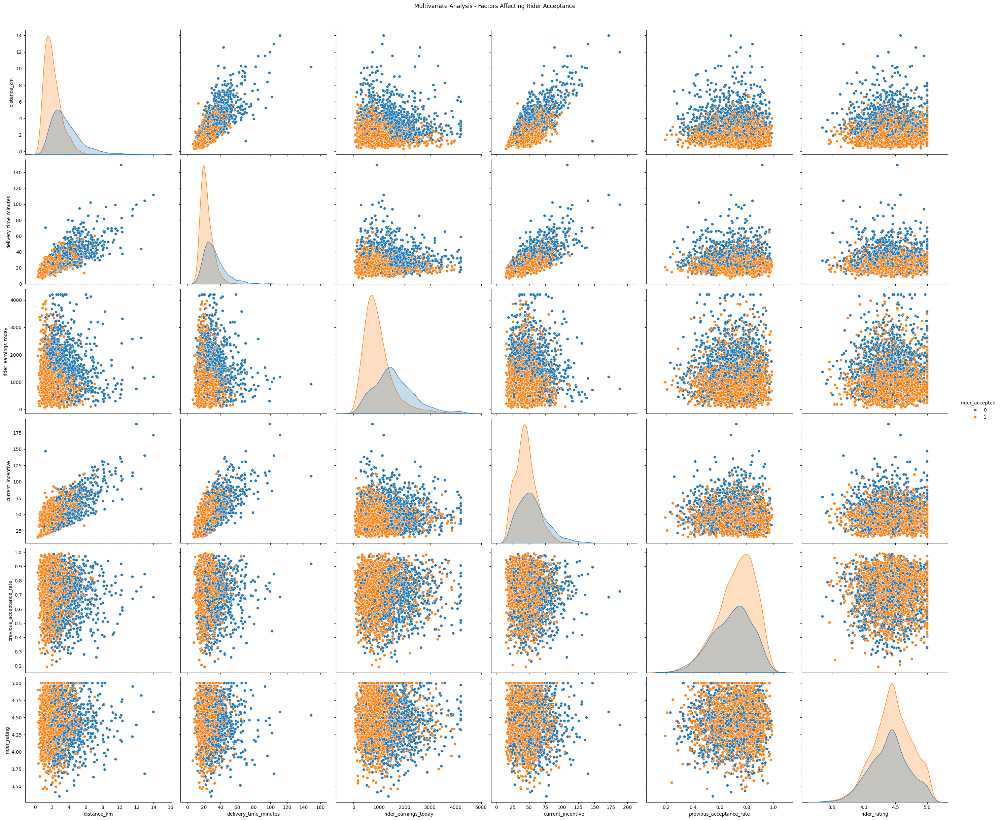

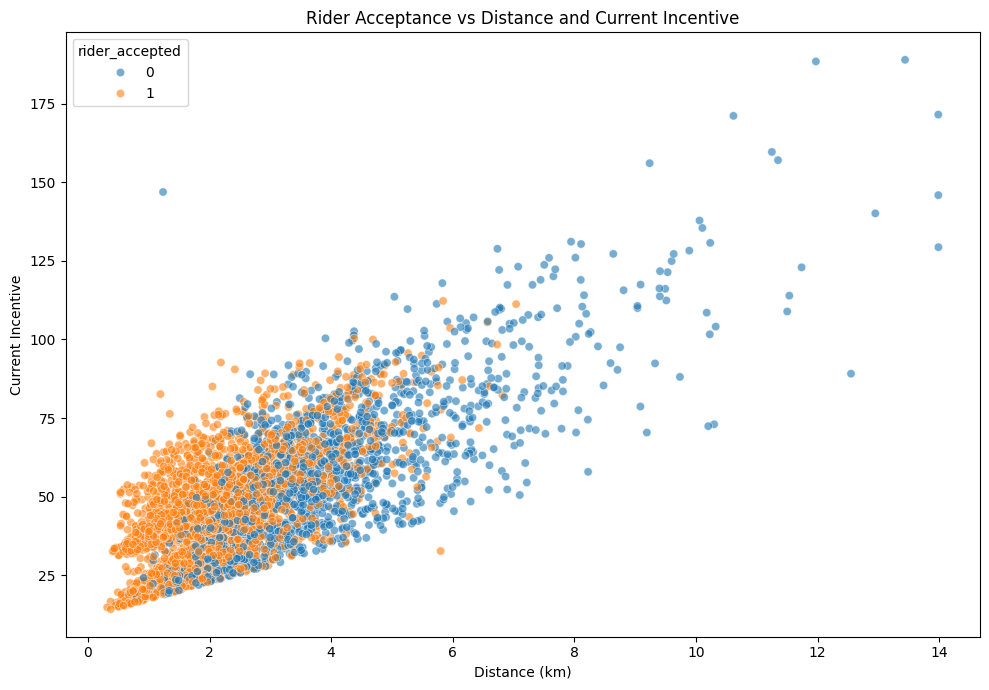

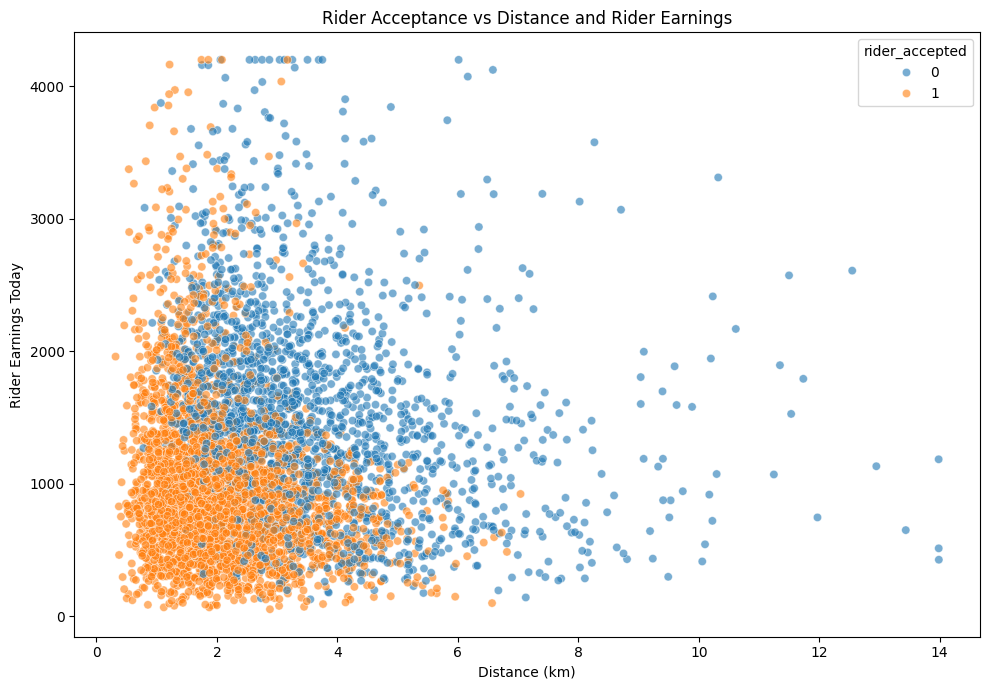

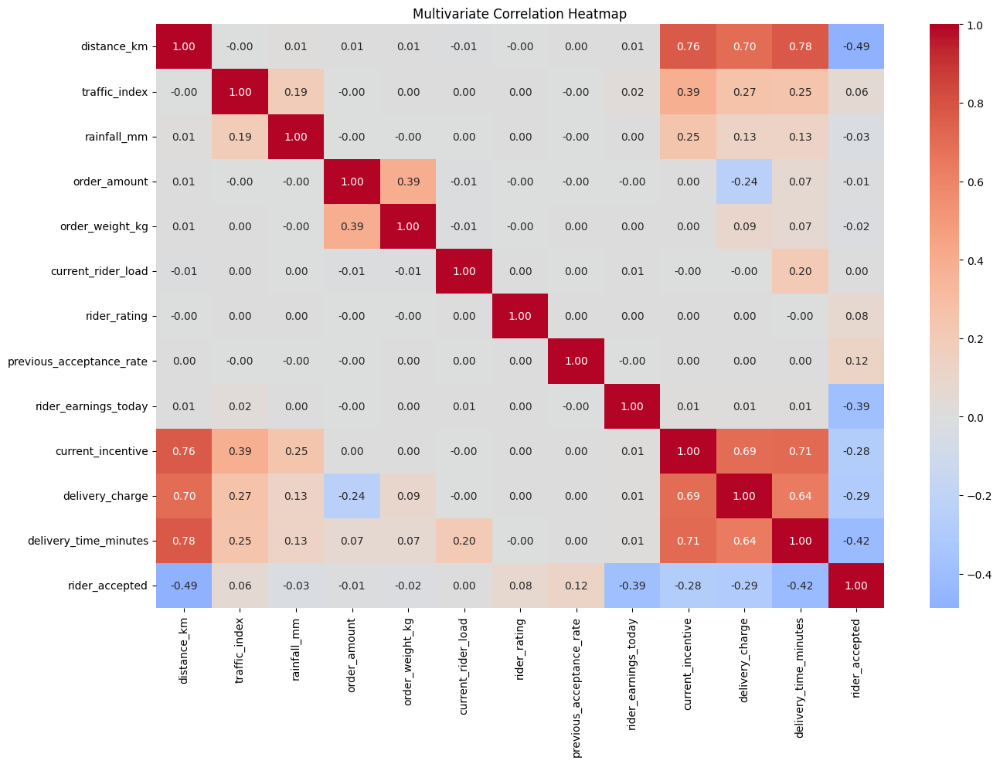


MULTIVARIATE ANALYSIS COMPLETED

Key relationships to investigate:

1. Delivery Charge
   - Distance
   - Current Incentive
   - Traffic
   - Peak Hour
   - Order Amount

2. Delivery Time
   - Distance
   - Current Incentive
   - Traffic
   - Rider Load
   - Rainfall
   - Peak Hour

3. Rider Acceptance
   - Distance
   - Delivery Time
   - Rider Earnings
   - Current Incentive
   - Previous Acceptance Rate
   - Rider Rating



In [ ]:
# ============================================================
# MULTIVARIATE ANALYSIS
# For all 3 Target Variables
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------
# 1. Define target columns
# ------------------------------------------------------------

target_cols = [
    'delivery_charge',
    'delivery_time_minutes',
    'rider_accepted'
]

# ------------------------------------------------------------
# 2. Define important numerical features
#    Based on your correlation analysis
# ------------------------------------------------------------

important_num_features = [
    'distance_km',
    'traffic_index',
    'rainfall_mm',
    'order_amount',
    'order_weight_kg',
    'current_rider_load',
    'rider_rating',
    'previous_acceptance_rate',
    'rider_earnings_today',
    'current_incentive',
    'hour',
    'peak_hour_flag',
    'weekend_flag',
    'festival_day_flag'
]

# Keep only columns that actually exist in df
important_num_features = [
    col for col in important_num_features
    if col in df.columns
]

print("Features used for multivariate analysis:")
print(important_num_features)


# ============================================================
# 3. MULTIVARIATE ANALYSIS - DELIVERY CHARGE
# ============================================================

print("\n" + "=" * 70)
print("MULTIVARIATE ANALYSIS - DELIVERY CHARGE")
print("=" * 70)

# Select top features based on correlation
charge_features = [
    'distance_km',
    'current_incentive',
    'traffic_index',
    'peak_hour_flag',
    'rainfall_mm',
    'order_amount'
]

charge_features = [
    col for col in charge_features
    if col in df.columns
]

# Pairplot
sns.pairplot(
    df[charge_features + ['delivery_charge']].sample(
        min(3000, len(df)),
        random_state=42
    ),
    y_vars=['delivery_charge'],
    x_vars=charge_features,
    height=4,
    aspect=1.2
)

plt.suptitle(
    'Multivariate Analysis - Factors Affecting Delivery Charge',
    y=1.05
)

plt.show()


# ============================================================
# 4. DELIVERY CHARGE:
#    Distance + Traffic + Incentive
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(min(5000, len(df)), random_state=42),
    x='distance_km',
    y='delivery_charge',
    hue='traffic_index',
    size='current_incentive',
    sizes=(20, 150),
    alpha=0.6
)

plt.title(
    'Delivery Charge vs Distance with Traffic and Incentive'
)

plt.xlabel('Distance (km)')
plt.ylabel('Delivery Charge')

plt.tight_layout()
plt.show()


# ============================================================
# 5. MULTIVARIATE ANALYSIS - DELIVERY TIME
# ============================================================

print("\n" + "=" * 70)
print("MULTIVARIATE ANALYSIS - DELIVERY TIME")
print("=" * 70)

time_features = [
    'distance_km',
    'current_incentive',
    'traffic_index',
    'current_rider_load',
    'peak_hour_flag',
    'rainfall_mm'
]

time_features = [
    col for col in time_features
    if col in df.columns
]

sns.pairplot(
    df[time_features + ['delivery_time_minutes']].sample(
        min(3000, len(df)),
        random_state=42
    ),
    y_vars=['delivery_time_minutes'],
    x_vars=time_features,
    height=4,
    aspect=1.2
)

plt.suptitle(
    'Multivariate Analysis - Factors Affecting Delivery Time',
    y=1.05
)

plt.show()


# ============================================================
# 6. DELIVERY TIME:
#    Distance + Traffic + Rainfall
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(min(5000, len(df)), random_state=42),
    x='distance_km',
    y='delivery_time_minutes',
    hue='traffic_index',
    size='rainfall_mm',
    sizes=(20, 150),
    alpha=0.6
)

plt.title(
    'Delivery Time vs Distance with Traffic and Rainfall'
)

plt.xlabel('Distance (km)')
plt.ylabel('Delivery Time (minutes)')

plt.tight_layout()
plt.show()


# ============================================================
# 7. DELIVERY TIME:
#    Distance + Current Rider Load
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(min(5000, len(df)), random_state=42),
    x='distance_km',
    y='delivery_time_minutes',
    hue='current_rider_load',
    alpha=0.6
)

plt.title(
    'Delivery Time vs Distance with Current Rider Load'
)

plt.xlabel('Distance (km)')
plt.ylabel('Delivery Time (minutes)')

plt.tight_layout()
plt.show()


# ============================================================
# 8. MULTIVARIATE ANALYSIS - RIDER ACCEPTANCE
# ============================================================

print("\n" + "=" * 70)
print("MULTIVARIATE ANALYSIS - RIDER ACCEPTANCE")
print("=" * 70)

acceptance_features = [
    'distance_km',
    'delivery_time_minutes',
    'rider_earnings_today',
    'current_incentive',
    'previous_acceptance_rate',
    'rider_rating'
]

acceptance_features = [
    col for col in acceptance_features
    if col in df.columns
]

# Pairplot using rider_accepted as hue
sns.pairplot(
    df[
        acceptance_features + ['rider_accepted']
    ].sample(
        min(3000, len(df)),
        random_state=42
    ),
    hue='rider_accepted',
    height=4,
    aspect=1.2
)

plt.suptitle(
    'Multivariate Analysis - Factors Affecting Rider Acceptance',
    y=1.02
)

plt.show()


# ============================================================
# 9. RIDER ACCEPTANCE:
#    Distance + Incentive
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(min(5000, len(df)), random_state=42),
    x='distance_km',
    y='current_incentive',
    hue='rider_accepted',
    alpha=0.6
)

plt.title(
    'Rider Acceptance vs Distance and Current Incentive'
)

plt.xlabel('Distance (km)')
plt.ylabel('Current Incentive')

plt.tight_layout()
plt.show()


# ============================================================
# 10. RIDER ACCEPTANCE:
#     Distance + Earnings
# ============================================================

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=df.sample(min(5000, len(df)), random_state=42),
    x='distance_km',
    y='rider_earnings_today',
    hue='rider_accepted',
    alpha=0.6
)

plt.title(
    'Rider Acceptance vs Distance and Rider Earnings'
)

plt.xlabel('Distance (km)')
plt.ylabel('Rider Earnings Today')

plt.tight_layout()
plt.show()


# ============================================================
# 11. MULTIVARIATE CORRELATION HEATMAP
# ============================================================

multivariate_cols = [
    'distance_km',
    'traffic_index',
    'rainfall_mm',
    'order_amount',
    'order_weight_kg',
    'current_rider_load',
    'rider_rating',
    'previous_acceptance_rate',
    'rider_earnings_today',
    'current_incentive',
    'delivery_charge',
    'delivery_time_minutes',
    'rider_accepted'
]

multivariate_cols = [
    col for col in multivariate_cols
    if col in df.columns
]

plt.figure(figsize=(14, 10))

sns.heatmap(
    df[multivariate_cols].corr(),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0
)

plt.title(
    'Multivariate Correlation Heatmap'
)

plt.tight_layout()
plt.show()


# ============================================================
# 12. SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("MULTIVARIATE ANALYSIS COMPLETED")
print("=" * 70)

print("""
Key relationships to investigate:

1. Delivery Charge
   - Distance
   - Current Incentive
   - Traffic
   - Peak Hour
   - Order Amount

2. Delivery Time
   - Distance
   - Current Incentive
   - Traffic
   - Rider Load
   - Rainfall
   - Peak Hour

3. Rider Acceptance
   - Distance
   - Delivery Time
   - Rider Earnings
   - Current Incentive
   - Previous Acceptance Rate
   - Rider Rating
""")

Target columns:
['delivery_charge', 'delivery_time_minutes', 'rider_accepted']

Columns removed from feature candidates:
[]

Numerical feature candidates:
['store_lat', 'store_lon', 'city_tier', 'customer_lat', 'customer_lon', 'distance_km', 'traffic_index', 'rainfall_mm', 'hour', 'weekday', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag', 'item_count', 'order_amount', 'order_weight_kg', 'rider_experience_months', 'current_rider_load', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive', 'order_year']

FEATURE CORRELATION WITH delivery_charge
distance_km                 0.697124
current_incentive           0.692935
traffic_index               0.265704
order_amount               -0.235742
peak_hour_flag              0.232534
city_tier                  -0.229394
rainfall_mm                 0.132625
festival_day_flag           0.122441
customer_lat                0.111923
store_lat                   0.111909
item_count                 -0.109271
or

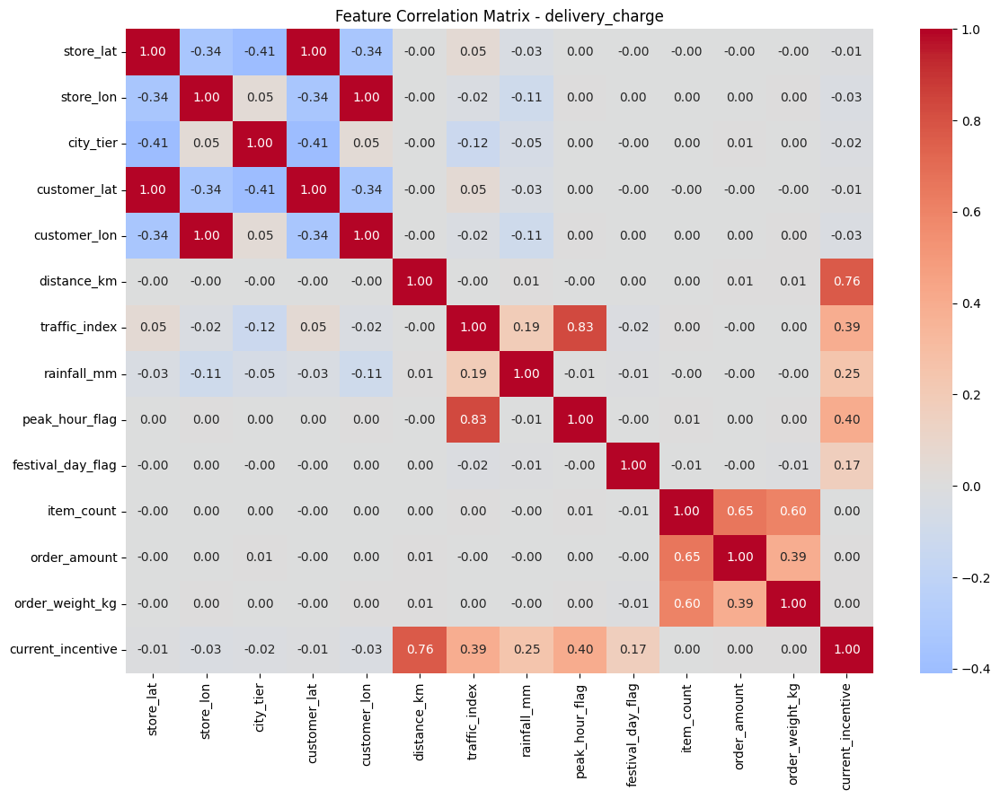


----------------------------------------------------------------------
Feature correlation matrix for delivery_time_minutes
----------------------------------------------------------------------


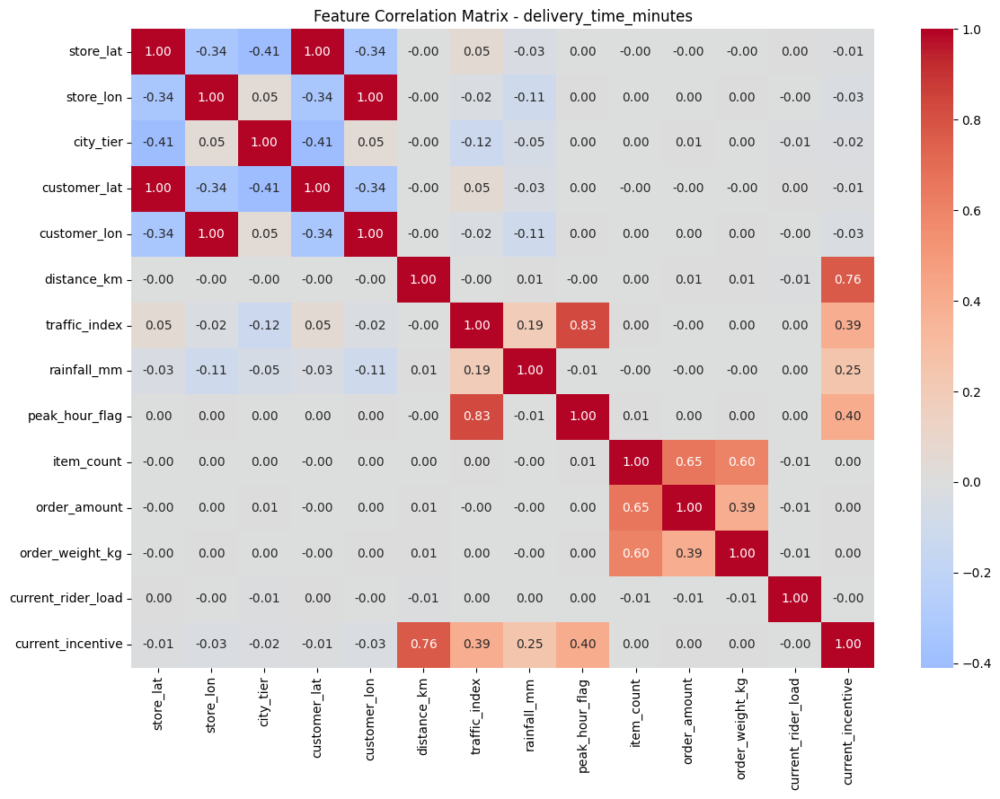


----------------------------------------------------------------------
Feature correlation matrix for rider_accepted
----------------------------------------------------------------------


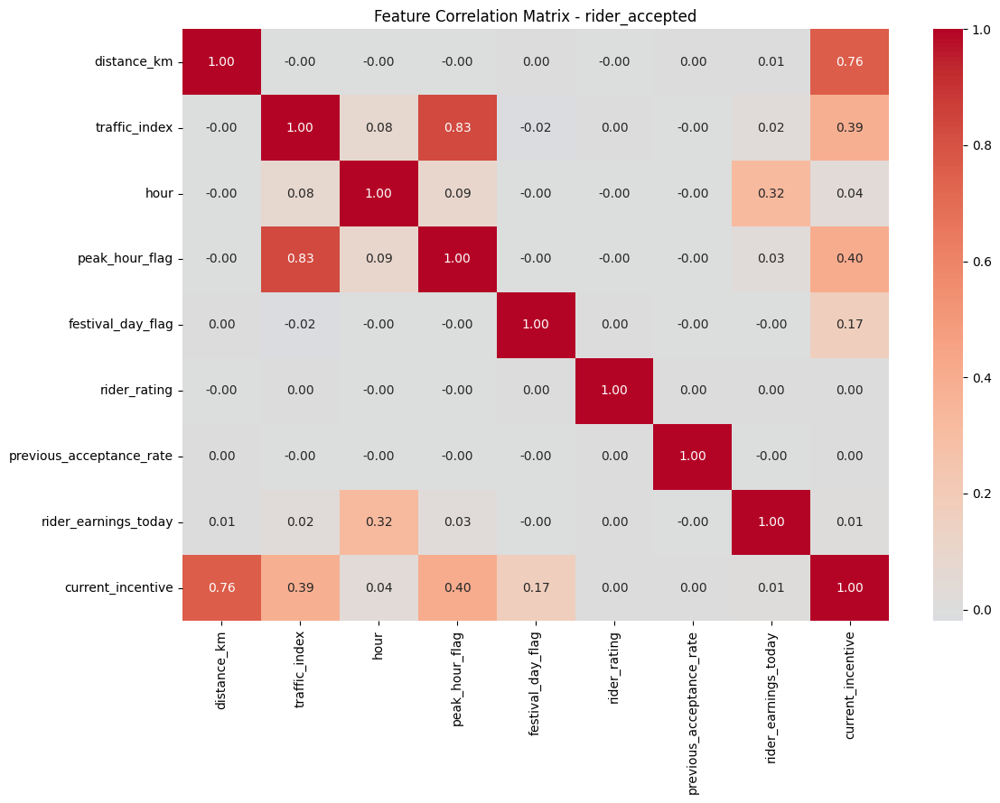


HIGHLY CORRELATED FEATURE PAIRS - delivery_charge
store_lat <-> customer_lat : 1.000
store_lon <-> customer_lon : 1.000
traffic_index <-> peak_hour_flag : 0.831

HIGHLY CORRELATED FEATURE PAIRS - delivery_time_minutes
store_lat <-> customer_lat : 1.000
store_lon <-> customer_lon : 1.000
traffic_index <-> peak_hour_flag : 0.831

HIGHLY CORRELATED FEATURE PAIRS - rider_accepted
traffic_index <-> peak_hour_flag : 0.831


In [ ]:
# ============================================================
# FEATURE SELECTION FOR ALL 3 TARGETS
# ============================================================

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Define target columns
# ------------------------------------------------------------

target_cols = [
    'delivery_charge',
    'delivery_time_minutes',
    'rider_accepted'
]

print("Target columns:")
print(target_cols)


# ============================================================
# 2. Remove ID / non-predictive columns
# ============================================================

# Check your actual columns before dropping
possible_drop_cols = [
    'order_id',
    'store_id',
    'customer_id',
    'rider_id',
    'promo_code_applied',
    'order_placed_at'
]

drop_cols = [
    col for col in possible_drop_cols
    if col in df.columns
]

print("\nColumns removed from feature candidates:")
print(drop_cols)


# ============================================================
# 3. Create numerical feature list
# ============================================================

numeric_cols = df.select_dtypes(include=np.number).columns.tolist()

# Remove all target columns from predictors
feature_cols = [
    col for col in numeric_cols
    if col not in target_cols
]

# Remove ID-like columns if they are numerical
feature_cols = [
    col for col in feature_cols
    if col not in drop_cols
]

print("\nNumerical feature candidates:")
print(feature_cols)


# ============================================================
# 4. Check correlation with each target
# ============================================================

for target in target_cols:

    print("\n" + "=" * 70)
    print(f"FEATURE CORRELATION WITH {target}")
    print("=" * 70)

    corr = (
        df[feature_cols + [target]]
        .corr()[target]
        .drop(target)
        .sort_values(key=abs, ascending=False)
    )

    print(corr)


# ============================================================
# 5. Select features using correlation threshold
# ============================================================

# Threshold for initial feature screening
CORR_THRESHOLD = 0.05

selected_features = {}

for target in target_cols:

    corr = (
        df[feature_cols + [target]]
        .corr()[target]
        .drop(target)
    )

    selected = corr[abs(corr) >= CORR_THRESHOLD].index.tolist()

    selected_features[target] = selected

    print("\n" + "=" * 70)
    print(f"SELECTED FEATURES FOR {target}")
    print("=" * 70)

    print(f"Correlation threshold: |r| >= {CORR_THRESHOLD}")
    print(f"Number of selected features: {len(selected)}")
    print(selected)


# ============================================================
# 6. Check multicollinearity among selected features
# ============================================================

print("\n" + "=" * 70)
print("MULTICOLLINEARITY CHECK")
print("=" * 70)

for target in target_cols:

    features = selected_features[target]

    if len(features) < 2:
        print(f"\n{target}: Not enough features for multicollinearity check.")
        continue

    corr_matrix = df[features].corr()

    print("\n" + "-" * 70)
    print(f"Feature correlation matrix for {target}")
    print("-" * 70)

    plt.figure(figsize=(12, 9))

    sns.heatmap(
        corr_matrix,
        annot=True,
        fmt='.2f',
        cmap='coolwarm',
        center=0
    )

    plt.title(
        f'Feature Correlation Matrix - {target}'
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 7. Identify highly correlated feature pairs
# ============================================================

HIGH_CORR_THRESHOLD = 0.80

for target in target_cols:

    features = selected_features[target]

    if len(features) < 2:
        continue

    corr_matrix = df[features].corr()

    # Take upper triangle only
    upper = corr_matrix.where(
        np.triu(
            np.ones(corr_matrix.shape),
            k=1
        ).astype(bool)
    )

    highly_correlated_pairs = []

    for col in upper.columns:

        for row in upper.index:

            value = upper.loc[row, col]

            if pd.notna(value) and abs(value) >= HIGH_CORR_THRESHOLD:

                highly_correlated_pairs.append(
                    (row, col, value)
                )

    print("\n" + "=" * 70)
    print(f"HIGHLY CORRELATED FEATURE PAIRS - {target}")
    print("=" * 70)

    if highly_correlated_pairs:

        for pair in highly_correlated_pairs:
            print(
                f"{pair[0]} <-> {pair[1]} : "
                f"{pair[2]:.3f}"
            )

    else:
        print("No feature pairs above the 0.80 correlation threshold.")




#Building Preprocess PipeLine and Model Building

In [ ]:
Num_Cont_DC = ['store_lat', 'store_lon', 'customer_lat', 'customer_lon', 'distance_km', 'traffic_index', 'rainfall_mm', 'order_amount', 'order_weight_kg', 'rider_earnings_today', 'current_incentive']
Num_disc_DC = ['city_tier', 'hour', 'weekday', 'item_count']
Cat_DC = ['delivery_zone', 'city', 'weather_condition', 'membership_type', 'order_month', 'vehicle_type', 'peak_hour_flag', 'weekend_flag', 'festival_day_flag']


#preprocess pipeline for Delivery charge

In [ ]:
# Pipelines For Delivery Charge

Num_Cont_Transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='median')),
    ('MinMax_Scalar',MinMaxScaler())
])

Num_Disct_transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='most_frequent'))])


Cat_Transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='most_frequent')),
    ('OneHot_encoder',OneHotEncoder(handle_unknown='ignore'))
]) # Defining Steps of Preprocess in Categorical Columns


In [ ]:
# Columns Transformer For Delivery Charge

Preprocessor_Step=ColumnTransformer(transformers=[
     ('NC',Num_Cont_Transformer,Num_Cont_DC),
     ('ND',Num_Disct_transformer,Num_disc_DC),
     ('CT',Cat_Transformer,Cat_DC) ]) # Defining Which Columns Should Pass Through the Pipeline

#Buliding the Model for Regression Target-Delivery charge

In [ ]:
X=df.drop(['delivery_charge','delivery_time_minutes','rider_accepted'], axis=1)
Y_DC=df['delivery_charge']
Y_DT=df['delivery_time_minutes']
Y_Accp=df['rider_accepted']

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y_DC,test_size=0.2,random_state=42)
X_train.shape,X_test.shape,Y_train.shape,Y_test.shape

((64000, 31), (16000, 31), (64000,), (16000,))

In [ ]:
LR_pipeline=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step),
    ('LR',LinearRegression())
  ])

In [ ]:
LR_pipeline.fit(X_train,Y_train) # Training Model

Pipeline(steps=[('Preprocessor',
                 ColumnTransformer(transformers=[('NC',
                                                  Pipeline(steps=[('Simple_imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('MinMax_Scalar',
                                                                   MinMaxScaler())]),
                                                  ['store_lat', 'store_lon',
                                                   'customer_lat',
                                                   'customer_lon',
                                                   'distance_km',
                                                   'traffic_index',
                                                   'rainfall_mm',
                                                   'order_amount',
                                                   'order_weight_kg',
                                                   'rider_earnings_today',
                                                   'current_incentive']),...
                                                  ['city_tier', 'hour',
                                                   'weekday', 'item_count']),
                                                 ('CT',
                                                  Pipeline(steps=[('Simple_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('OneHot_encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['delivery_zone', 'city',
                                                   'weather_condition',
                                                   'membership_type',
                                                   'order_month',
                                                   'vehicle_type',
                                                   'peak_hour_flag',
                                                   'weekend_flag',
                                                   'festival_day_flag'])])),
                ('LR', LinearRegression())])

In [ ]:
#model evaluation

Y_train_pred=LR_pipeline.predict(X_train)
Y_test_pred=LR_pipeline.predict(X_test)
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 6.473769142579087
MAE_test: 6.466641125595103
r2_score_train: 0.8070722880725624
r2_score_test: 0.8069574254894496


In [ ]:
#polynomial regression
PR_pipeline=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step),
    ('PR',PolynomialFeatures(degree=2)),
    ('LR',LinearRegression())
  ])

PR_pipeline.fit(X_train,Y_train)

Y_train_pred=PR_pipeline.predict(X_train)
Y_test_pred=PR_pipeline.predict(X_test)
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 4.646976110737861
MAE_test: 4.874421345591332
r2_score_train: 0.9062599417619561
r2_score_test: 0.8926858422798172


In [ ]:
import pickle

with open('Polynomial_Regression_Degree2.pkl', 'wb') as file:
    pickle.dump(PR_pipeline, file)

print("Degree 2 Polynomial Regression model saved successfully.")

Degree 2 Polynomial Regression model saved successfully.


In [ ]:
PR_pipeline=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step),
    ('PR',PolynomialFeatures(degree=3,include_bias=False)),
    ('LR',LinearRegression())
  ])

PR_pipeline.fit(X_train,Y_train)

Y_train_pred=PR_pipeline.predict(X_train)
Y_test_pred=PR_pipeline.predict(X_test)
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 4.33691669410577
MAE_test: 5.277873097105976
r2_score_train: 0.9207498929082998
r2_score_test: 0.8745327764054687


In [ ]:
#random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

RF_pipeline = Pipeline(steps=[
    ('Preprocessor', Preprocessor_Step),
    ('Model', RandomForestRegressor(
        n_estimators=100,
        random_state=42,
        n_jobs=-1
    ))
])

RF_pipeline.fit(X_train, Y_train)

Y_train_pred_RF = RF_pipeline.predict(X_train)
Y_test_pred_RF = RF_pipeline.predict(X_test)

MAE_train_RF = mean_absolute_error(Y_train, Y_train_pred_RF)
MAE_test_RF = mean_absolute_error(Y_test, Y_test_pred_RF)

R2_train_RF = r2_score(Y_train, Y_train_pred_RF)
R2_test_RF = r2_score(Y_test, Y_test_pred_RF)

print("Random Forest Regression")
print("MAE_train:", MAE_train_RF)
print("MAE_test:", MAE_test_RF)
print("R2_train:", R2_train_RF)
print("R2_test:", R2_test_RF)

Random Forest Regression
MAE_train: 1.5543162109375
MAE_test: 4.18933231875
R2_train: 0.9881744712330286
R2_test: 0.9160027101180166


In [ ]:
import os
import pickle

model_path = 'Polynomial_Regression_Degree2.pkl'

if os.path.exists(model_path):
    print("Model file exists:", model_path)

    with open(model_path, 'rb') as file:
        loaded_model = pickle.load(file)

    print("Model loaded successfully!")
    print(loaded_model)
else:
    print("Model file not found.")

Model file exists: Polynomial_Regression_Degree2.pkl
Model loaded successfully!
Pipeline(steps=[('Preprocessor',
                 ColumnTransformer(transformers=[('NC',
                                                  Pipeline(steps=[('Simple_imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('MinMax_Scalar',
                                                                   MinMaxScaler())]),
                                                  ['store_lat', 'store_lon',
                                                   'customer_lat',
                                                   'customer_lon',
                                                   'distance_km',
                                                   'traffic_index',
                                                   'rainfall_mm',
                                                   'order_amoun

In [ ]:
Y_test_pred_loaded = loaded_model.predict(X_test)

MAE_loaded = mean_absolute_error(Y_test, Y_test_pred_loaded)
R2_loaded = r2_score(Y_test, Y_test_pred_loaded)

print("Loaded Model Test MAE:", MAE_loaded)
print("Loaded Model Test R2:", R2_loaded)

Loaded Model Test MAE: 4.874421345591332
Loaded Model Test R2: 0.8926858422798172


#

In [ ]:
Y.describe()

,delivery_charge
count,80000.000000
mean,55.404991
std,19.980280
min,10.000000
25%,42.910000
50%,52.370000
75%,63.760000
max,284.370000


In [ ]:
Q1 = Y_DC.quantile(0.25)
Q3 = Y_DC.quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)

Lower Bound: 11.634999999999994
Upper Bound: 95.035


In [ ]:
Y_DC_capped = Y_DC.clip(lower=lower_bound, upper=upper_bound)

print(Y_DC_capped.describe())

count    80000.000000
mean        54.499778
std         16.835976
min         11.635000
25%         42.910000
50%         52.370000
75%         63.760000
max         95.035000
Name: delivery_charge, dtype: float64


In [ ]:
X_train_DC, X_test_DC, y_train_DC, y_test_DC = train_test_split(
    X,
    Y_DC_capped,
    test_size=0.2,
    random_state=42
)

In [ ]:
PR_pipeline_deg3=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step),
    ('PR',PolynomialFeatures(degree=3,include_bias=False)),
    ('LR',LinearRegression())
  ])

PR_pipeline_deg3.fit(X_train_DC,y_train_DC)

Y_train_pred=PR_pipeline_deg3.predict(X_train_DC)
Y_test_pred=PR_pipeline_deg3.predict(X_test_DC)
MAE_train=mean_absolute_error(y_train_DC,Y_train_pred)
MAE_test=mean_absolute_error(y_test_DC,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(y_train_DC,Y_train_pred)
r2_score_test=r2_score(y_test_DC,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 4.477750682779092
MAE_test: 5.455815926189794
r2_score_train: 0.8850788239330932
r2_score_test: 0.8170899378996294


#Buliding the Model for Regression Target-Delivery time minutes

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y_DT,test_size=0.2,random_state=42)
X_train.shape,X_test.shape,Y_train.shape,Y_test.shape

((64000, 31), (16000, 31), (64000,), (16000,))

In [ ]:
# Pipeline For ETA Selected Data
Num_Cont_DT = ['store_lat', 'store_lon', 'customer_lat', 'customer_lon', 'distance_km', 'traffic_index', 'rainfall_mm', 'order_amount', 'order_weight_kg', 'rider_experience_months', 'rider_earnings_today', 'current_incentive']
Num_disc_DT = ['city_tier', 'hour', 'weekday', 'item_count', 'current_rider_load']
Cat_DC = ['delivery_zone', 'city', 'road_type', 'weather_condition', 'vehicle_type', 'peak_hour_flag', 'weekend_flag']



# Pipelines For Delivery Charge

Num_Cont_Transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='median')),
    ('MinMax_Scalar',MinMaxScaler())
])

Num_Disct_transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='most_frequent'))])


Cat_Transformer=Pipeline(steps=[
    ('Simple_imputer',SimpleImputer(strategy='most_frequent')),
    ('OneHot_encoder', OneHotEncoder(handle_unknown='ignore'))
]) # Defining Steps of Preprocess in Categorical Columns





# Columns Transformer For Delivery Charge

Preprocessor_Step_DT=ColumnTransformer(transformers=[
     ('NC',Num_Cont_Transformer,Num_Cont_DT),
     ('ND',Num_Disct_transformer,Num_disc_DT),
     ('CT',Cat_Transformer,Cat_DC) ]) # Defining Which Columns Should Pass Through the Pipeline

In [ ]:

LR_pipeline=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step_DT),
    ('LR',LinearRegression())
  ])

LR_pipeline.fit(X_train,Y_train)

#Predicting
Y_train_pred=LR_pipeline.predict(X_train)
Y_test_pred=LR_pipeline.predict(X_test)

#Evaluating
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 2.655639691469972
MAE_test: 2.625591142172557
r2_score_train: 0.8761111941040648
r2_score_test: 0.8773273695849153


In [ ]:
PR_pipeline_Degree2=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step_DT),
    ('PR',PolynomialFeatures(degree=2)),
    ('LR',LinearRegression())
  ])

PR_pipeline_Degree2.fit(X_train,Y_train)

#Predicting
Y_train_pred=PR_pipeline_Degree2.predict(X_train)
Y_test_pred=PR_pipeline_Degree2.predict(X_test)

#Evaluating
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)

MAE_train: 1.5815322667810494
MAE_test: 1.6615799153677866
r2_score_train: 0.963446065614913
r2_score_test: 0.9585209270396657


In [ ]:
PR_pipeline_Degree3=Pipeline(steps=[
    ('Preprocessor',Preprocessor_Step_DT),
    ('PR',PolynomialFeatures(degree=3)),
    ('LR',LinearRegression())
  ])

PR_pipeline_Degree3.fit(X_train,Y_train)

#Predicting
Y_train_pred=PR_pipeline_Degree3.predict(X_train)
Y_test_pred=PR_pipeline_Degree3.predict(X_test)

#Evaluating
MAE_train=mean_absolute_error(Y_train,Y_train_pred)
MAE_test=mean_absolute_error(Y_test,Y_test_pred)
print('MAE_train:',MAE_train)
print('MAE_test:',MAE_test)

r2_score_train=r2_score(Y_train,Y_train_pred)
r2_score_test=r2_score(Y_test,Y_test_pred)
print('r2_score_train:',r2_score_train)
print('r2_score_test:',r2_score_test)


MAE_train: 1.5338053117716615
MAE_test: 1.8075292431774794
r2_score_train: 0.9675595617384627
r2_score_test: 0.9522790691722737


In [ ]:
with open('Delivery_TimeMin_pipeline_PR_2.pkl','wb') as file:
    pickle.dump(PR_pipeline_Degree2,file)

#Buliding the Model for Classification Target-rider_acceptance

In [ ]:
df['peak_hour_flag']

,peak_hour_flag
0,0
1,0
2,1
3,1
4,0
...,...
79995,1
79996,1
79997,1
79998,1


In [ ]:
Num_Cont_Accp = ['store_lat', 'customer_lat', 'distance_km', 'traffic_index', 'rainfall_mm', 'order_weight_kg', 'rider_rating', 'previous_acceptance_rate', 'rider_earnings_today', 'current_incentive']
Num_Dis_Accp = ['city_tier', 'hour', 'weekday','peak_hour_flag', 'weekend_flag', 'festival_day_flag']
Category_Accp = ['delivery_zone', 'city', 'weather_condition', 'demand_level', 'vehicle_type']

In [ ]:
Ordinal_Cat_Accp = ['weather_condition','demand_level']
Nominal_Cat_Accp = ['delivery_zone', 'city','vehicle_type']


In [ ]:
Num_Cont_Transformer=Pipeline(steps=[
        ('imputer',SimpleImputer(strategy='median')),
        ('scaler',RobustScaler())])
Num_Disc_transformer=Pipeline(steps=[
        ('imputer',SimpleImputer(strategy='most_frequent'))])
Ordinal_Transformer = Pipeline(steps=[
    ('Simple_imputer', SimpleImputer(strategy='most_frequent')),
    ('Ordinal_encoder', OrdinalEncoder(categories=[
            ['clear', 'light_rain', 'moderate_rain', 'heavy_rain'],
            ['low', 'medium', 'high']]))])
Nominal_Transformer = Pipeline(steps=[
    ('Simple_imputer', SimpleImputer(strategy='most_frequent')),
    ('OneHot_encoder', OneHotEncoder(handle_unknown='ignore'))])

preprocess_step = ColumnTransformer(transformers=[
    ('num_cont', Num_Cont_Transformer, Num_Cont_Accp),
    ('num_disc', Num_Disc_transformer, Num_Dis_Accp),
    ('ordinal_cat', Ordinal_Transformer, Ordinal_Cat_Accp),
    ('nominal_cat', Nominal_Transformer, Nominal_Cat_Accp)])
preprocess_step

ColumnTransformer(transformers=[('num_cont',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['store_lat', 'customer_lat', 'distance_km',
                                  'traffic_index', 'rainfall_mm',
                                  'order_weight_kg', 'rider_rating',
                                  'previous_acceptance_rate',
                                  'rider_earnings_today',
                                  'current_incentive']),
                                ('num_disc',
                                 Pipeline(steps=[('imputer',
                                                  S...
                                                 ('Ordinal_encoder',
                                                  OrdinalEncoder(categories=[['clear',
                                                                              'light_rain',
                                                                              'moderate_rain',
                                                                              'heavy_rain'],
                                                                             ['low',
                                                                              'medium',
                                                                              'high']]))]),
                                 ['weather_condition', 'demand_level']),
                                ('nominal_cat',
                                 Pipeline(steps=[('Simple_imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('OneHot_encoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['delivery_zone', 'city', 'vehicle_type'])])

In [ ]:
print(df['rider_accepted'].value_counts())
print(df['rider_accepted'].value_counts(normalize=True) * 100)

rider_accepted
1    48599
0    31401
Name: count, dtype: int64
rider_accepted
1    60.74875
0    39.25125
Name: proportion, dtype: float64


In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y_Accp,test_size=0.2,random_state=42)
X_train.shape,X_test.shape,Y_train.shape,Y_test.shape

((64000, 31), (16000, 31), (64000,), (16000,))

In [ ]:
Y_train.value_counts()

,count
rider_accepted,
1,38765
0,25235


In [ ]:
#Logistic Regression
LG=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('model',LogisticRegression(max_iter=2000,solver='lbfgs',random_state=42))])
LG.fit(X_train,Y_train) # Model Training
#Predict for train and test
Y_train_pred=LG.predict(X_train)
Y_test_pred=LG.predict(X_test)
# Classification Report
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))



Train Classification Report: 
              precision    recall  f1-score   support

           0       0.86      0.81      0.83     25235
           1       0.88      0.91      0.90     38765

    accuracy                           0.87     64000
   macro avg       0.87      0.86      0.86     64000
weighted avg       0.87      0.87      0.87     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.81      0.83      6166
           1       0.88      0.91      0.89      9834

    accuracy                           0.87     16000
   macro avg       0.86      0.86      0.86     16000
weighted avg       0.87      0.87      0.87     16000



In [ ]:
#Logistic Regression
LG=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('model',LogisticRegression(max_iter=2000,solver='lbfgs',random_state=42,class_weight='balanced'))])
LG.fit(X_train,Y_train) # Model Training
#Predict for train and test
Y_train_pred=LG.predict(X_train)
Y_test_pred=LG.predict(X_test)
# Classification Report
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

Train Classification Report: 
              precision    recall  f1-score   support

           0       0.82      0.87      0.84     25235
           1       0.91      0.88      0.89     38765

    accuracy                           0.87     64000
   macro avg       0.87      0.87      0.87     64000
weighted avg       0.87      0.87      0.87     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.87      0.84      6166
           1       0.91      0.87      0.89      9834

    accuracy                           0.87     16000
   macro avg       0.86      0.87      0.87     16000
weighted avg       0.87      0.87      0.87     16000



In [ ]:
#polynomial Regression
LG_Poly=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('poly',PolynomialFeatures(degree=2)),
        ('model',LogisticRegression())])
LG_Poly.fit(X_train,Y_train)

#Predict
Y_train_pred=LG_Poly.predict(X_train)
Y_test_pred=LG_Poly.predict(X_test)

# Classification Report Evaluation
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Train Classification Report: 
              precision    recall  f1-score   support

           0       0.88      0.84      0.86     25235
           1       0.90      0.93      0.91     38765

    accuracy                           0.89     64000
   macro avg       0.89      0.88      0.89     64000
weighted avg       0.89      0.89      0.89     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      6166
           1       0.90      0.92      0.91      9834

    accuracy                           0.89     16000
   macro avg       0.89      0.88      0.88     16000
weighted avg       0.89      0.89      0.89     16000



In [ ]:
#polynomial Regression
LG_Poly=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('poly',PolynomialFeatures(degree=3)),
        ('model',LogisticRegression(max_iter=2000,solver='lbfgs',random_state=42,class_weight='balanced'))])
LG_Poly.fit(X_train,Y_train)

#Predict
Y_train_pred=LG_Poly.predict(X_train)
Y_test_pred=LG_Poly.predict(X_test)

# Classification Report Evaluation
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Train Classification Report: 
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     25235
           1       0.94      0.91      0.92     38765

    accuracy                           0.91     64000
   macro avg       0.90      0.91      0.90     64000
weighted avg       0.91      0.91      0.91     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      6166
           1       0.93      0.89      0.91      9834

    accuracy                           0.89     16000
   macro avg       0.89      0.89      0.89     16000
weighted avg       0.90      0.89      0.89     16000



In [ ]:
# Decision Tree
DT=Pipeline(steps=[
        ('preprocess',preprocess_step),

        ('model',DecisionTreeClassifier(max_depth=4))])
DT.fit(X_train,Y_train)
#Predict
Y_train_pred=DT.predict(X_train)
Y_test_pred=DT.predict(X_test)
# Classification Report
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

Train Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.84      0.80     25235
           1       0.89      0.83      0.86     38765

    accuracy                           0.83     64000
   macro avg       0.83      0.83      0.83     64000
weighted avg       0.84      0.83      0.83     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.75      0.84      0.79      6166
           1       0.89      0.83      0.86      9834

    accuracy                           0.83     16000
   macro avg       0.82      0.83      0.83     16000
weighted avg       0.84      0.83      0.83     16000



In [ ]:
#Ensembel Model

#1. Random Forest
RF=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('model',RandomForestClassifier())])
RF.fit(X_train,Y_train)
#Predict
Y_train_pred=RF.predict(X_train)
Y_test_pred=RF.predict(X_test)
# Classification Report
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

Train Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     25235
           1       1.00      1.00      1.00     38765

    accuracy                           1.00     64000
   macro avg       1.00      1.00      1.00     64000
weighted avg       1.00      1.00      1.00     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      6166
           1       0.90      0.92      0.91      9834

    accuracy                           0.89     16000
   macro avg       0.88      0.88      0.88     16000
weighted avg       0.89      0.89      0.89     16000



In [ ]:
# Boosting

#1. Gradient Boosting
GB=Pipeline(steps=[
        ('preprocess',preprocess_step),
        ('model',GradientBoostingClassifier())])
GB.fit(X_train,Y_train)
#Predict
Y_train_pred=GB.predict(X_train)
Y_test_pred=GB.predict(X_test)
# Classification Report
print('Train Classification Report: ')
print(classification_report(Y_train,Y_train_pred))
print('Test Classification Report: ')
print(classification_report(Y_test,Y_test_pred))

Train Classification Report: 
              precision    recall  f1-score   support

           0       0.89      0.86      0.87     25235
           1       0.91      0.93      0.92     38765

    accuracy                           0.90     64000
   macro avg       0.90      0.89      0.90     64000
weighted avg       0.90      0.90      0.90     64000

Test Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      6166
           1       0.91      0.92      0.91      9834

    accuracy                           0.89     16000
   macro avg       0.89      0.89      0.89     16000
weighted avg       0.89      0.89      0.89     16000



In [ ]:
with open('rider_acceptance_model.pkl','wb') as file:
    pickle.dump(GB,file)